In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import sys
import re
import subprocess
from io import StringIO
import scipy.stats as stats

import util
import common_plotting as complot
import sar_data_loading as sdl
import pping_ping_accuracy_viz as ppa_viz

### Quick links
- [Result balanced](#res_balanced)
- [Result latency-performance](#res_latperf)
- [Results latencyperf-balanced](#res_mixed)

In [2]:
test = ppa_viz.parse_epping_rtts("epping_tcp_test/2022-05-13T144140/delay_50ms/e_pping/M2/pping.out.xz")

In [3]:
test

,timestamp,rtt,flow
0,2022-05-13 12:51:27.408031225,0.050553,10.70.2.2:8000+10.70.1.2:60082
1,2022-05-13 12:51:27.408311844,0.000280,10.70.1.2:60082+10.70.2.2:8000
2,2022-05-13 12:51:27.458760023,0.050364,10.70.2.2:8000+10.70.1.2:60082
3,2022-05-13 12:51:27.458960056,0.000189,10.70.1.2:60082+10.70.2.2:8000
4,2022-05-13 12:51:27.509480238,0.050311,10.70.2.2:8000+10.70.1.2:60082
...,...,...,...
56235,2022-05-13 12:53:07.719221830,0.000011,10.70.1.2:60082+10.70.2.2:8000
56236,2022-05-13 12:53:07.769550800,0.050283,10.70.2.2:8000+10.70.1.2:60082
56237,2022-05-13 12:53:07.820218325,0.050390,10.70.2.2:8000+10.70.1.2:60082
56238,2022-05-13 12:53:07.820488930,0.000252,10.70.1.2:60082+10.70.2.2:8000


In [4]:
test["flow"].value_counts()

10.70.2.2:8000+10.70.1.2:60084    56224
10.70.1.2:60082+10.70.2.2:8000        8
10.70.2.2:8000+10.70.1.2:60082        7
10.70.1.2:60084+10.70.2.2:8000        1
Name: flow, dtype: int64

In [5]:
test.loc[test["flow"] == test["flow"].value_counts().index[0]]["rtt"].describe()

count    56224.000000
mean         0.050258
std          0.000066
min          0.050015
25%          0.050220
50%          0.050246
75%          0.050290
max          0.051835
Name: rtt, dtype: float64

In [6]:
def _parse_kpping_rtts(pcap):
    p = subprocess.run([os.path.expanduser("~/src/pping/pping"), "-r", pcap, "-m"], 
                       stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    if p.returncode != 0:
        raise ChildProcessError("pping failed parsing {}: {}".format(pcap, p.stderr))
    
    data = list()
    for line in p.stdout.split("\n"):
        parsed_info = ppa_viz.parse_epping_rtt_line(line)
        if parsed_info is not None:
            data.append(parsed_info)
        
    return pd.DataFrame(data)

def parse_kpping_rtts(pcap):
    return sdl._run_on_xz_file(_parse_kpping_rtts, pcap)

In [7]:
test2 = parse_kpping_rtts("epping_tcp_test/2022-05-13T144140/delay_50ms/e_pping/M2/packetdump.pcap.xz")

In [8]:
def get_main_flow(flows, srcip="10.70.2.2"):
    flow_count = dict()
    for flow in flows:
        if flow.startswith(srcip):
            if flow not in flow_count:
                flow_count[flow] = 0
            flow_count[flow] += 1
    
    max_f = None
    max_c = -1
    for flow, count in flow_count.items():
        if count > max_c:
            max_c = count
            max_f = flow
    
    return max_f

In [9]:
test = test.loc[test["flow"] == get_main_flow(test["flow"])]
test2 = test2.loc[test2["flow"] == get_main_flow(test2["flow"])]

In [10]:
test2

,timestamp,rtt,flow
8,2022-05-13 12:51:27.661509037,0.050370,10.70.2.2:8000+10.70.1.2:60084
14,2022-05-13 12:51:27.769398928,0.050347,10.70.2.2:8000+10.70.1.2:60084
15,2022-05-13 12:51:27.769423962,0.050112,10.70.2.2:8000+10.70.1.2:60084
18,2022-05-13 12:51:27.820094109,0.050396,10.70.2.2:8000+10.70.1.2:60084
20,2022-05-13 12:51:27.822364092,0.050320,10.70.2.2:8000+10.70.1.2:60084
...,...,...,...
70281,2022-05-13 12:53:07.711929083,0.050276,10.70.2.2:8000+10.70.1.2:60084
70282,2022-05-13 12:53:07.712980032,0.050280,10.70.2.2:8000+10.70.1.2:60084
70283,2022-05-13 12:53:07.713531971,0.050316,10.70.2.2:8000+10.70.1.2:60084
70284,2022-05-13 12:53:07.714555025,0.050277,10.70.2.2:8000+10.70.1.2:60084


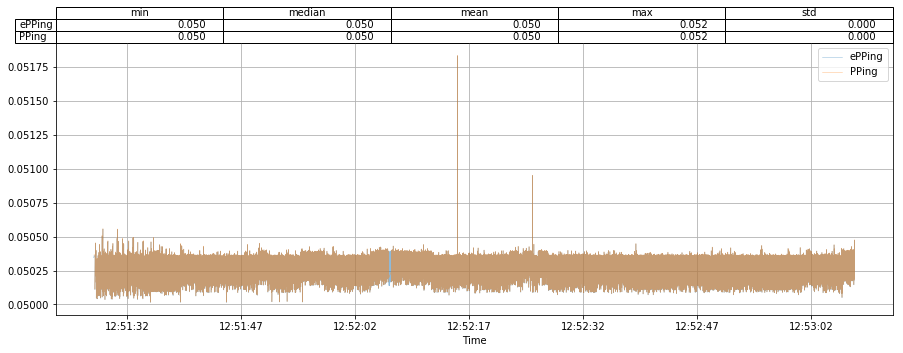

In [11]:
data = {"ePPing": test, "PPing": test2}
fig, axes = plt.subplots(figsize=(15, 5))
complot.plot_pergroup_timeseries(data, "rtt", axes=axes, alpha=0.5, linewidth=0.5)

In [12]:
def parse_tcpdump_info(info_file):
    line_formats = {"captured": "packets captured", 
                    "filtered": "packets received by filter", 
                    "dropped": "packets dropped by kernel"}
    
    with util.open_compressed_file(info_file, mode="rt") as infile:
        lines = infile.readlines()
    
    data = dict()
    for key, line_fmt in line_formats.items():
        for line in lines:
            if line_fmt in line:
                data[key] = int(line.split()[0])
    
    return data

In [13]:
parse_tcpdump_info("epping_tcp_test/2022-05-13T144140/delay_50ms/e_pping/M2/tcpdump_info.txt.xz")

{'captured': 4627228, 'filtered': 4640214, 'dropped': 12986}

In [14]:
test = ppa_viz.parse_epping_rtts("epping_tcp_test/2022-05-13T130721/delay_10ms/e_pping/M2/pping.out.xz")
test2 = parse_kpping_rtts("epping_tcp_test/2022-05-13T130721/delay_10ms/e_pping/M2/packetdump.pcap.xz")

test = test.loc[test["flow"] == get_main_flow(test["flow"])]
test2 = test2.loc[test2["flow"] == get_main_flow(test2["flow"])]

In [15]:
test

,timestamp,rtt,flow
7,2022-05-13 11:08:45.186265469,0.010437,10.70.2.2:8000+10.70.1.2:60048
9,2022-05-13 11:08:45.197028875,0.010418,10.70.2.2:8000+10.70.1.2:60048
12,2022-05-13 11:08:45.224234581,0.010061,10.70.2.2:8000+10.70.1.2:60048
13,2022-05-13 11:08:45.234761477,0.010262,10.70.2.2:8000+10.70.1.2:60048
14,2022-05-13 11:08:45.235788822,0.010023,10.70.2.2:8000+10.70.1.2:60048
...,...,...,...
9961,2022-05-13 11:08:55.210021973,0.010246,10.70.2.2:8000+10.70.1.2:60048
9962,2022-05-13 11:08:55.211064816,0.010245,10.70.2.2:8000+10.70.1.2:60048
9963,2022-05-13 11:08:55.212070942,0.010247,10.70.2.2:8000+10.70.1.2:60048
9964,2022-05-13 11:08:55.213148594,0.010245,10.70.2.2:8000+10.70.1.2:60048


In [16]:
test2

,timestamp,rtt,flow
8,2022-05-13 11:08:45.197035074,0.010495,10.70.2.2:8000+10.70.1.2:60048
14,2022-05-13 11:08:45.224236012,0.010062,10.70.2.2:8000+10.70.1.2:60048
17,2022-05-13 11:08:45.234764099,0.010264,10.70.2.2:8000+10.70.1.2:60048
19,2022-05-13 11:08:45.235790014,0.010024,10.70.2.2:8000+10.70.1.2:60048
21,2022-05-13 11:08:45.236558914,0.010044,10.70.2.2:8000+10.70.1.2:60048
...,...,...,...
19912,2022-05-13 11:08:55.210021973,0.010247,10.70.2.2:8000+10.70.1.2:60048
19914,2022-05-13 11:08:55.211066008,0.010246,10.70.2.2:8000+10.70.1.2:60048
19916,2022-05-13 11:08:55.212073088,0.010249,10.70.2.2:8000+10.70.1.2:60048
19918,2022-05-13 11:08:55.213150024,0.010246,10.70.2.2:8000+10.70.1.2:60048


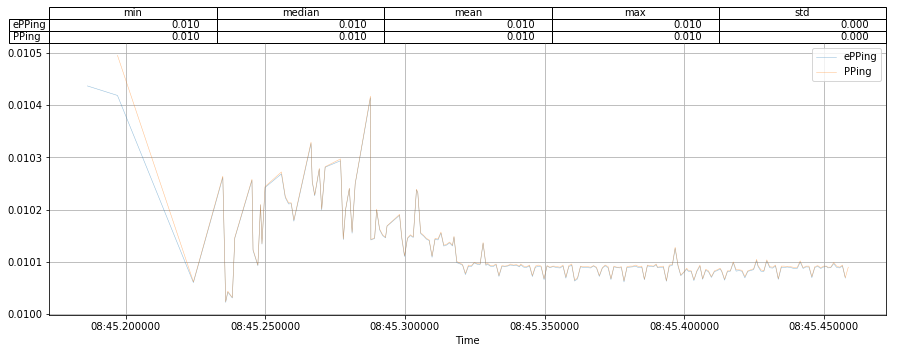

In [17]:
data = {"ePPing": test.iloc[:200], "PPing": test2.iloc[:200]}
fig, axes = plt.subplots(figsize=(15, 5))
complot.plot_pergroup_timeseries(data, "rtt", axes=axes, alpha=0.5, linewidth=0.5)

In [18]:
pd.Series(test2["rtt"].values - test["rtt"].values[1:]).describe()

count    9.955000e+03
mean     1.557877e-06
std      8.849429e-07
min     -2.540000e-07
25%      1.224000e-06
50%      1.537000e-06
75%      1.875000e-06
max      7.663700e-05
dtype: float64

In [19]:
test.resample("S", on="timestamp").size().describe()

count      11.000000
mean      905.090909
std       241.925383
min       214.000000
25%       999.000000
50%      1000.000000
75%      1000.000000
max      1001.000000
dtype: float64

In [20]:
test2.resample("S", on="timestamp").size().describe()

count      11.000000
mean      905.000000
std       241.992975
min       214.000000
25%       999.000000
50%      1000.000000
75%      1000.000000
max      1001.000000
dtype: float64

In [21]:
def _get_tshark_rtts(pcap):
    p = subprocess.run(["tshark", "-r", pcap, "-Y", "tcp.analysis.ack_rtt", 
                        "-e", "frame.time_epoch", "-e", "ip.src", "-e", "tcp.srcport", 
                        "-e", "ip.dst", "-e", "tcp.dstport", "-e", "tcp.analysis.ack_rtt", 
                        "-T", "fields", "-E", "separator=,", "-E", "header=y"],
                       stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    if p.returncode != 0:
        raise ChildProcessError("tshark failed in file {}: {}".format(pcap, p.stderr))
    
    data = pd.read_csv(StringIO(p.stdout))
    
    data2 = pd.DataFrame({"timestamp": pd.to_datetime(data["frame.time_epoch"], unit="s")})
    data2["flow"] = ["{}:{}+{}:{}".format(data.iloc[i]["ip.src"], data.iloc[i]["tcp.srcport"], 
                                          data.iloc[i]["ip.dst"], data.iloc[i]["tcp.dstport"]) 
                     for i in range(len(data))]
    data2["rtt"] = data["tcp.analysis.ack_rtt"]

    return data2

def get_tshark_rtts(pcap):
    return sdl._run_on_xz_file(_get_tshark_rtts, pcap)

In [22]:
test3 = get_tshark_rtts("epping_tcp_test/2022-05-13T130721/delay_10ms/e_pping/M2/packetdump.pcap.xz")

In [23]:
test3

,timestamp,flow,rtt
0,2022-05-13 11:08:45.143429041,10.70.2.2:8000+10.70.1.2:60046,0.010557
1,2022-05-13 11:08:45.143637180,10.70.1.2:60046+10.70.2.2:8000,0.000208
2,2022-05-13 11:08:45.154090881,10.70.2.2:8000+10.70.1.2:60046,0.010378
3,2022-05-13 11:08:45.154382944,10.70.1.2:60046+10.70.2.2:8000,0.000281
4,2022-05-13 11:08:45.164797068,10.70.2.2:8000+10.70.1.2:60046,0.010248
...,...,...,...
19106,2022-05-13 11:08:55.234901190,10.70.2.2:8000+10.70.1.2:60046,0.010318
19107,2022-05-13 11:08:55.235178947,10.70.1.2:60046+10.70.2.2:8000,0.000249
19108,2022-05-13 11:08:55.245838165,10.70.1.2:60046+10.70.2.2:8000,0.000266
19109,2022-05-13 11:08:55.256448984,10.70.2.2:8000+10.70.1.2:60046,0.010279


In [24]:
test3 = test3.loc[test3["flow"] == get_main_flow(test3["flow"])]

In [25]:
test3

,timestamp,flow,rtt
7,2022-05-13 11:08:45.186268091,10.70.2.2:8000+10.70.1.2:60048,0.010439
9,2022-05-13 11:08:45.197034836,10.70.2.2:8000+10.70.1.2:60048,0.010425
12,2022-05-13 11:08:45.224236250,10.70.2.2:8000+10.70.1.2:60048,0.010059
13,2022-05-13 11:08:45.224327087,10.70.2.2:8000+10.70.1.2:60048,0.010110
14,2022-05-13 11:08:45.224335909,10.70.2.2:8000+10.70.1.2:60048,0.010115
...,...,...,...
19097,2022-05-13 11:08:55.212072849,10.70.2.2:8000+10.70.1.2:60048,0.010216
19098,2022-05-13 11:08:55.212585926,10.70.2.2:8000+10.70.1.2:60048,0.010215
19099,2022-05-13 11:08:55.213150024,10.70.2.2:8000+10.70.1.2:60048,0.010213
19100,2022-05-13 11:08:55.213658810,10.70.2.2:8000+10.70.1.2:60048,0.010202


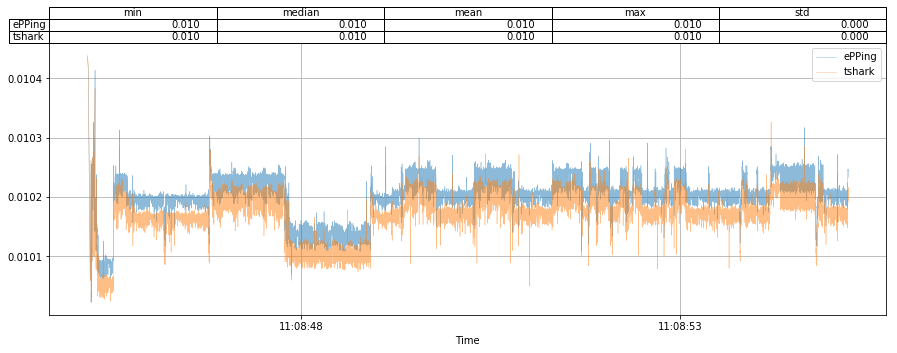

In [26]:
data = {"ePPing": test, "tshark": test3}
fig, axes = plt.subplots(figsize=(15, 5))
complot.plot_pergroup_timeseries(data, "rtt", axes=axes, alpha=0.5, linewidth=0.5)

In [27]:
test3.resample("ms", on="timestamp").mean()

,rtt
timestamp,
2022-05-13 11:08:45.186,0.010439
2022-05-13 11:08:45.187,NaN
2022-05-13 11:08:45.188,NaN
2022-05-13 11:08:45.189,NaN
2022-05-13 11:08:45.190,NaN
...,...
2022-05-13 11:08:55.210,0.010213
2022-05-13 11:08:55.211,0.010205
2022-05-13 11:08:55.212,0.010215


In [28]:
test2.resample("ms", on="timestamp").mean()

,rtt
timestamp,
2022-05-13 11:08:45.197,0.010495
2022-05-13 11:08:45.198,NaN
2022-05-13 11:08:45.199,NaN
2022-05-13 11:08:45.200,NaN
2022-05-13 11:08:45.201,NaN
...,...
2022-05-13 11:08:55.209,NaN
2022-05-13 11:08:55.210,0.010247
2022-05-13 11:08:55.211,0.010246


In [29]:
test.resample("ms", on="timestamp").mean()

,rtt
timestamp,
2022-05-13 11:08:45.186,0.010437
2022-05-13 11:08:45.187,NaN
2022-05-13 11:08:45.188,NaN
2022-05-13 11:08:45.189,NaN
2022-05-13 11:08:45.190,NaN
...,...
2022-05-13 11:08:55.209,NaN
2022-05-13 11:08:55.210,0.010246
2022-05-13 11:08:55.211,0.010245


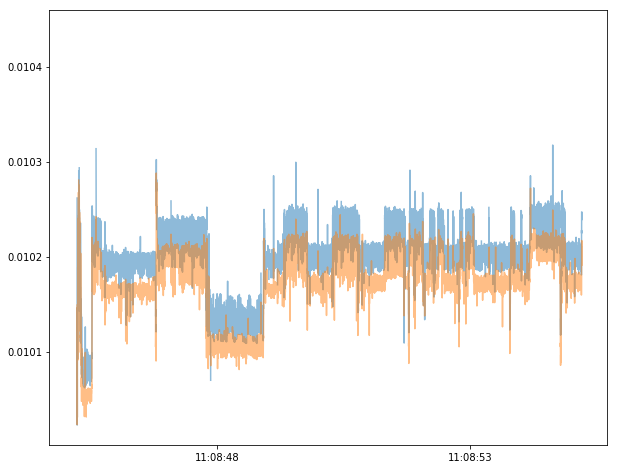

In [30]:
fig, axes = plt.subplots(figsize=(10, 8))

data1 = test.resample("ms", on="timestamp").mean()
axes.plot(data1.index.values, data1.values, alpha=0.5)

data2 = test3.resample("ms", on="timestamp").mean()
axes.plot(data2.index.values, data2.values, alpha=0.5)

In [31]:
import scipy.stats as stats

In [32]:
idx = np.array(sorted(set(data1.dropna().index).intersection(set(data2.dropna().index))))

d1 = data1.loc[idx].values
d2 = data2.loc[idx].values
stats.pearsonr(d1, d2)

(array([0.98238064]), array([0.]))

In [33]:
stats.spearmanr(d1, d2, nan_policy="omit")

SpearmanrResult(correlation=0.9556629722162376, pvalue=0.0)

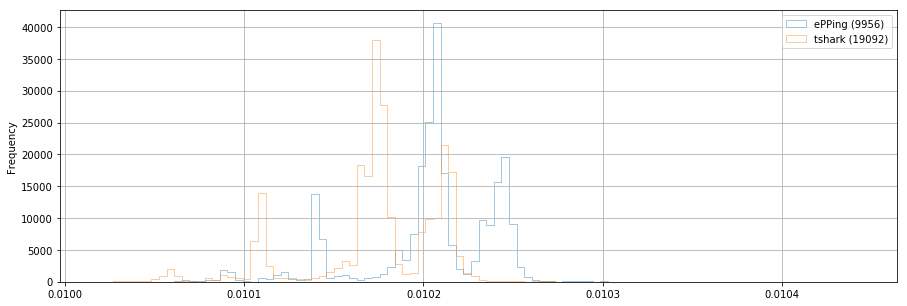

In [34]:
data = {"ePPing": test, "tshark": test3}
fig, axes = plt.subplots(figsize=(15, 5))
complot.plot_pergroup_histogram(data, "rtt", axes=axes, alpha=0.8, linewidth=0.5)

In [35]:
def _get_tcptrace_rtts(pcap):
    p = subprocess.run([os.path.expanduser("~/src/tcptrace/tcptrace"), "-Z", "-b", pcap], 
                       stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)
    if p.returncode != 0:
        raise ChildProcessError("tcptrace failed on file {}: {}".format(pcap, p.stderr))
    
    dfs = list()
    folder = os.path.dirname(pcap)
    flow_mapping = parse_tcptrace_flow_mapping(p.stdout)
    
    for flow_abr, flow in flow_mapping.items():
        rtt_file = flow_abr + "_rttraw.dat"
        rtts = pd.read_csv(rtt_file, sep=" ", header=None, names=["firstbyte", "rtt"])
        rtts["rtt"] = rtts["rtt"] * 1e-6
        rtts["flow"] = flow
        os.remove(rtt_file)
        dfs.append(rtts)
    
    return pd.concat(dfs, ignore_index=True)

def get_tcptrace_rtts(pcap):
    return sdl._run_on_xz_file(_get_tcptrace_rtts, pcap)

def parse_tcptrace_flow_mapping(text):
    flow_mapping = dict()
    for line in text.split("\n"):
        mapping = parse_tcptrace_flow_mapping_line(line)
        if mapping is not None:
            flow_mapping.update(mapping)
    return flow_mapping
        
def is_tcptrace_flow_mapping_line(line):
    return re.match("^\s*\d+: [\d\.:]+ - [\d\.:]+ \([a-z]2[a-z]\)", line) is not None

def parse_tcptrace_flow_mapping_line(line):
    if not is_tcptrace_flow_mapping_line(line):
        return None
    
    words = line.split()
    dst = words[1]
    src = words[3]
    src_letter, dst_letter = words[4][1:-1].split("2")
    return {"{}2{}".format(src_letter, dst_letter): "{}+{}".format(src, dst),
            "{}2{}".format(dst_letter, src_letter): "{}+{}".format(dst, src)}

In [36]:
test4 = get_tcptrace_rtts("epping_tcp_test/2022-05-13T130721/delay_10ms/e_pping/M2/packetdump.pcap.xz")

In [37]:
test4

,firstbyte,rtt,flow
0,1871977799,0.010557,10.70.2.2:8000+10.70.1.2:60046
1,1871977800,0.010378,10.70.2.2:8000+10.70.1.2:60046
2,1871977837,0.010248,10.70.2.2:8000+10.70.1.2:60046
3,1871977841,0.010390,10.70.2.2:8000+10.70.1.2:60046
4,1871977961,0.010131,10.70.2.2:8000+10.70.1.2:60046
...,...,...,...
19106,2482253662,0.010213,10.70.2.2:8000+10.70.1.2:60048
19107,2482318822,0.010202,10.70.2.2:8000+10.70.1.2:60048
19108,2482383982,0.010191,10.70.2.2:8000+10.70.1.2:60048
19109,3676336557,0.000272,10.70.1.2:60048+10.70.2.2:8000


In [38]:
test4["flow"].value_counts()

10.70.2.2:8000+10.70.1.2:60048    19092
10.70.1.2:60046+10.70.2.2:8000        9
10.70.2.2:8000+10.70.1.2:60046        8
10.70.1.2:60048+10.70.2.2:8000        2
Name: flow, dtype: int64

In [39]:
test4 = test4.loc[test4["flow"] == get_main_flow(test4["flow"])]

In [40]:
len(test), len(test2), len(test3), len(test4)

(9956, 9955, 19092, 19092)

In [41]:
(test4["rtt"] - test3["rtt"]).describe()

count    1.908500e+04
mean    -5.606497e-09
std      1.864843e-05
min     -2.130000e-04
25%     -4.000000e-06
50%     -1.734723e-18
75%      4.000000e-06
max      3.900000e-04
Name: rtt, dtype: float64

In [42]:
stats.pearsonr(test3["rtt"].values, test4["rtt"].values)

(1.0, 0.0)

In [43]:
stats.spearmanr(test3["rtt"].values, test4["rtt"].values)

SpearmanrResult(correlation=0.9999999999999999, pvalue=0.0)

In [44]:
stats.pearsonr(test["rtt"].values[1:], test2["rtt"].values)

(0.9997079016516685, 0.0)

In [45]:
stats.spearmanr(test["rtt"].values[1:], test2["rtt"].values)

SpearmanrResult(correlation=0.9992761494542937, pvalue=0.0)

In [46]:
def get_epping_file(subfolder):
    return ppa_viz.get_file_with_unknown_suffix(
        os.path.join(subfolder, "e_pping", "M2"), "pping.out")

def get_pcap_file(subfolder):
    return ppa_viz.get_file_with_unknown_suffix(
        os.path.join(subfolder, "e_pping", "M2"), "packetdump.pcap")

def get_tcpdump_info_file(subfolder):
    return ppa_viz.get_file_with_unknown_suffix(
        os.path.join(subfolder, "e_pping", "M2"), "tcpdump_info.txt")

In [47]:
def _filter_and_format_data(df, srcip="10.70.2.2", delay=None):
    df = df.loc[df["flow"] == get_main_flow(df["flow"], srcip=srcip)].copy()
    df["rtt_ms"] = df["rtt"] * 1e3
    if delay is not None:
        df["rtt_off"] = df["rtt"] - delay * 1e-3
        df["rtt_off_ms"] = df["rtt_off"] * 1e3
    return df

In [48]:
def load_all_rtt_data(root_folder, srcip="10.70.2.2"):
    data = dict()
    for folder in os.listdir(root_folder):
        delay_path = os.path.join(root_folder, folder)
        if os.path.isdir(delay_path) and folder.startswith("delay_"):
            delay = int(folder.split("_")[1][:-2])
            
            dump_info = parse_tcpdump_info(get_tcpdump_info_file(delay_path))
            if dump_info["dropped"] > 0:
                print("Warning: tcpdump dropped packets in {}".format(
                    os.path.join(root_folder, folder)), file=sys.stderr)
            
            data[delay] = dict()
            epping_file = get_epping_file(delay_path)
            data[delay]["ePPing"] = _filter_and_format_data(
                ppa_viz.parse_epping_rtts(epping_file), srcip=srcip, delay=delay)
            
            pcap = get_pcap_file(delay_path)
            data[delay]["PPing"] = _filter_and_format_data(
                parse_kpping_rtts(pcap), srcip=srcip, delay=delay)
            data[delay]["tshark"] = _filter_and_format_data(
                get_tshark_rtts(pcap), srcip=srcip, delay=delay)
            data[delay]["tcptrace"] = _filter_and_format_data(
                get_tcptrace_rtts(pcap), srcip=srcip, delay=delay)
    
    return data

<a id="res_balanced"></a>
## Result with tuned-adm profile balanced (default)

In [49]:
%%time
data1 = load_all_rtt_data("pping_testing/tcp_rtt_accuracy/balanced/2022-05-15T125645")
data = data1

CPU times: user 1min 6s, sys: 397 ms, total: 1min 7s
Wall time: 3min 43s


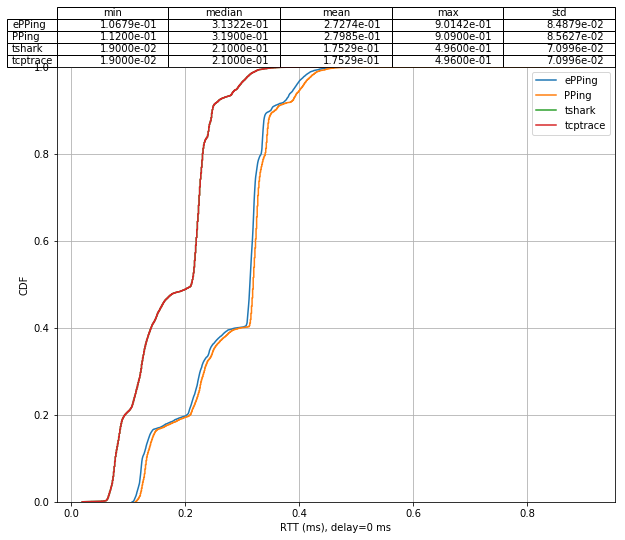

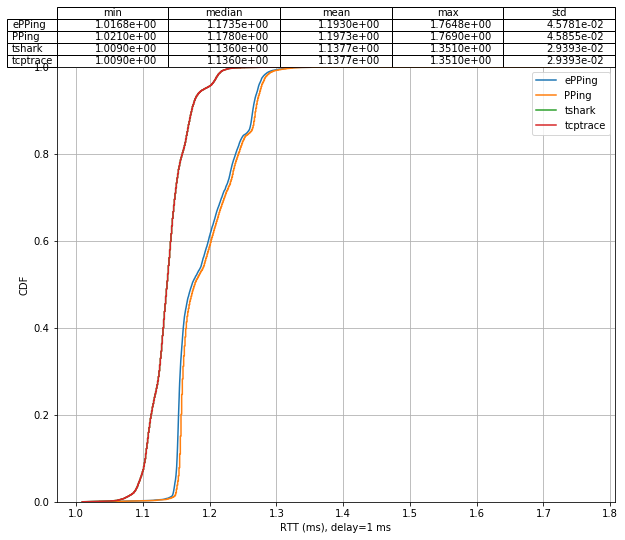

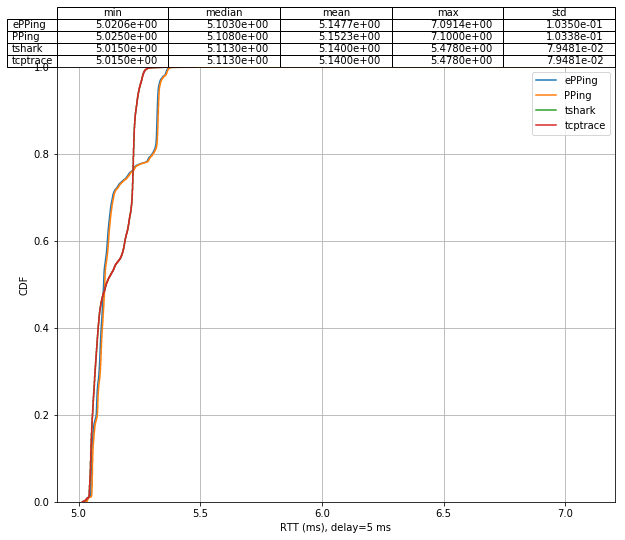

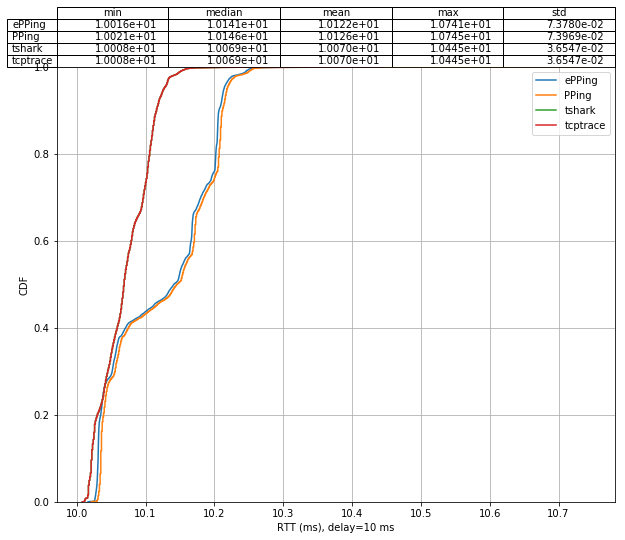

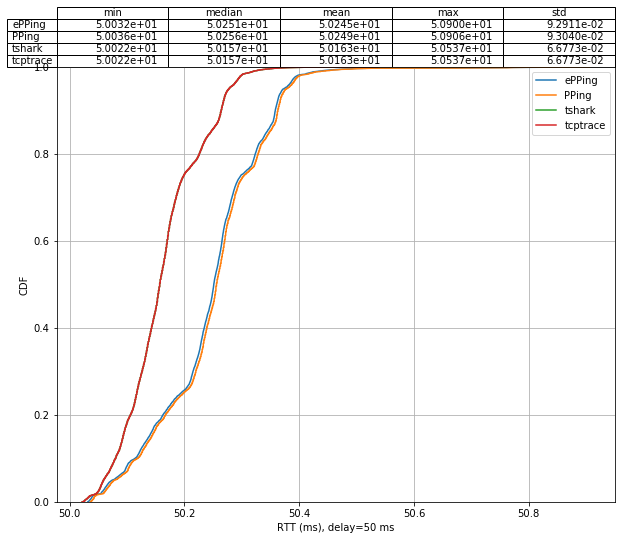

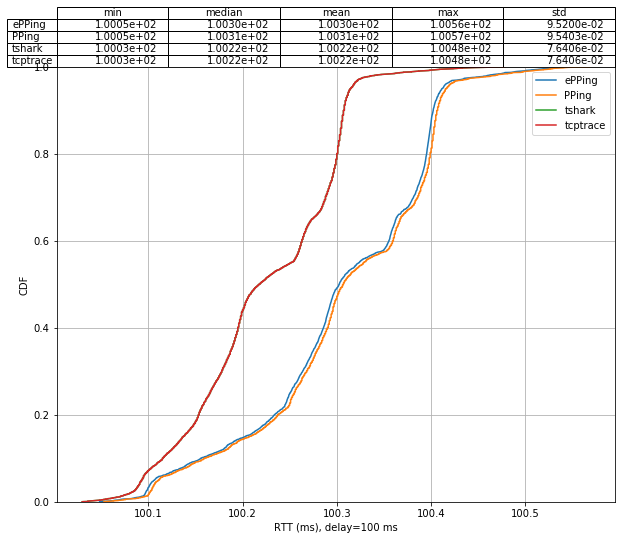

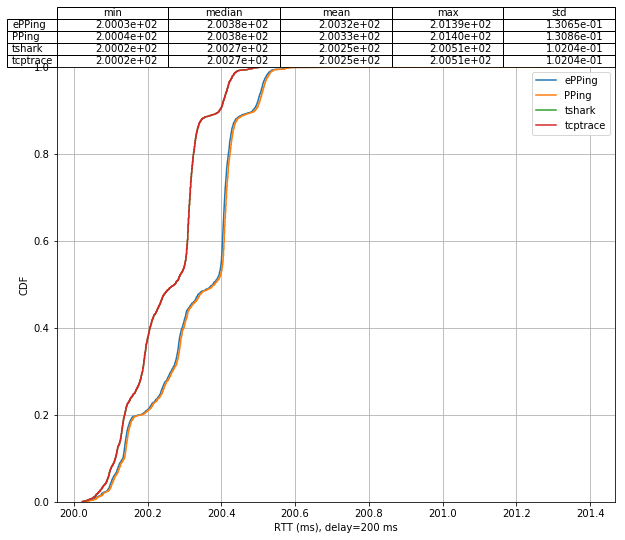

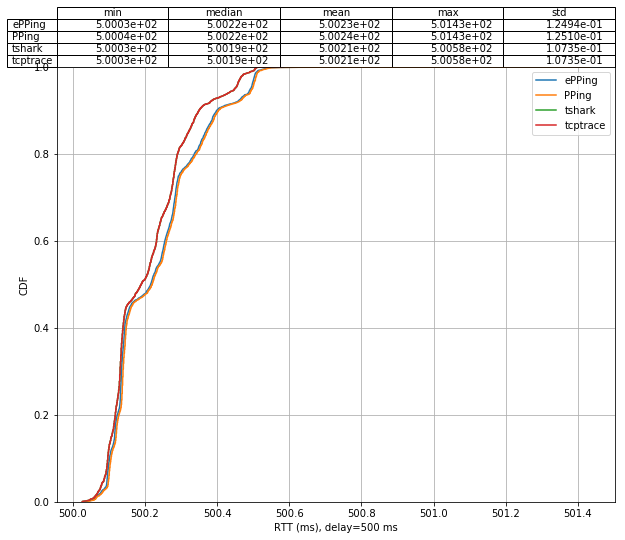

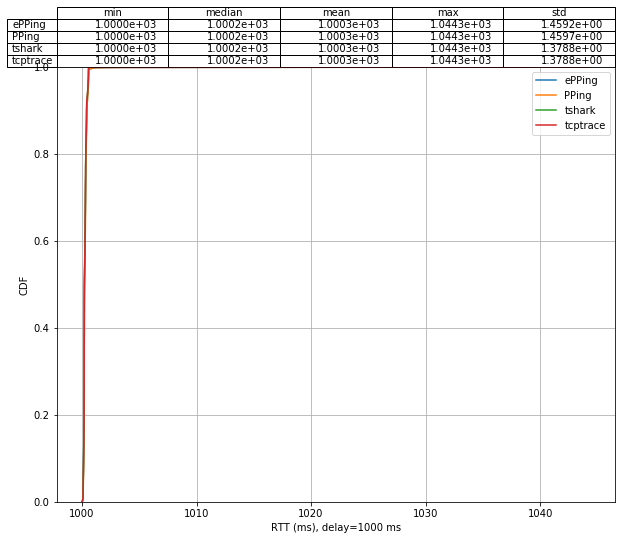

In [50]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT (ms), delay={} ms".format(delay))

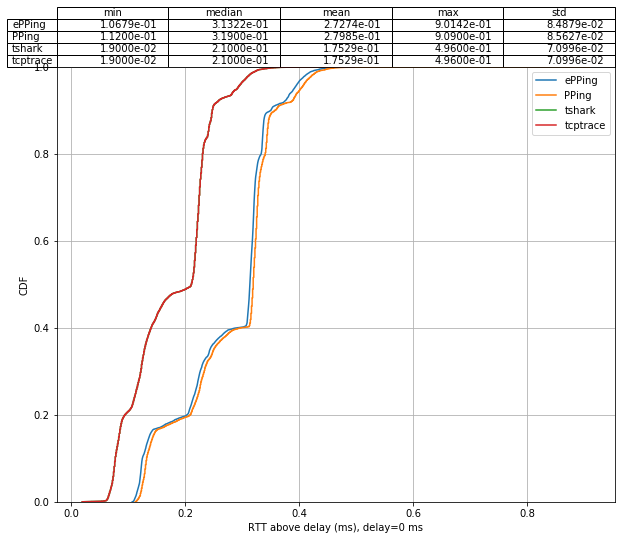

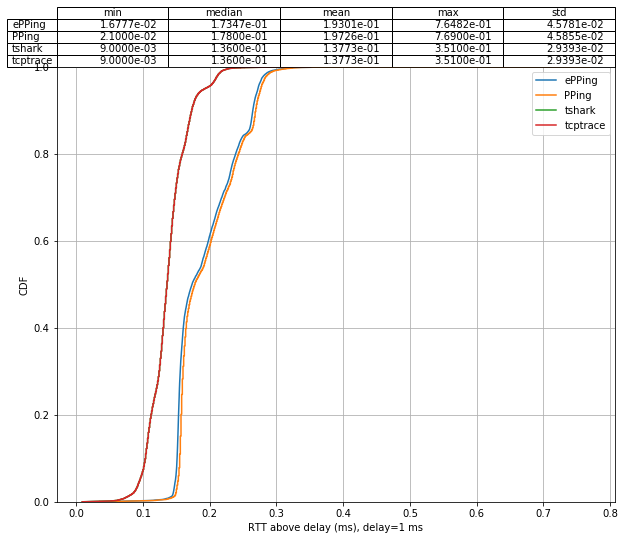

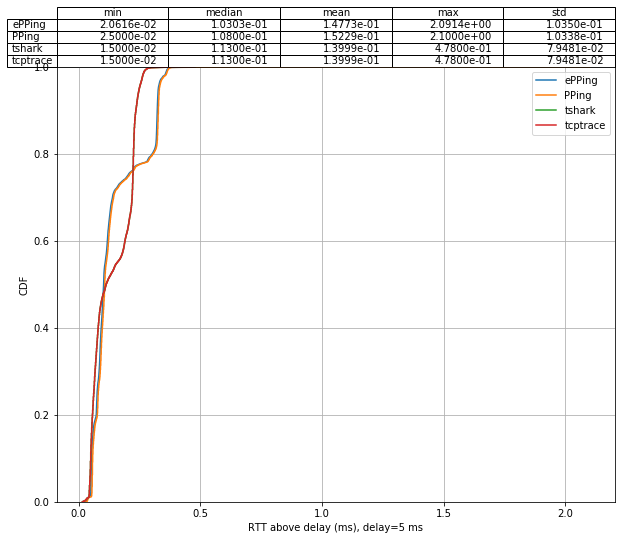

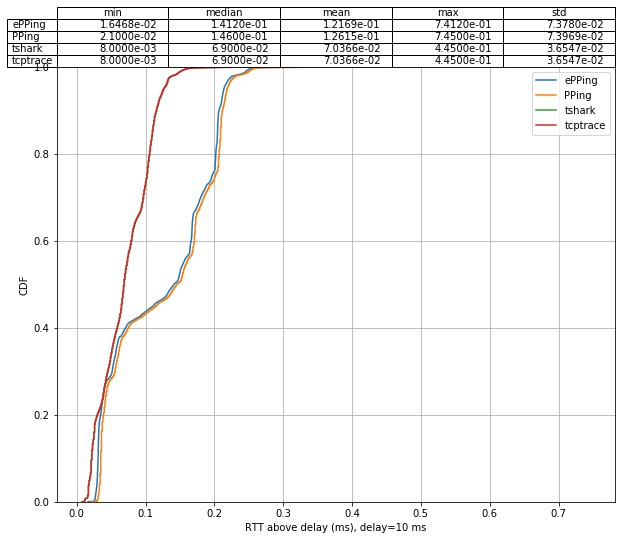

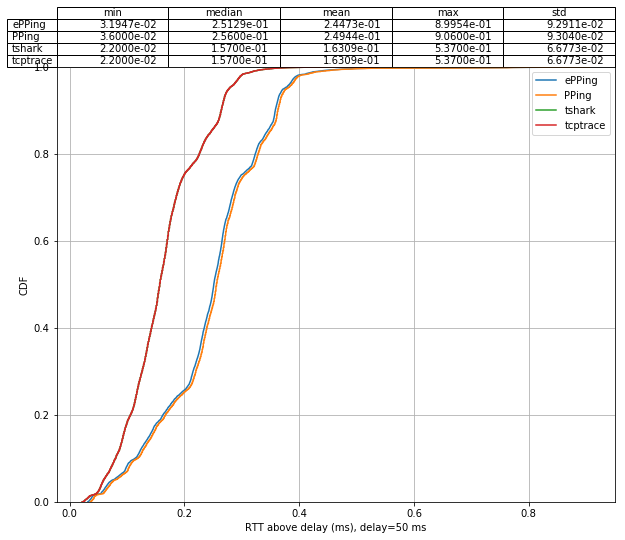

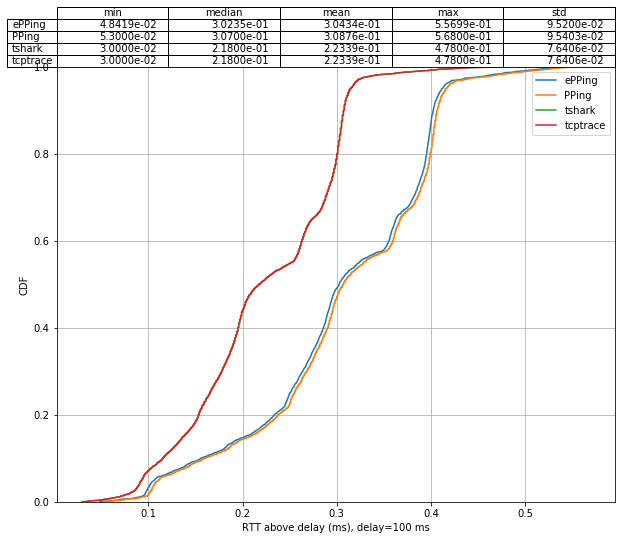

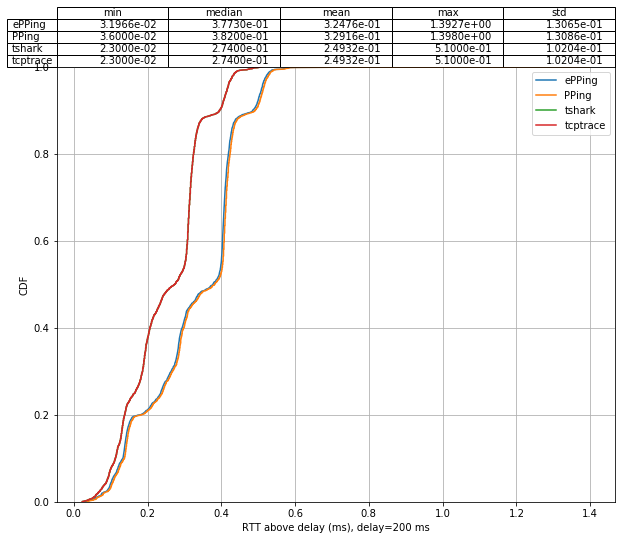

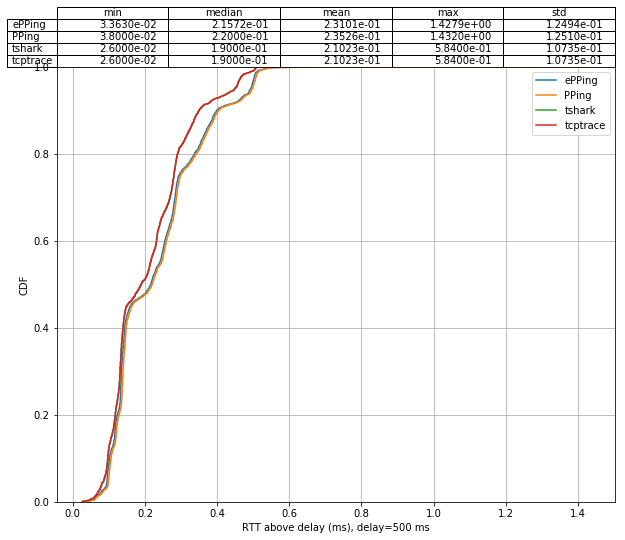

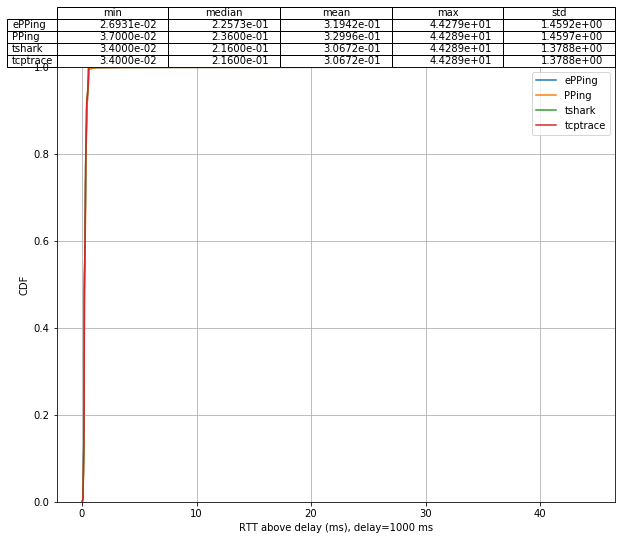

In [51]:
# Same as above, just with RTT - netem delay
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_off_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT above delay (ms), delay={} ms".format(delay))

In [52]:
# Checking if there's any difference between tshark and tcptrace at all
# Turns out only difference seems to be due to rounding errors (all differences are much smaller than nanoseconds)
for delay in sorted(data.keys()):
    rtt1 = data[delay]["tshark"]["rtt"].values
    rtt2 = data[delay]["tcptrace"]["rtt"].values
    
    print("delay = {}ms, equal: {}, close: {}".format(
        delay, (rtt1 == rtt2).all(), np.isclose(rtt1, rtt2, rtol=0, atol=1e-10).all()))

delay = 0ms, equal: False, close: True
delay = 1ms, equal: False, close: True
delay = 5ms, equal: False, close: True
delay = 10ms, equal: False, close: True
delay = 50ms, equal: False, close: True
delay = 100ms, equal: False, close: True
delay = 200ms, equal: False, close: True
delay = 500ms, equal: False, close: True
delay = 1000ms, equal: False, close: True


Difference: PPing - ePPing


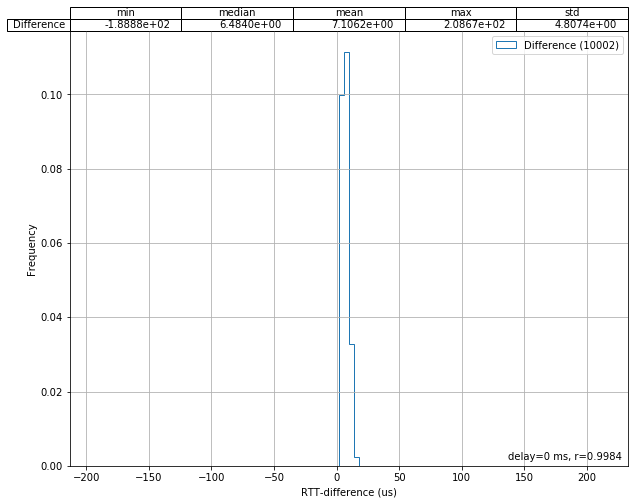

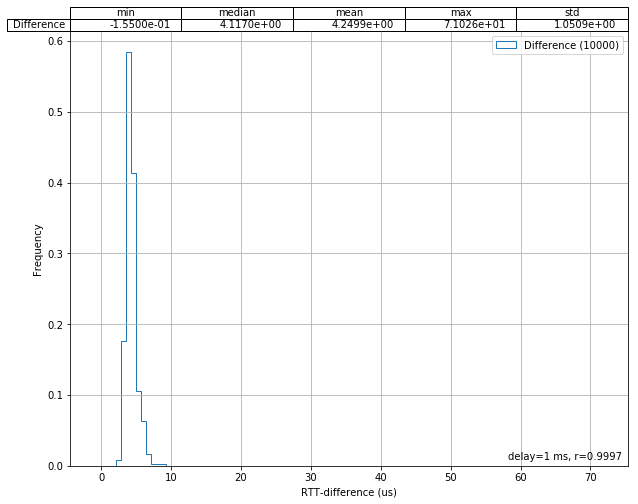

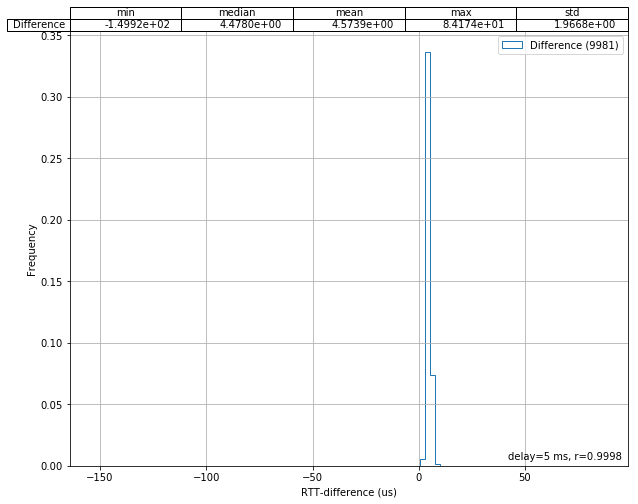

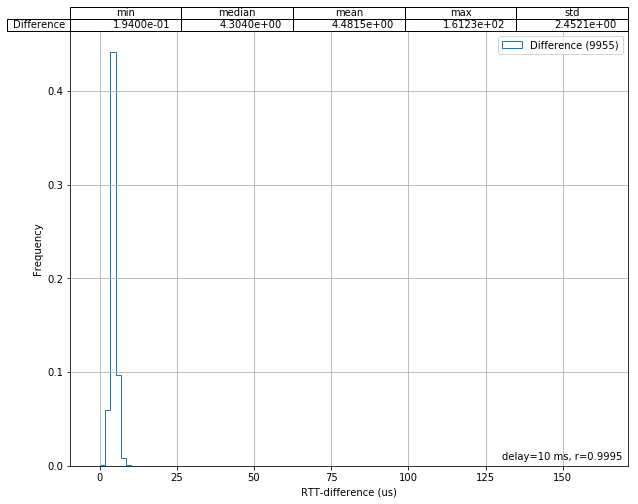

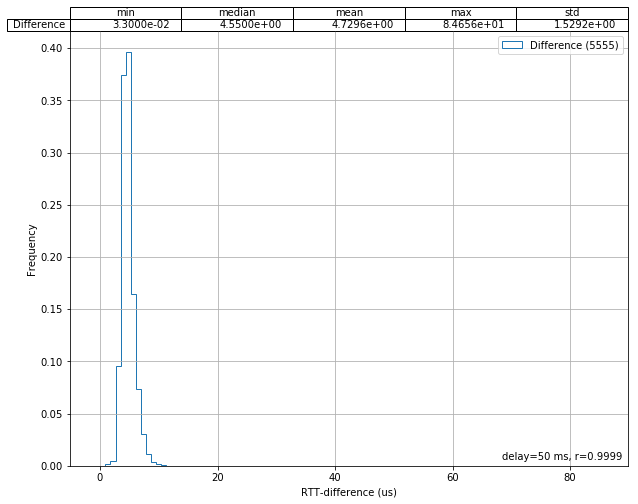

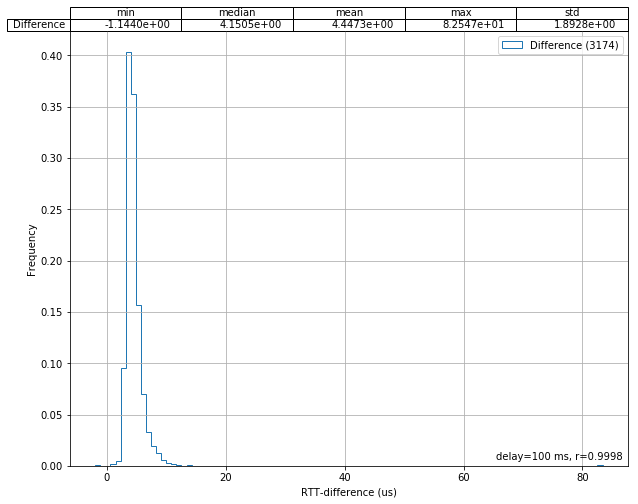

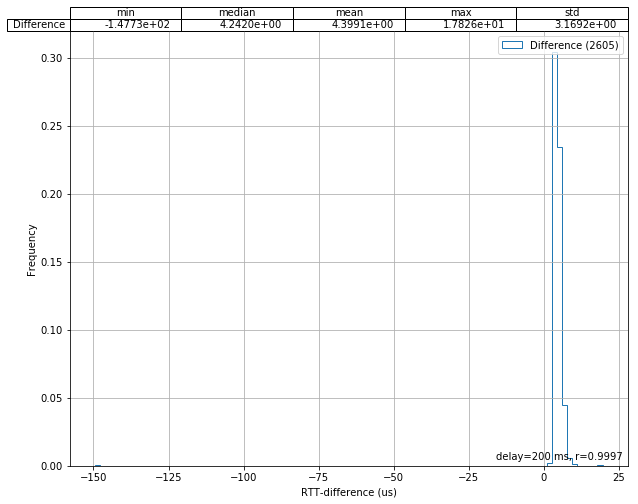

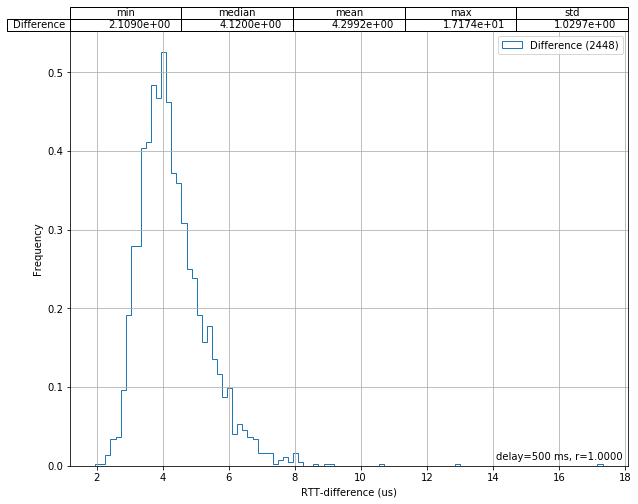

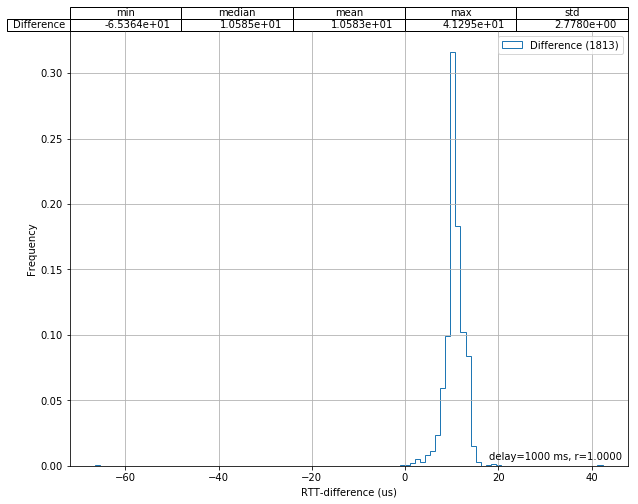

In [53]:
print("Difference: PPing - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["PPing"]
    d2 = data[delay]["ePPing"]
    
    if len(d2) == len(d1) + 1:
        d2 = d2.iloc[1:]
    if len(d2) != len(d1):
        print("Warning, for delay {} PPing {} entries, ePPing {} entries".format(
            delay, len(d1), len(d2)), file=sys.stderr)
        continue
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

Difference: tshark - ePPing


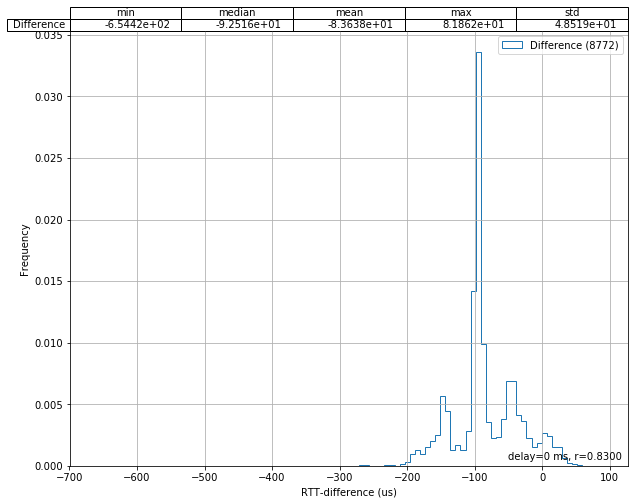

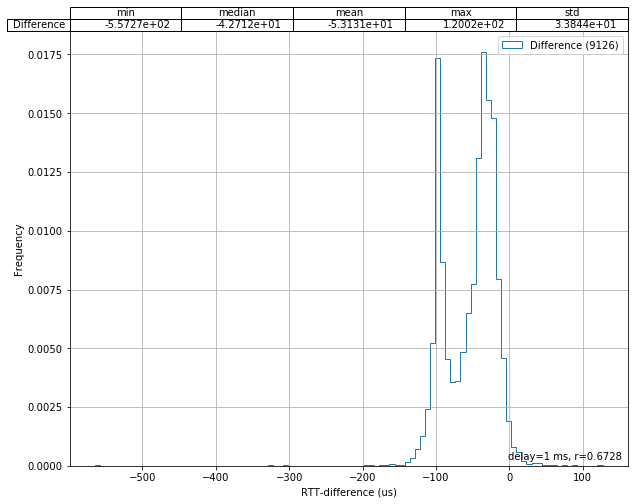

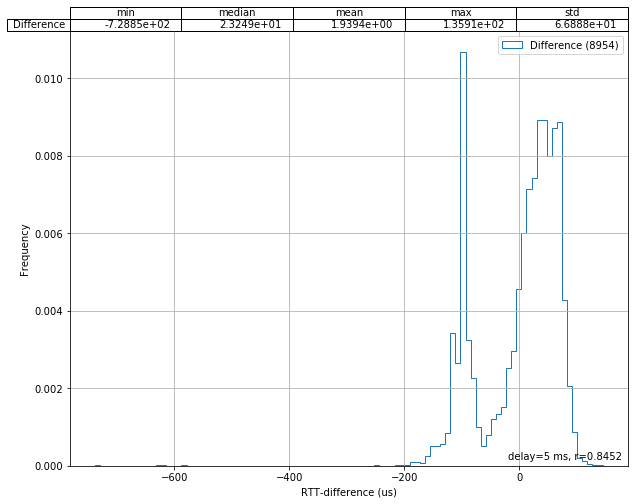

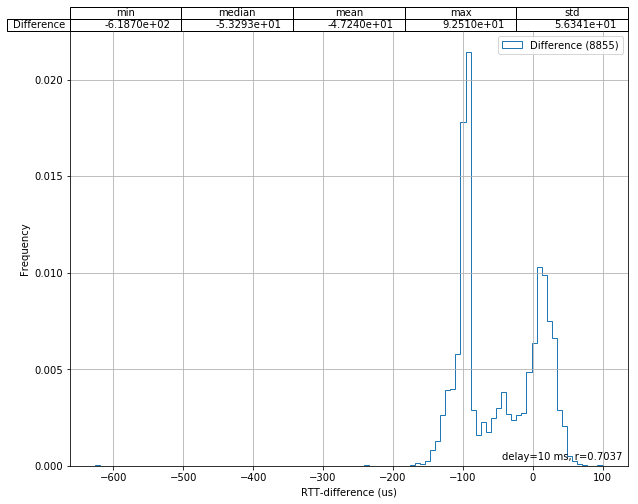

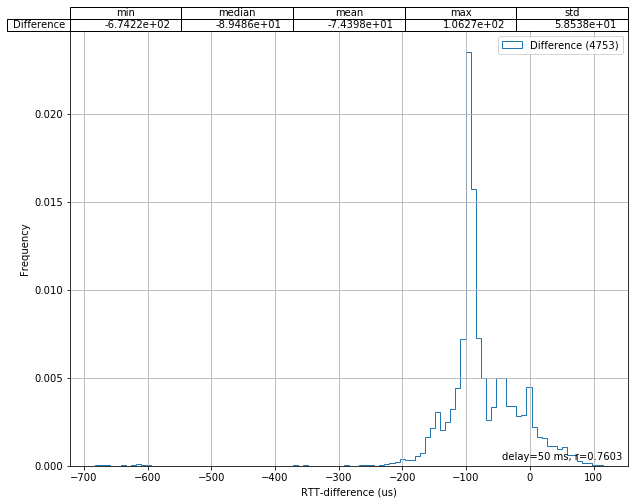

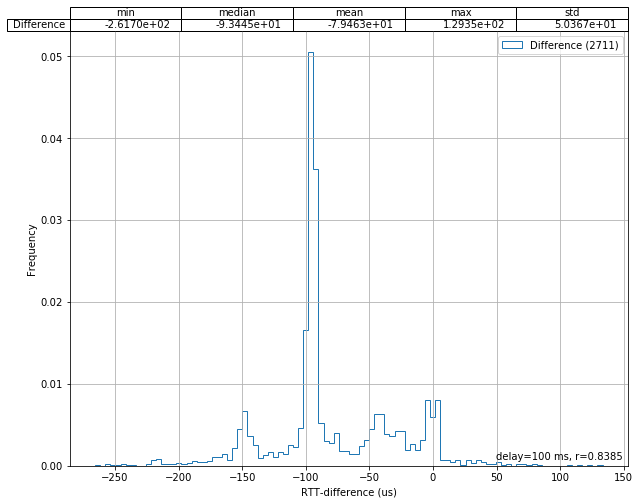

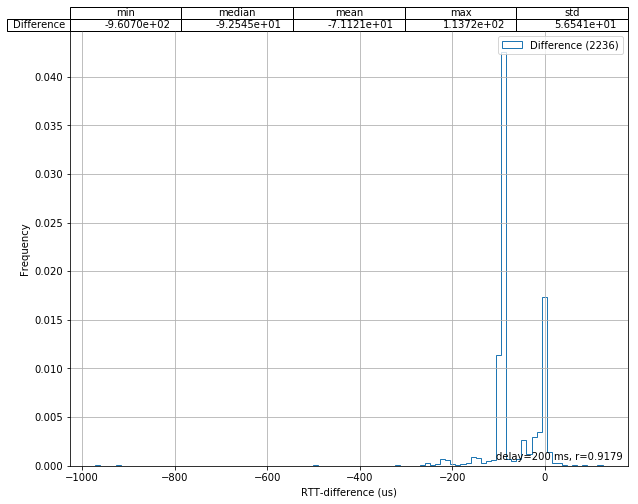

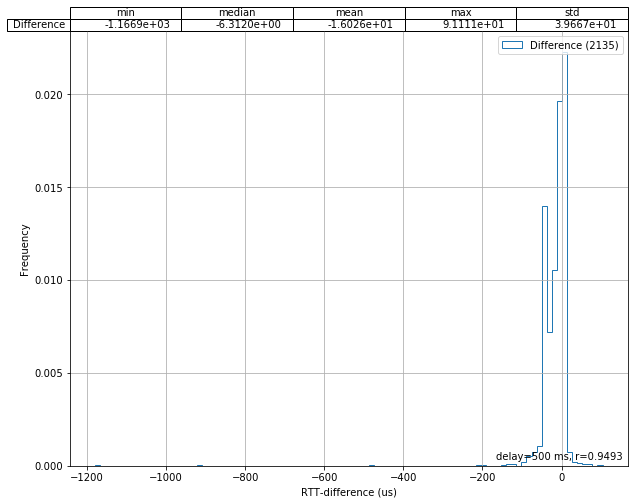

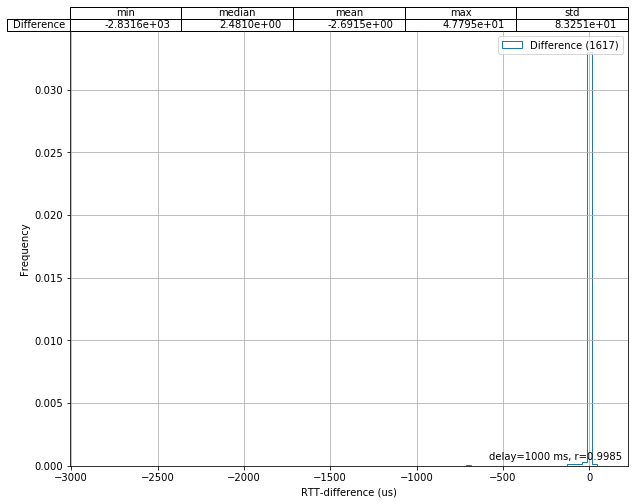

In [54]:
# Averaged per ms (because tshark and ePPing RTTs do not map 1 to 1)
print("Difference: tshark - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt"].mean()
    common_idx = list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index)))
    d1 = pd.DataFrame({"rtt": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"rtt": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

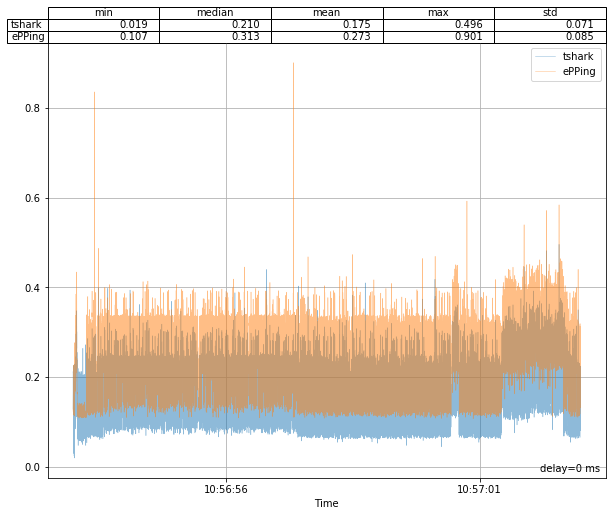

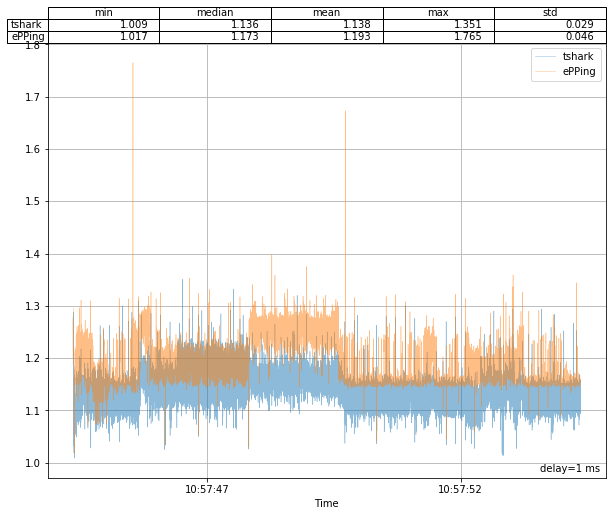

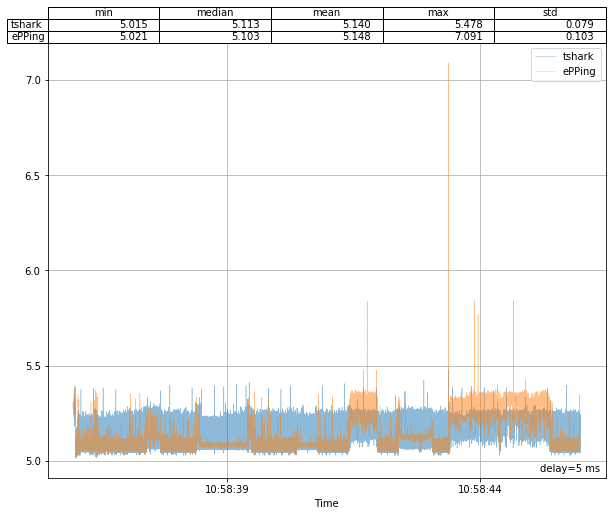

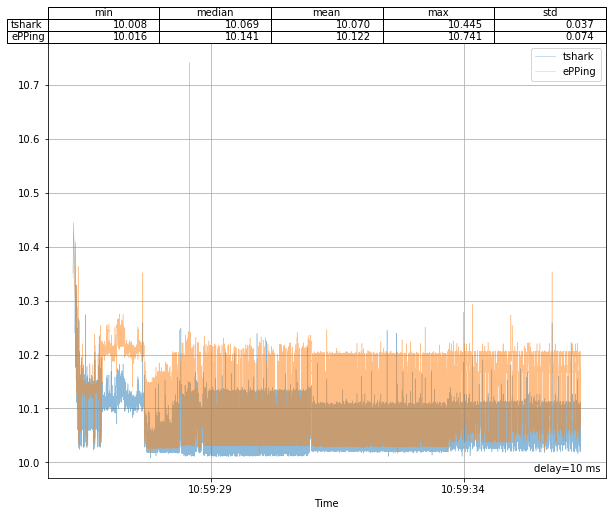

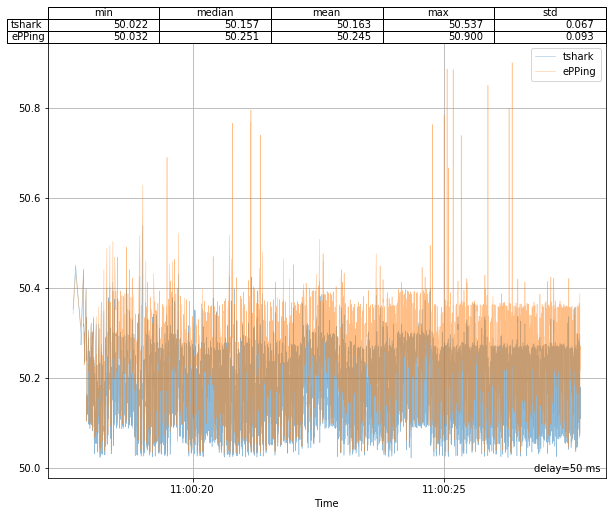

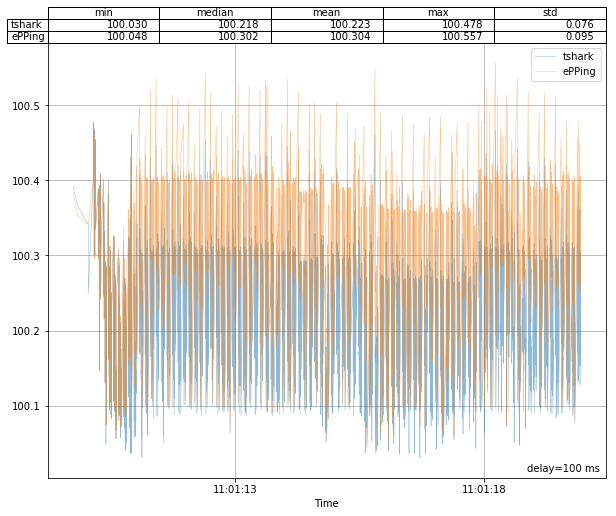

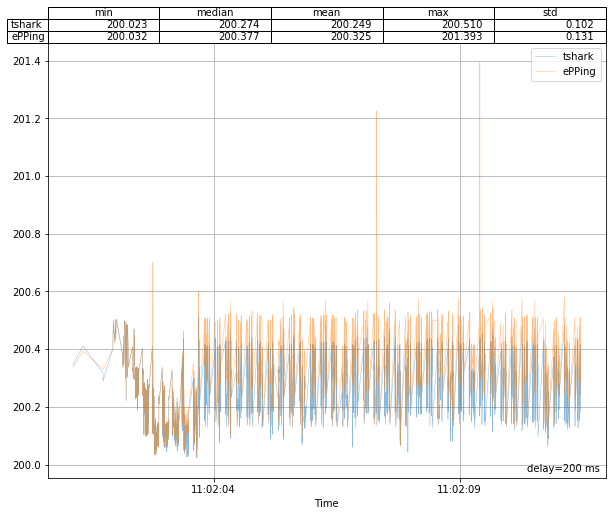

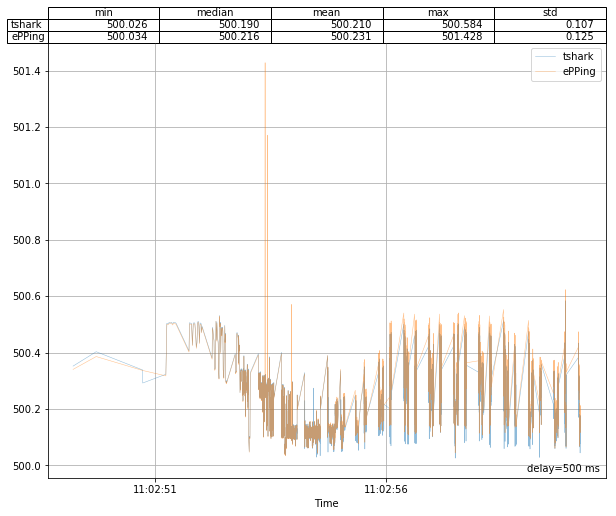

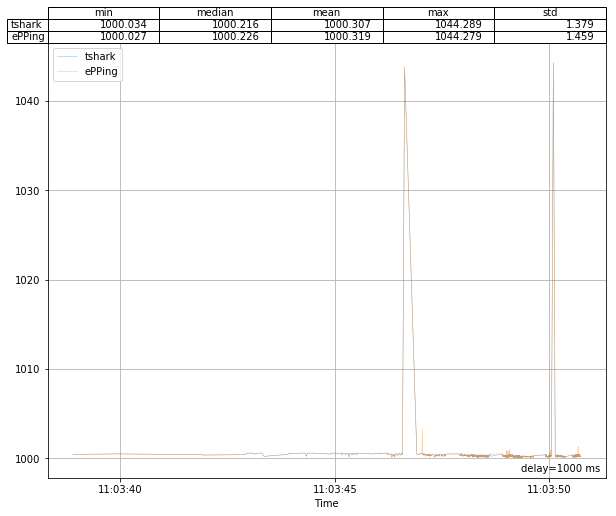

In [55]:
# Simple timeseries
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms".format(delay), 
              va="bottom", ha="right", transform=axes.transAxes)

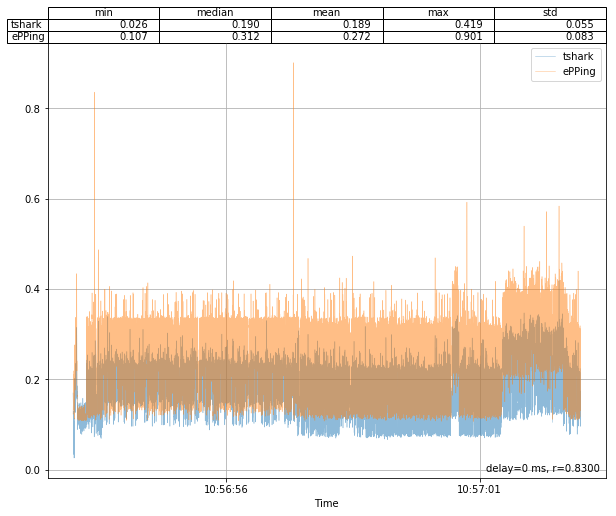

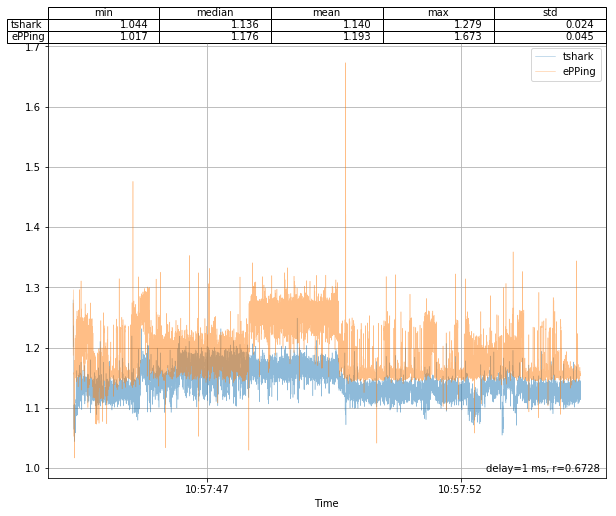

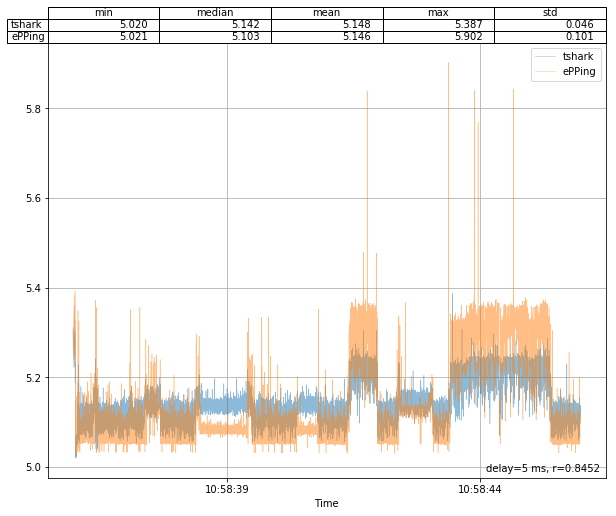

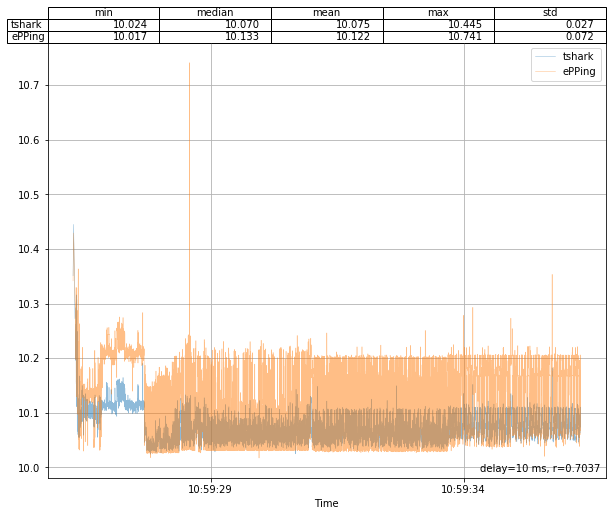

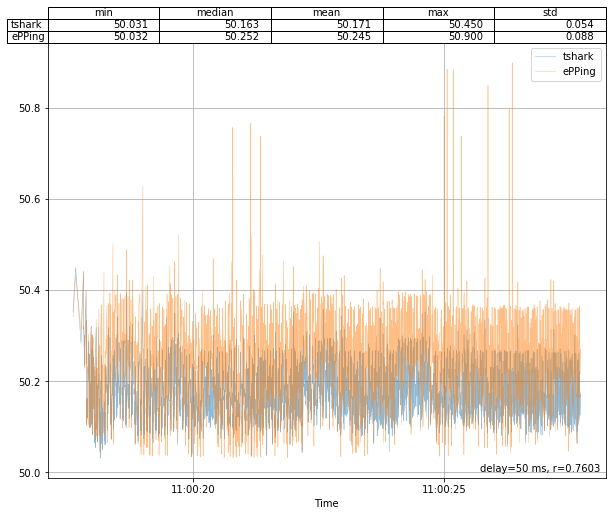

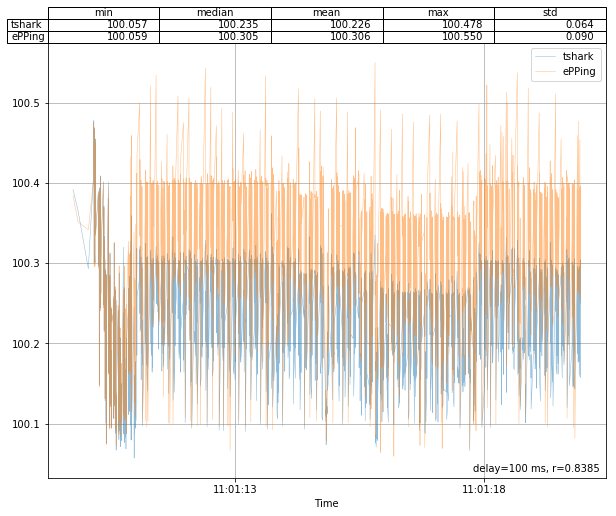

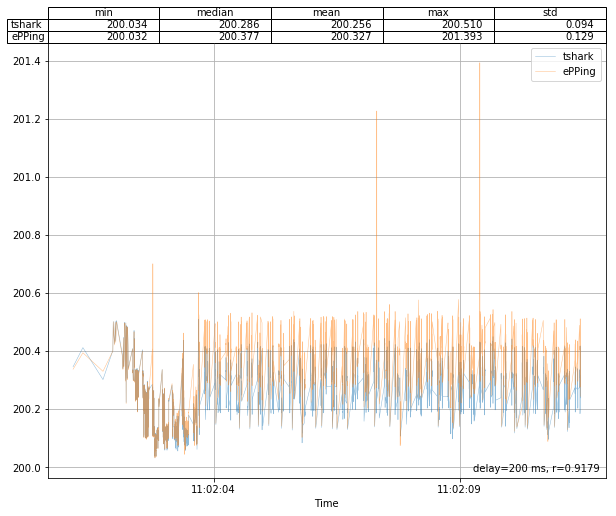

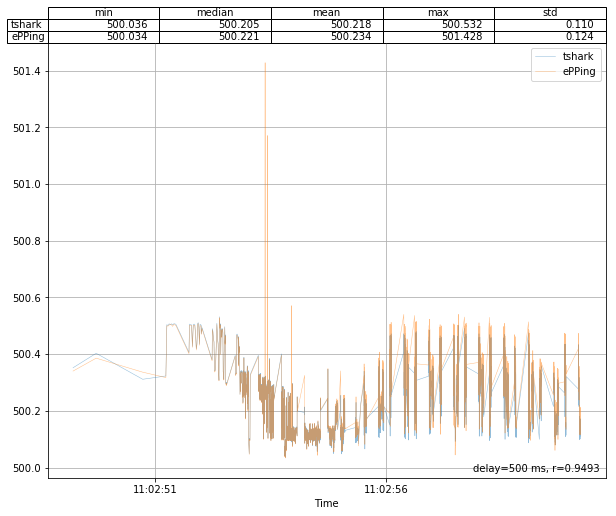

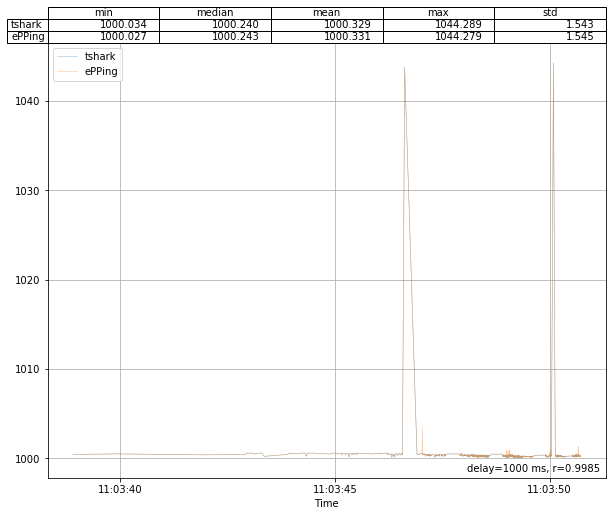

In [56]:
# Averaged per ms
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt_ms"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt_ms"].mean()
    common_idx = sorted(list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index))))
    d1 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt_ms"].values, d2["rtt_ms"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

<a id="res_latperf"></a>
## Results with tuned-adm profile latency-performance

In [57]:
%%time
data2 = load_all_rtt_data("pping_testing/tcp_rtt_accuracy/latencyperf/2022-05-15T124833")
data = data2

CPU times: user 1min 40s, sys: 469 ms, total: 1min 40s
Wall time: 4min 19s


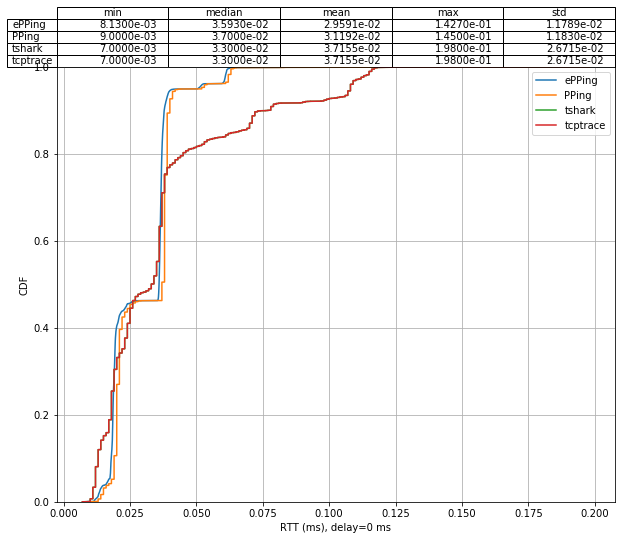

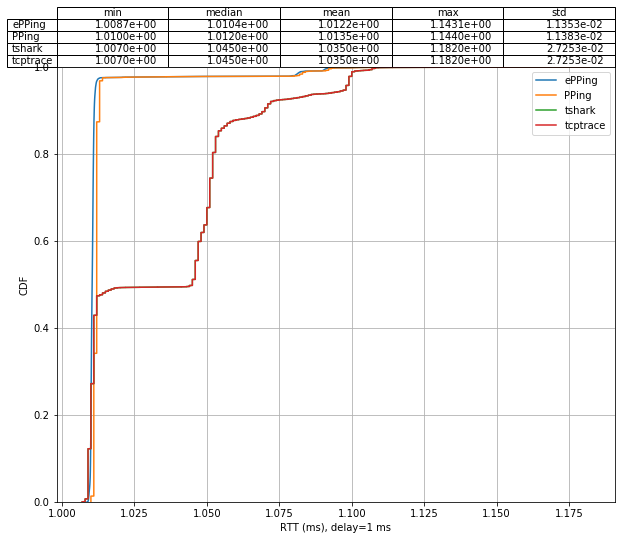

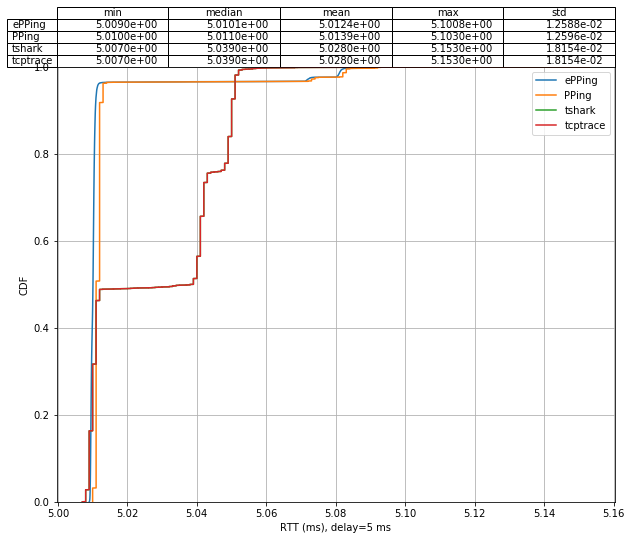

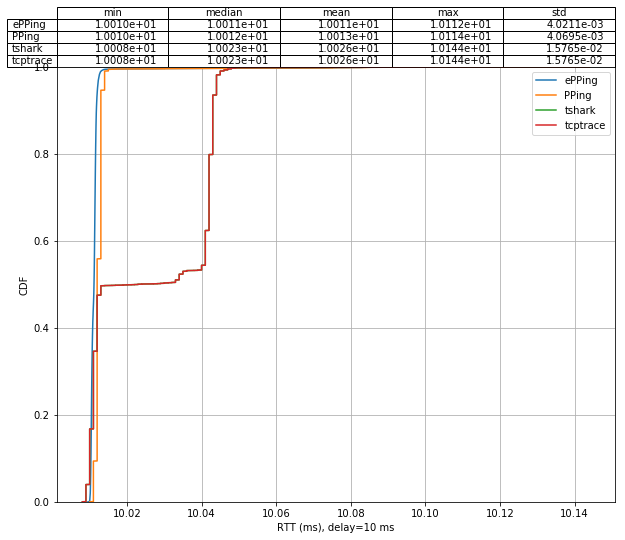

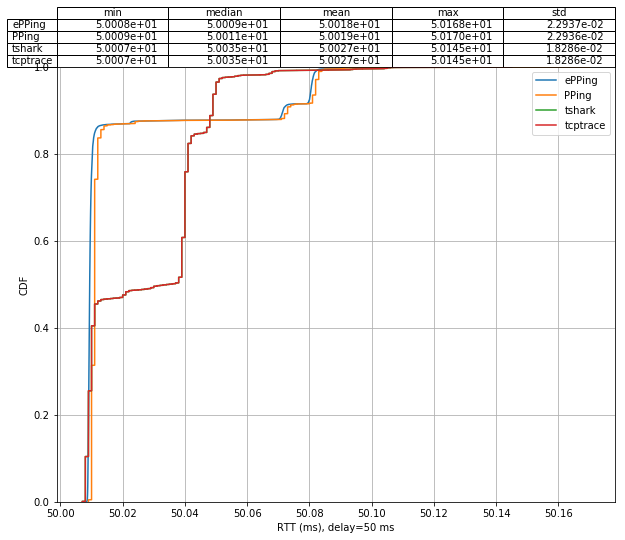

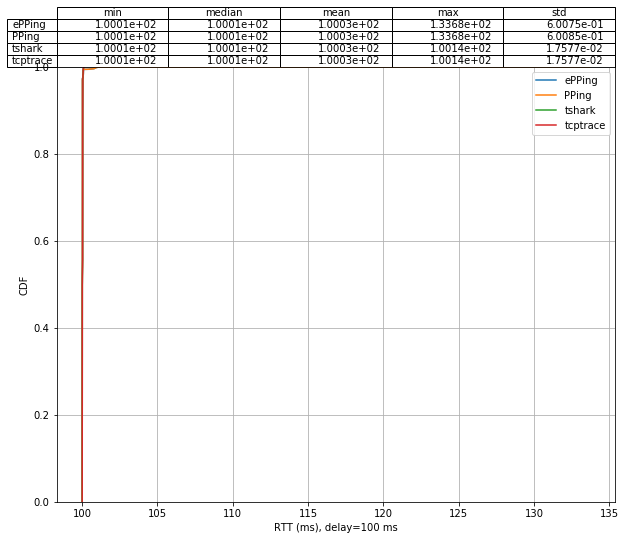

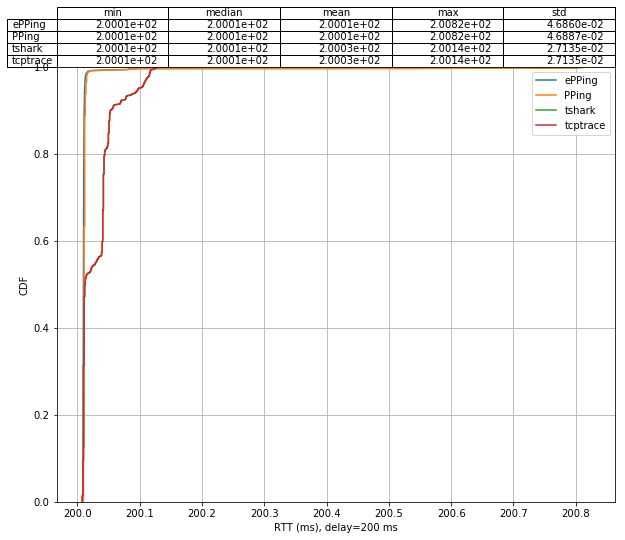

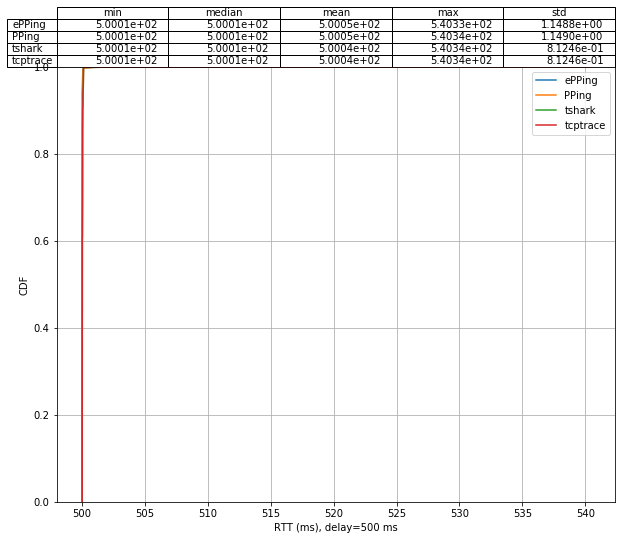

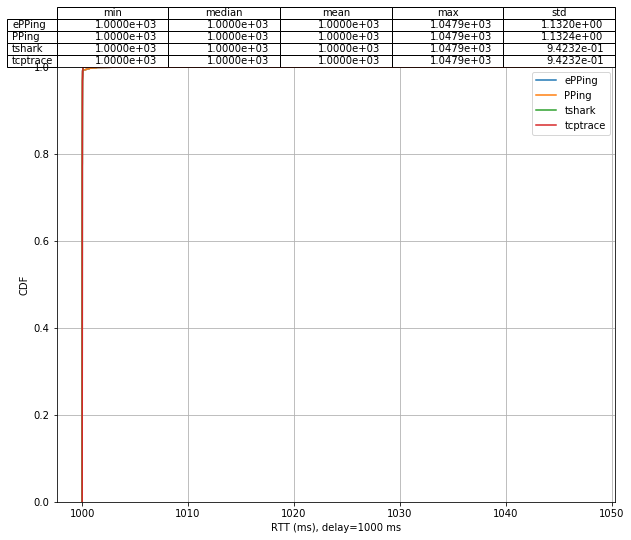

In [58]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT (ms), delay={} ms".format(delay))

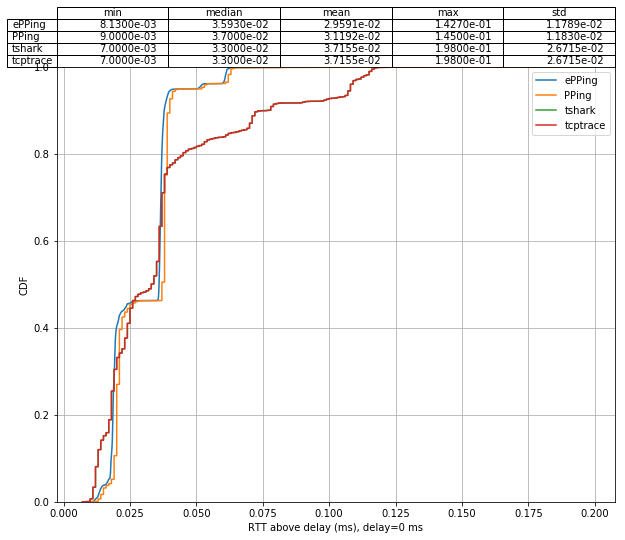

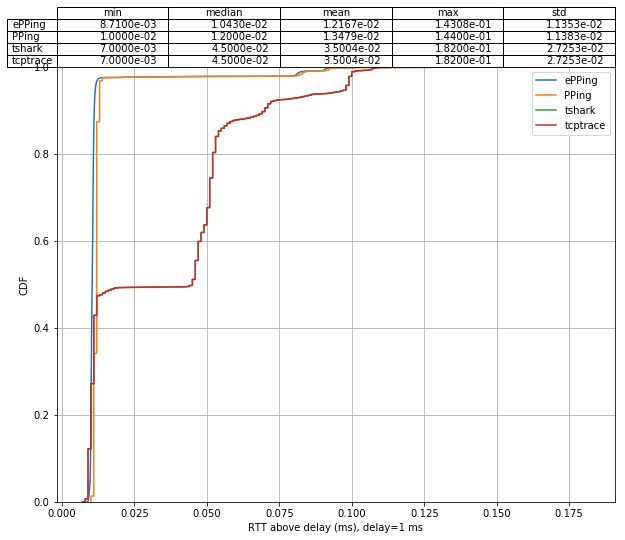

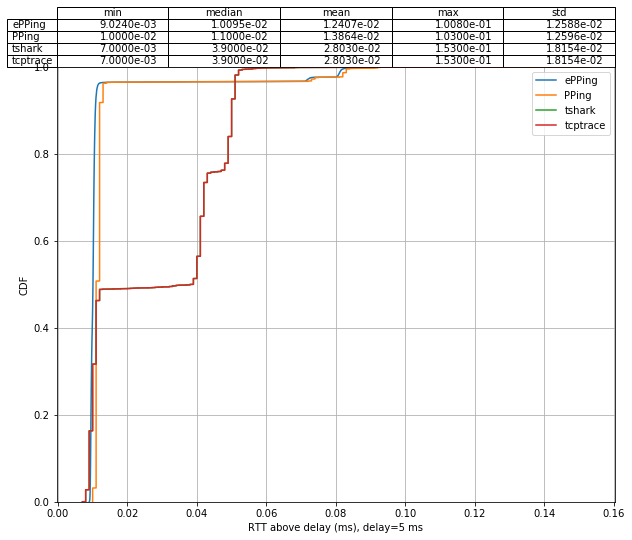

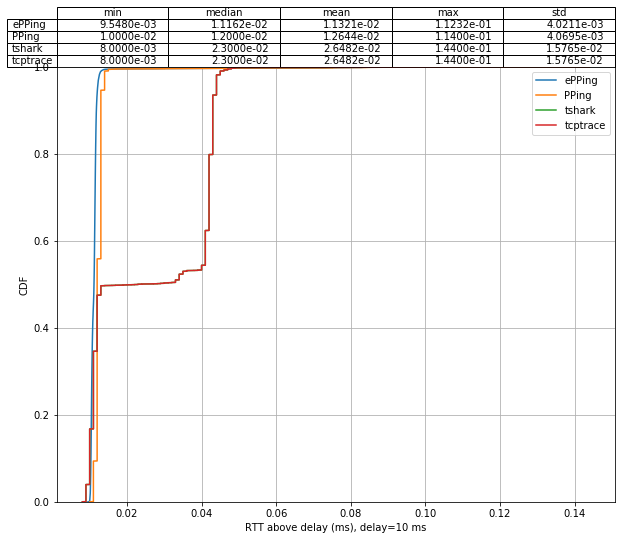

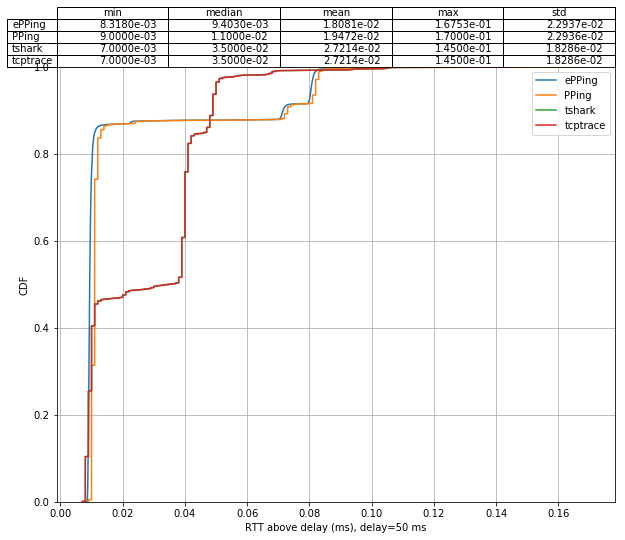

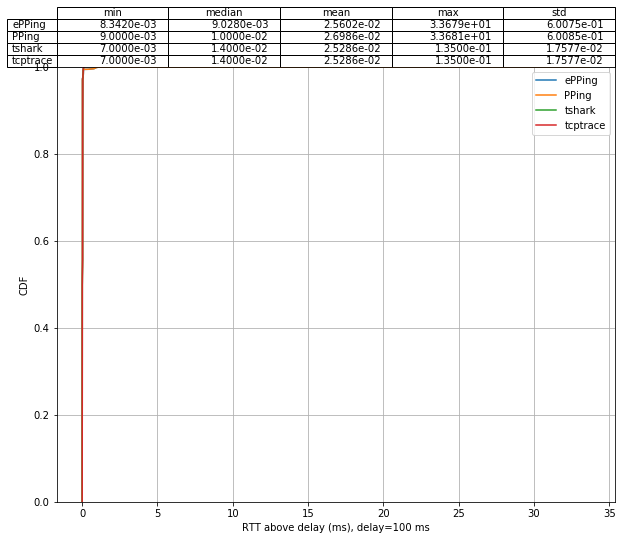

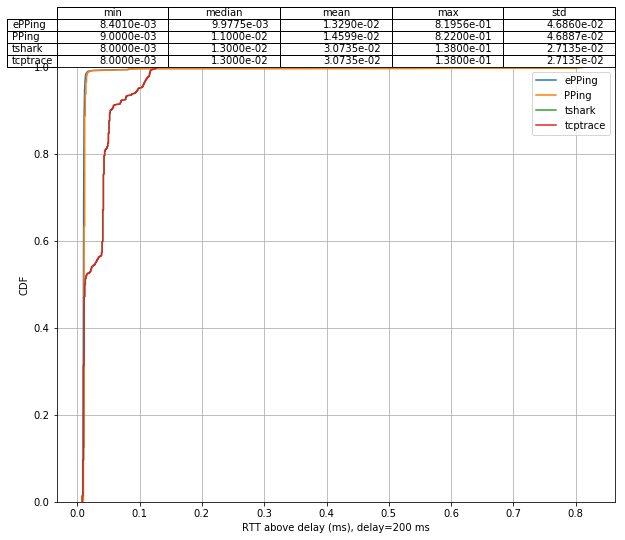

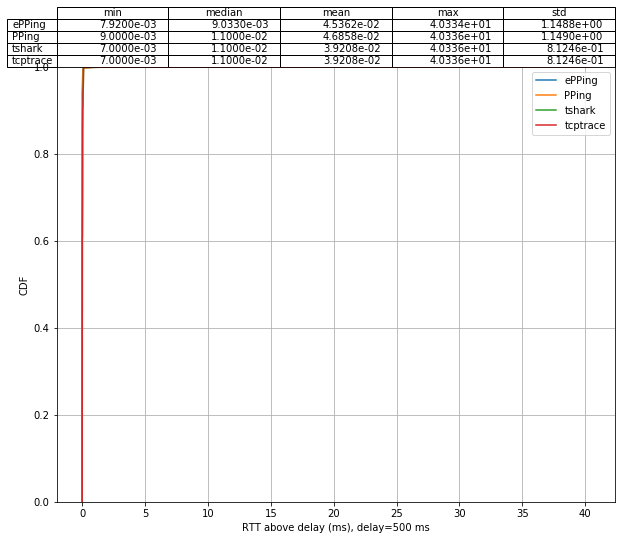

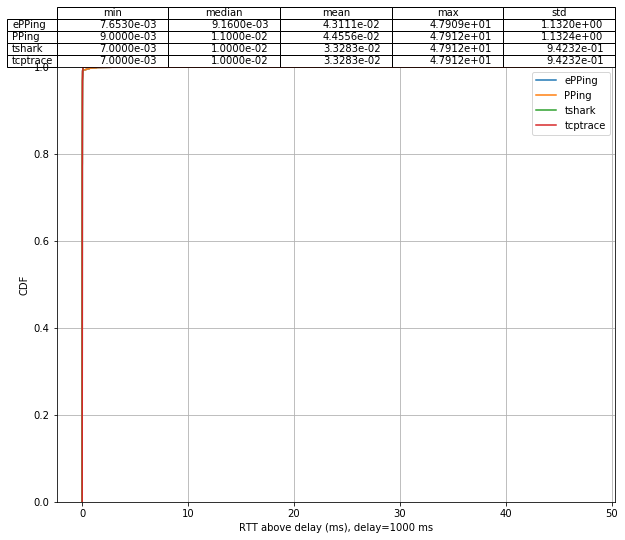

In [59]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_off_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT above delay (ms), delay={} ms".format(delay))

In [60]:
for delay in sorted(data.keys()):
    rtt1 = data[delay]["tshark"]["rtt"].values
    rtt2 = data[delay]["tcptrace"]["rtt"].values
    
    print("delay = {}ms, equal: {}, close: {}".format(
        delay, (rtt1 == rtt2).all(), np.isclose(rtt1, rtt2, rtol=0, atol=1e-10).all()))

delay = 0ms, equal: False, close: True
delay = 1ms, equal: False, close: True
delay = 5ms, equal: False, close: True
delay = 10ms, equal: False, close: True
delay = 50ms, equal: False, close: True
delay = 100ms, equal: False, close: True
delay = 200ms, equal: False, close: True
delay = 500ms, equal: False, close: True
delay = 1000ms, equal: False, close: True


Difference: PPing - ePPing


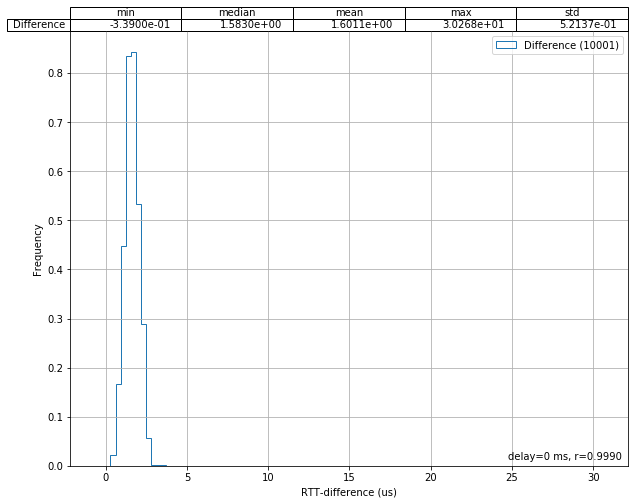

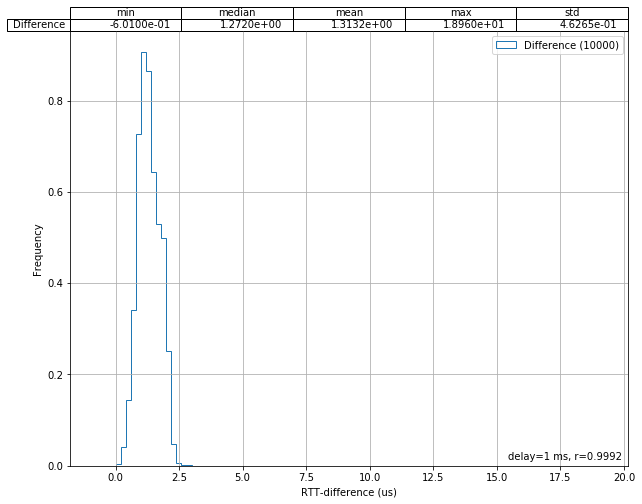

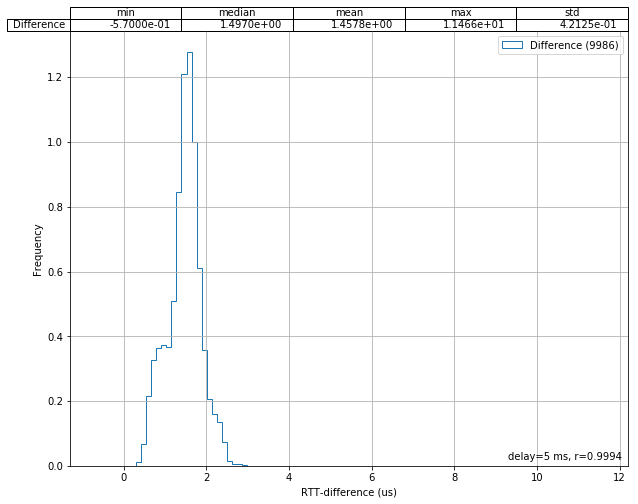

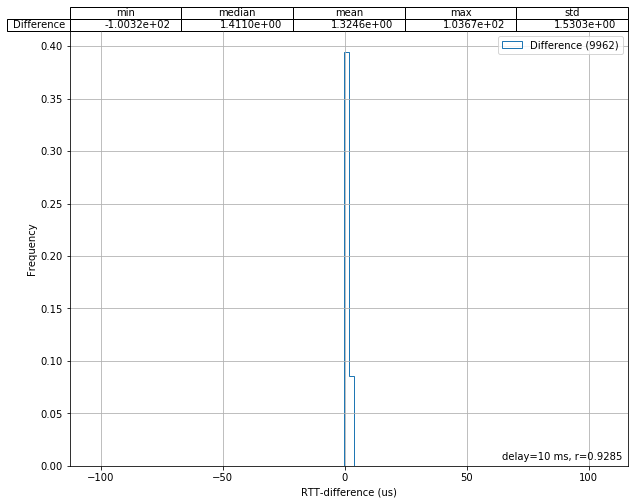

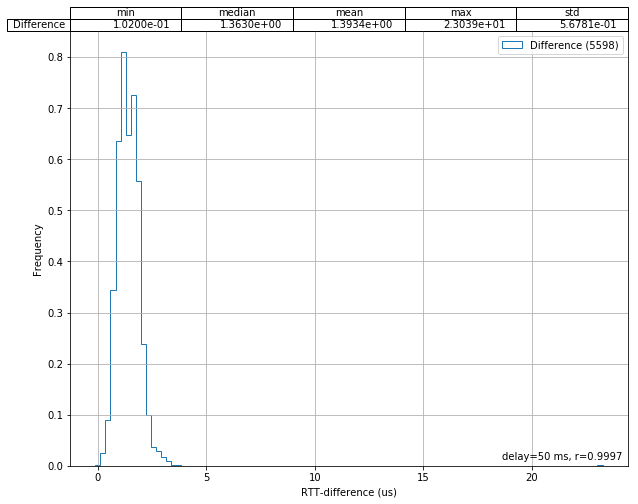

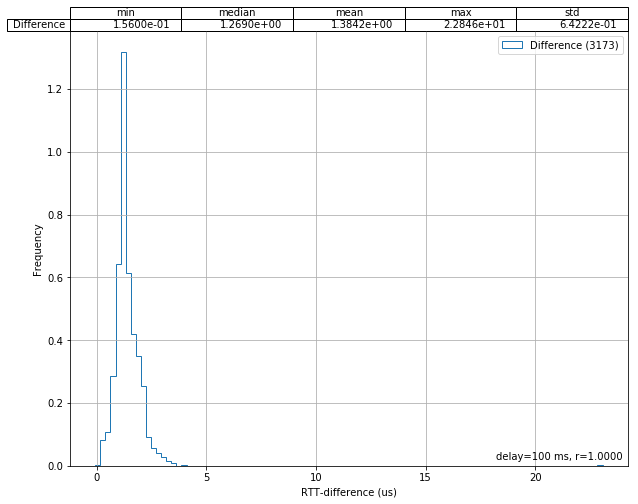

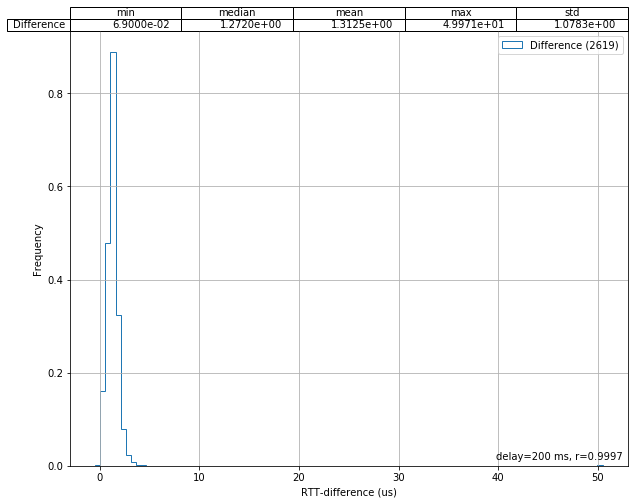

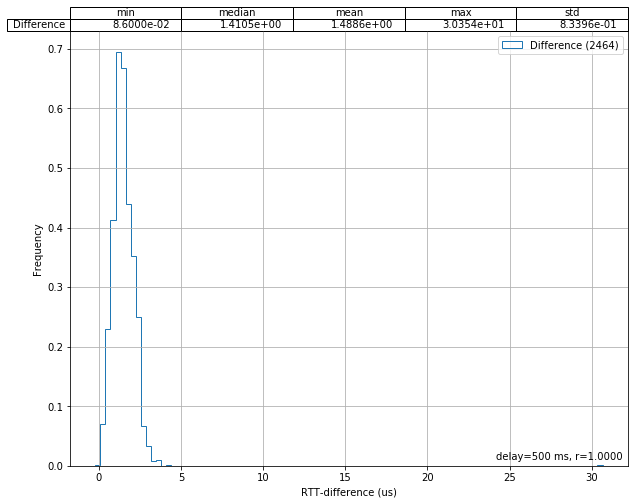

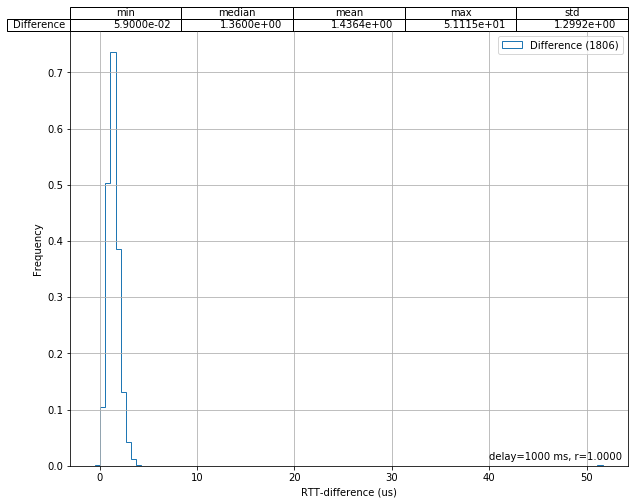

In [61]:
print("Difference: PPing - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["PPing"]
    d2 = data[delay]["ePPing"]
    
    if len(d2) == len(d1) + 1:
        d2 = d2.iloc[1:]
    if len(d2) != len(d1):
        print("Warning, for delay {} PPing {} entries, ePPing {} entries".format(
            delay, len(d1), len(d2)), file=sys.stderr)
        continue
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

Difference: tshark - ePPing


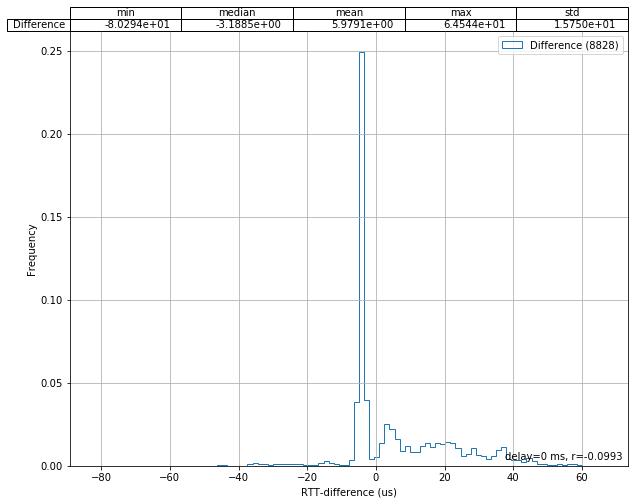

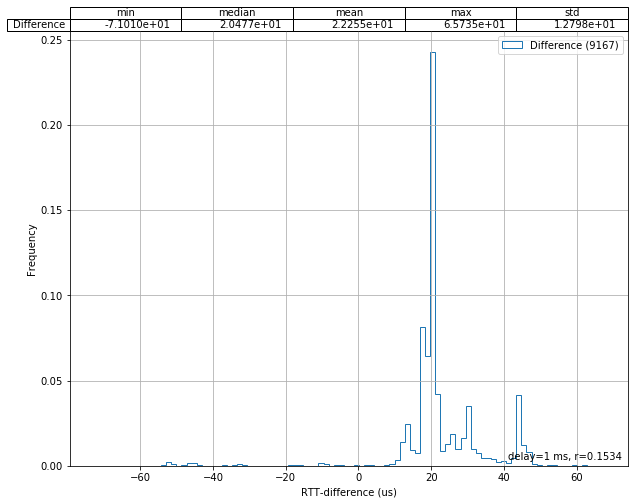

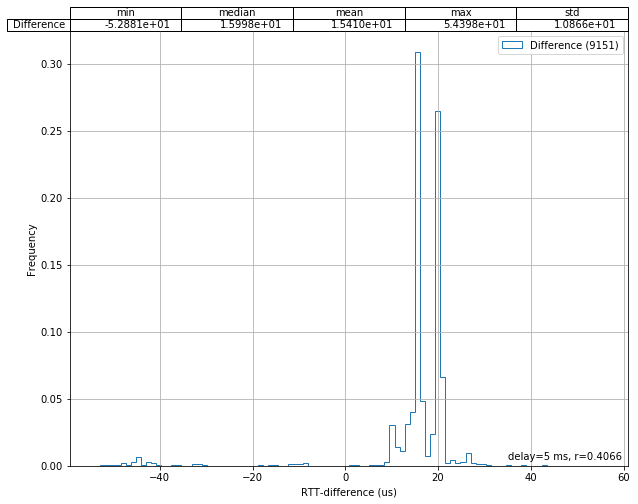

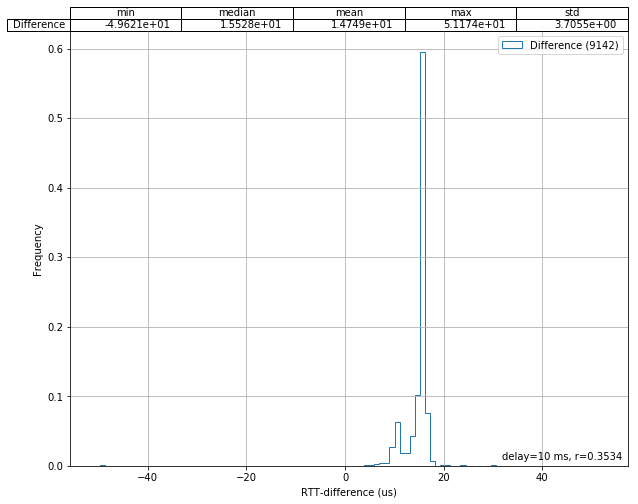

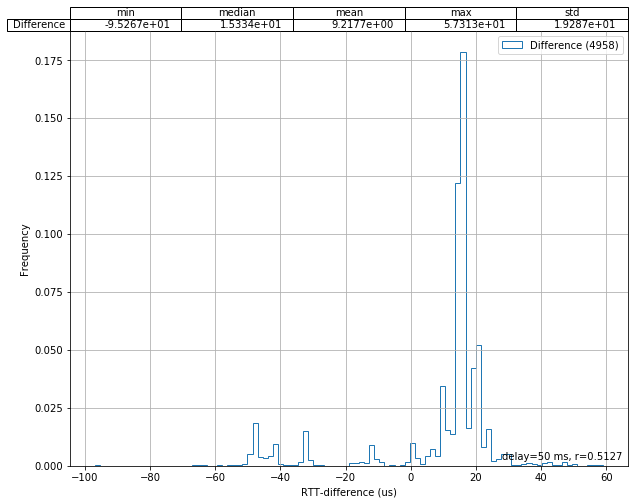

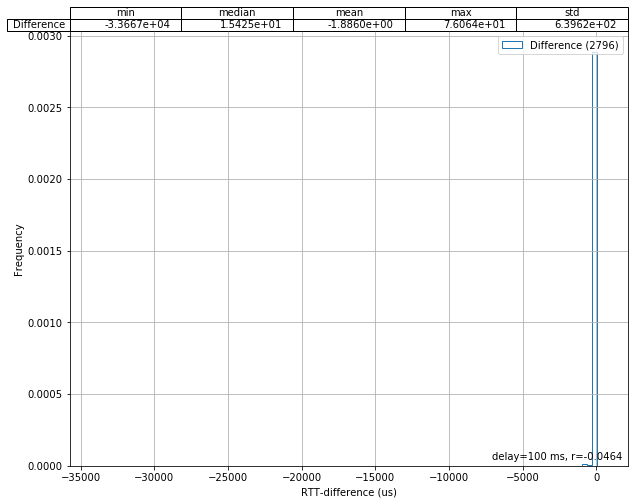

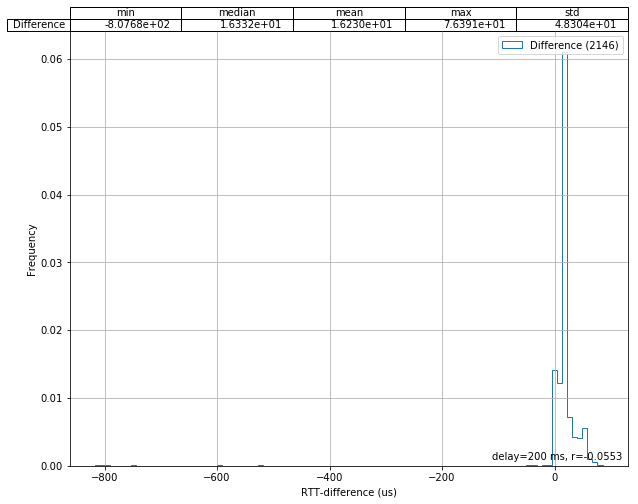

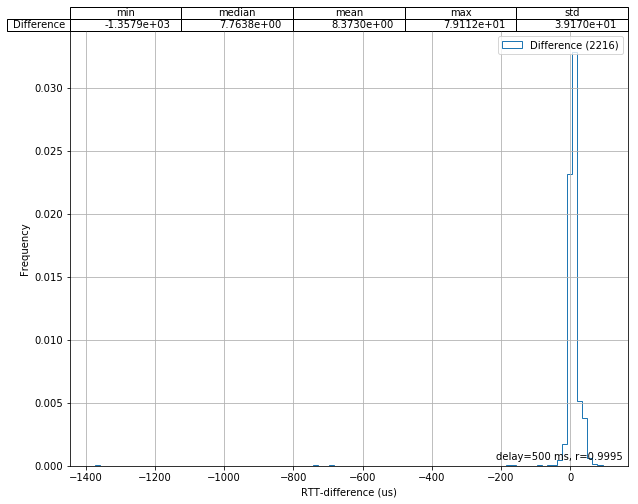

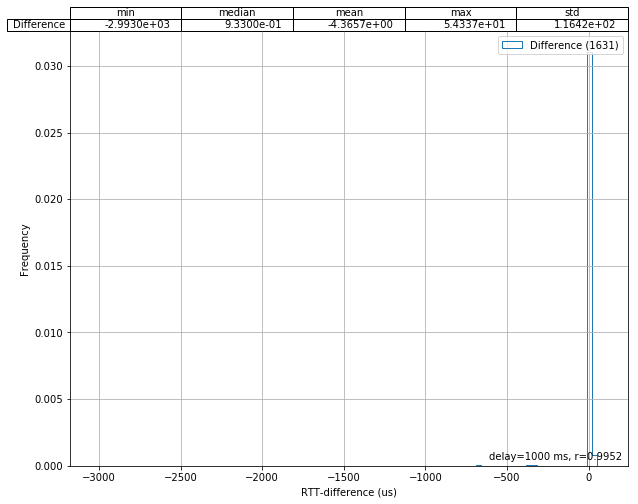

In [62]:
print("Difference: tshark - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt"].mean()
    common_idx = list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index)))
    d1 = pd.DataFrame({"rtt": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"rtt": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

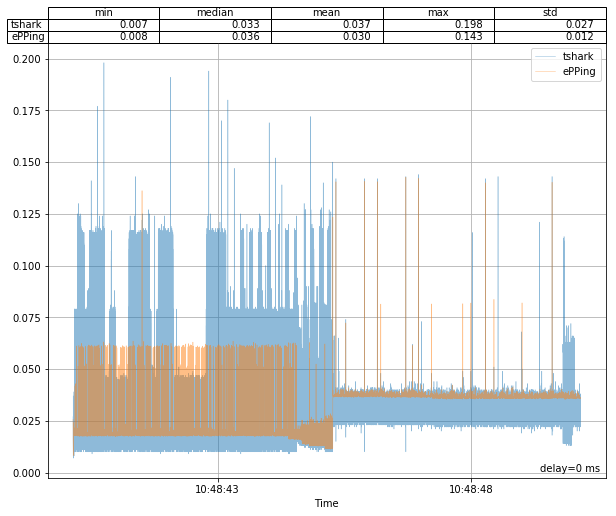

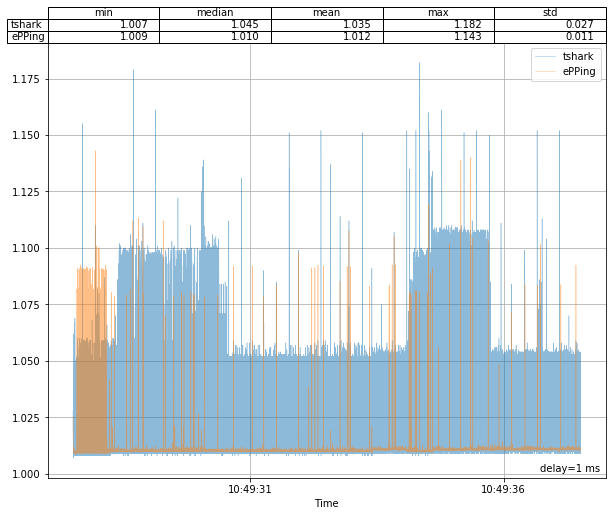

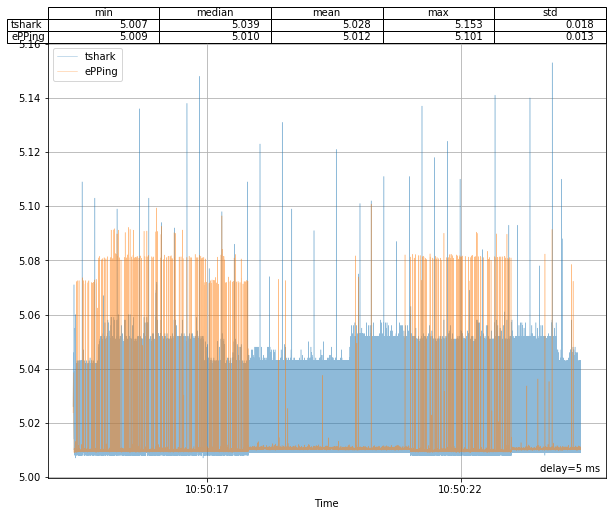

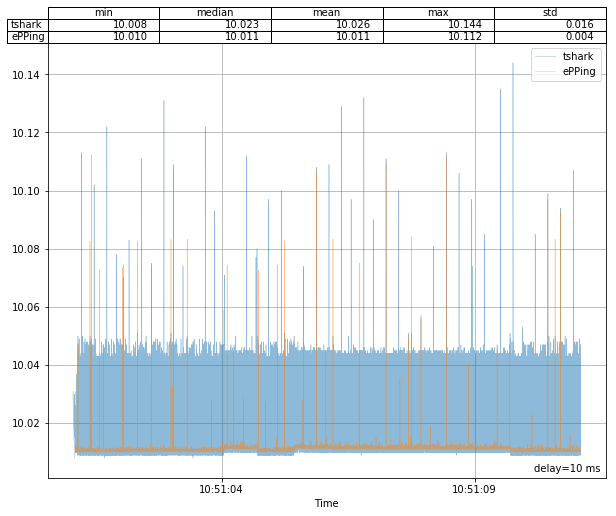

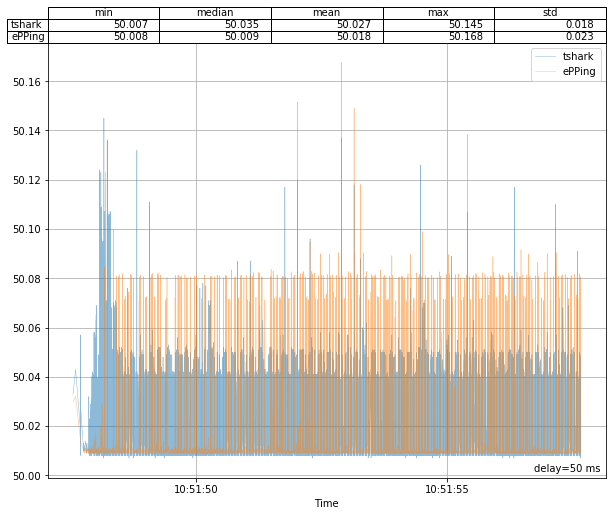

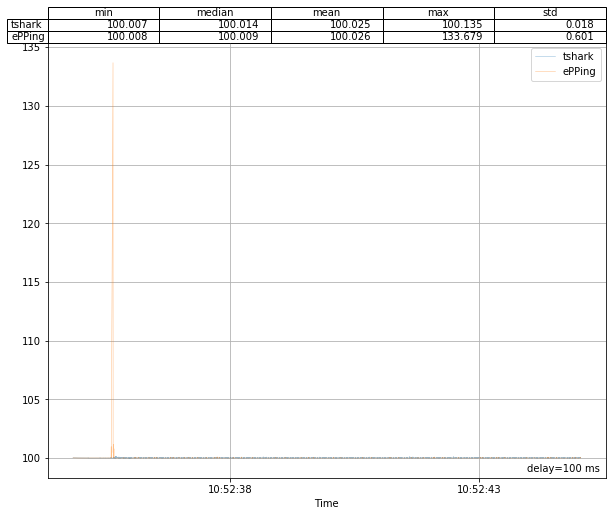

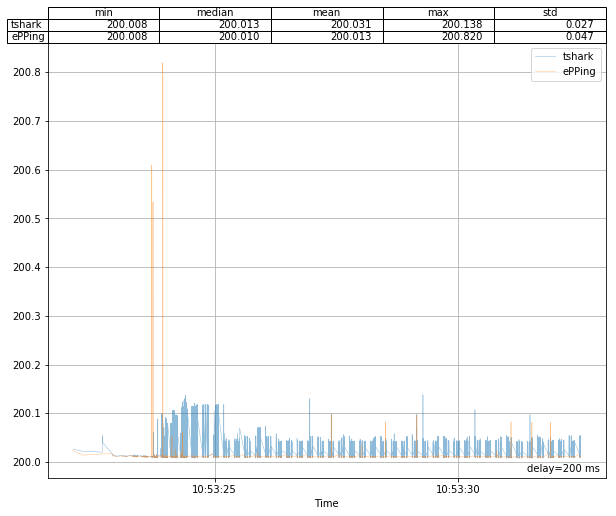

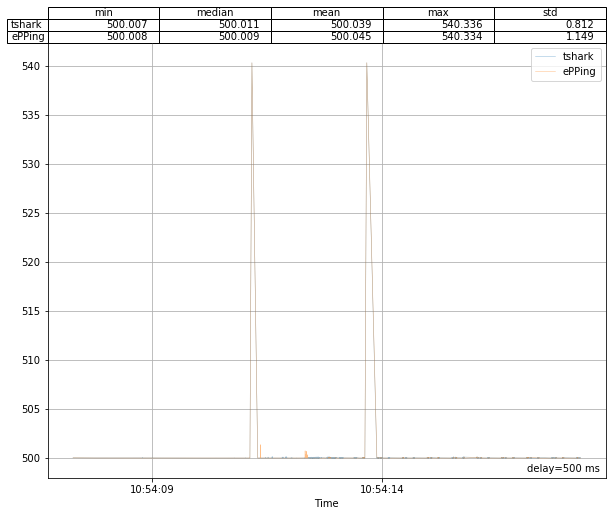

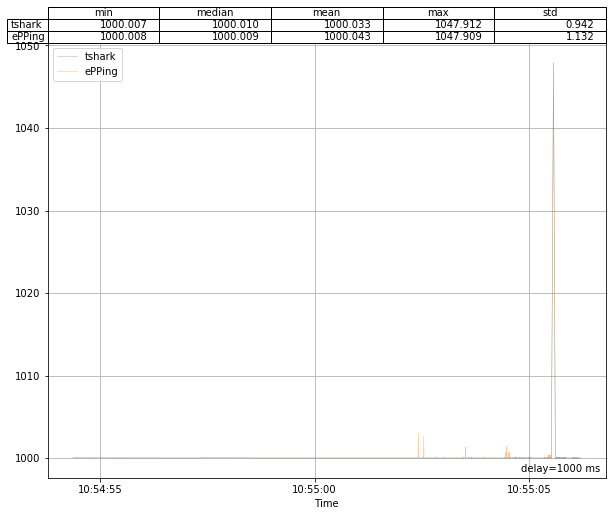

In [63]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms".format(delay), 
              va="bottom", ha="right", transform=axes.transAxes)

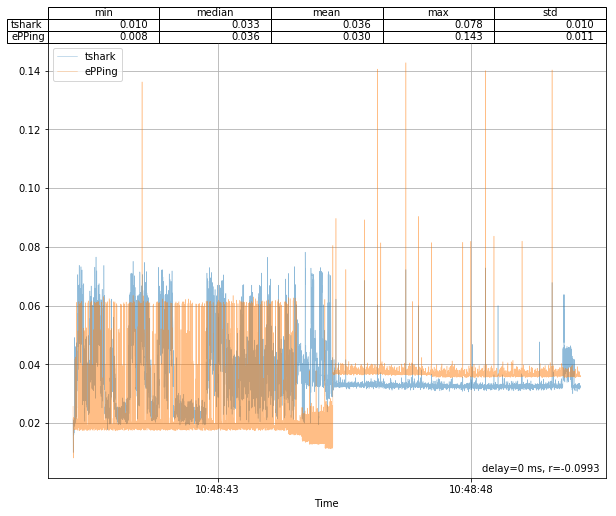

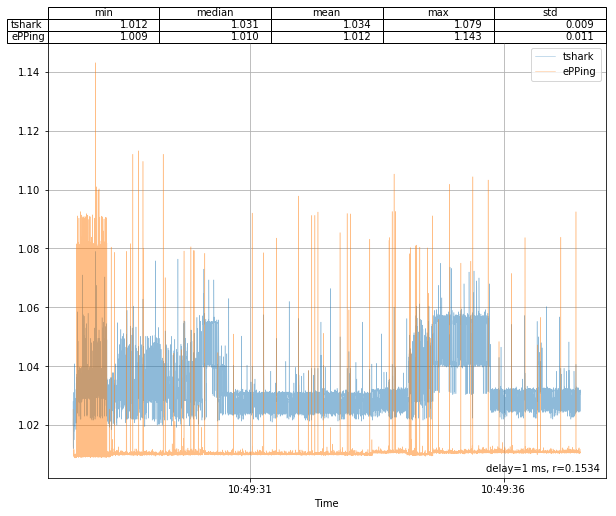

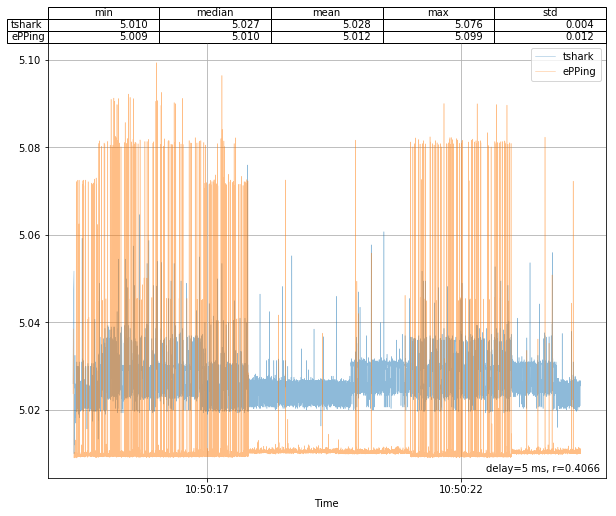

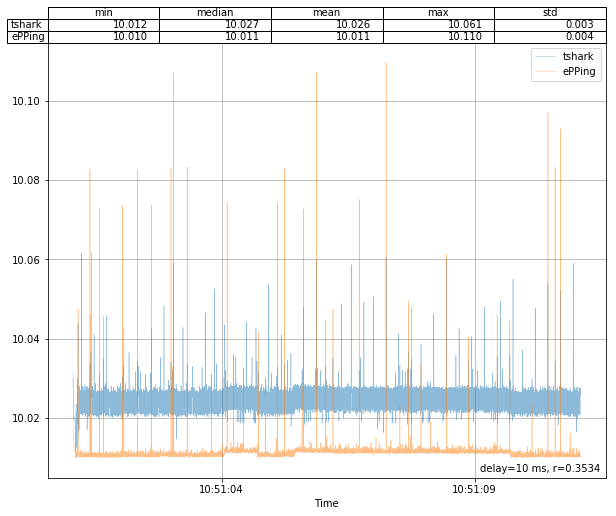

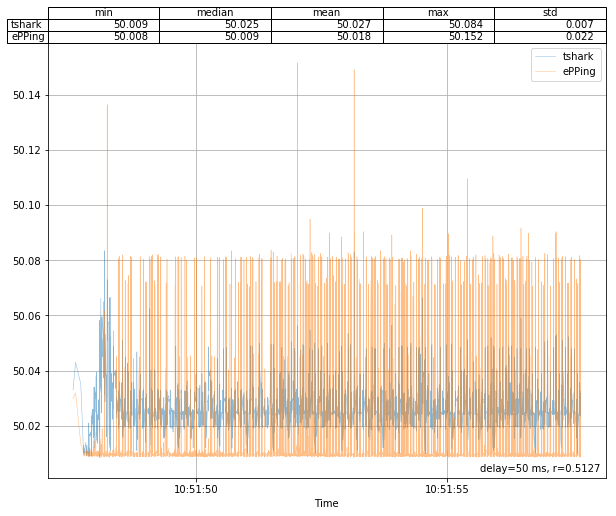

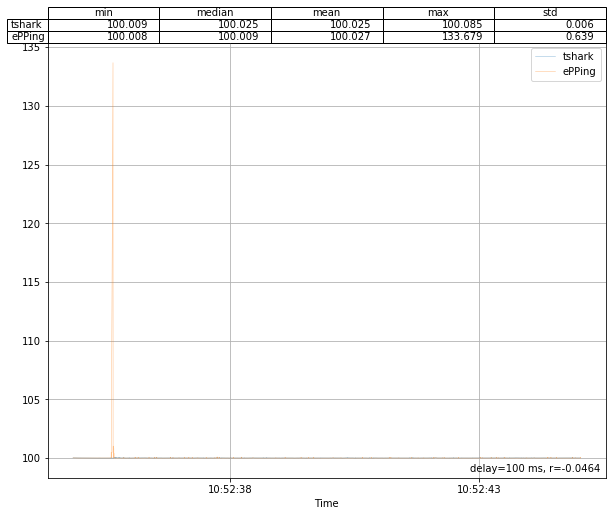

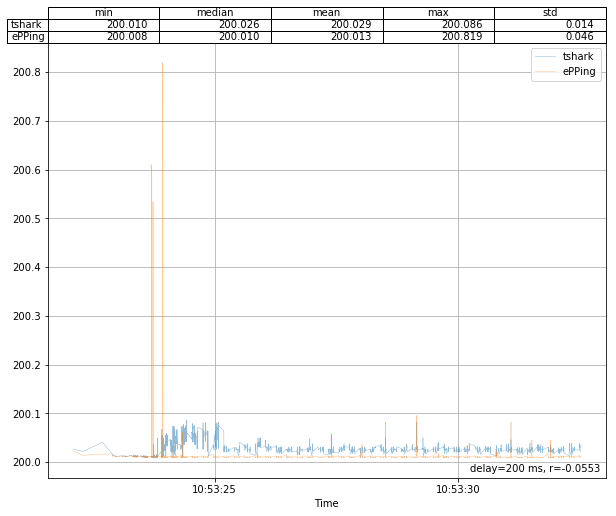

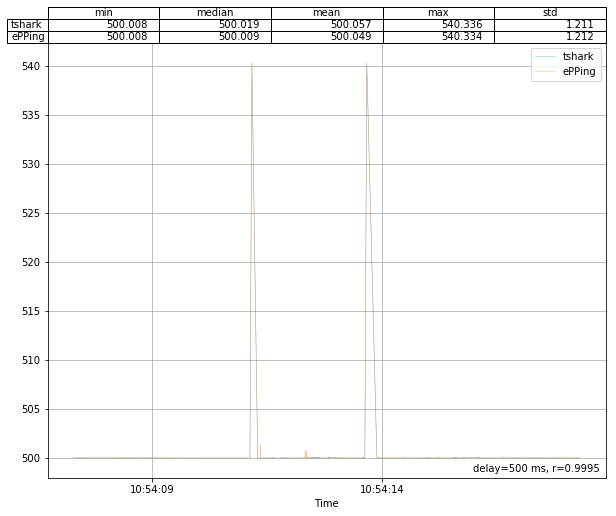

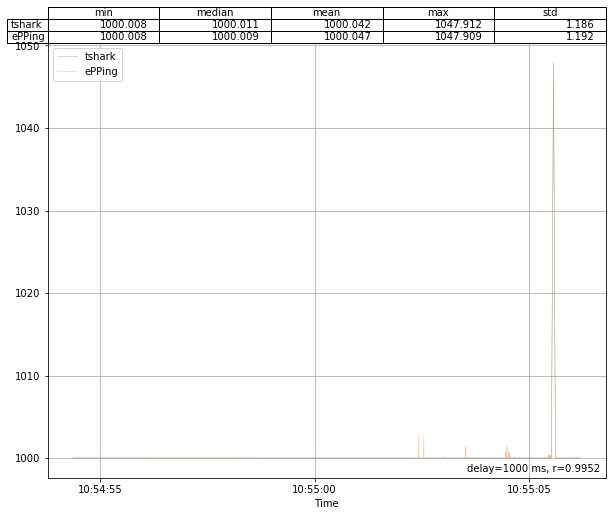

In [64]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt_ms"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt_ms"].mean()
    common_idx = sorted(list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index))))
    d1 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt_ms"].values, d2["rtt_ms"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

In [75]:
%%time
data4 = load_all_rtt_data("pping_testing/tcp_rtt_accuracy/latencyperf/2022-05-15T155114")
data = data4

CPU times: user 1min 31s, sys: 573 ms, total: 1min 31s
Wall time: 4min 10s


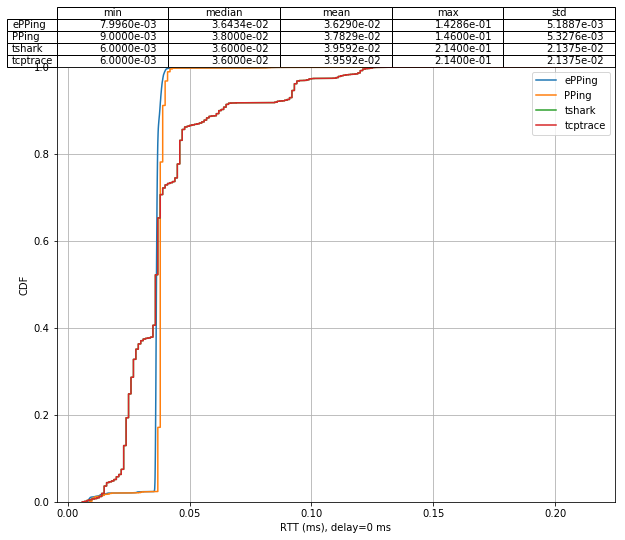

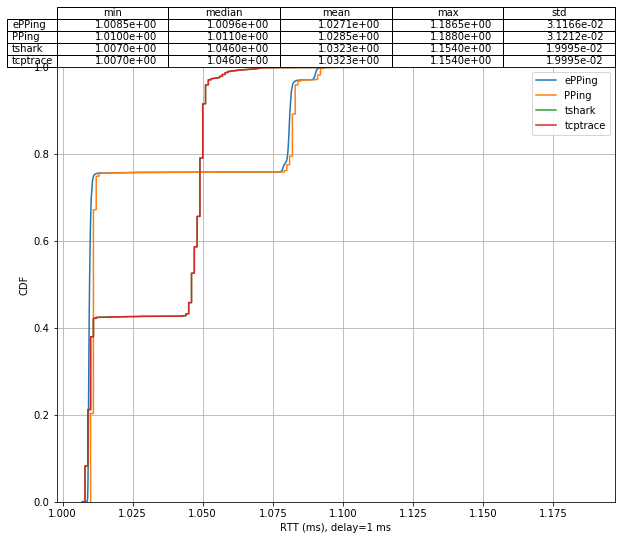

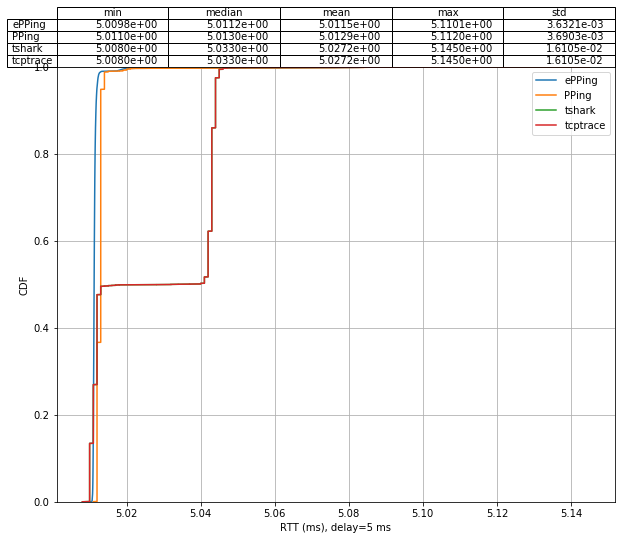

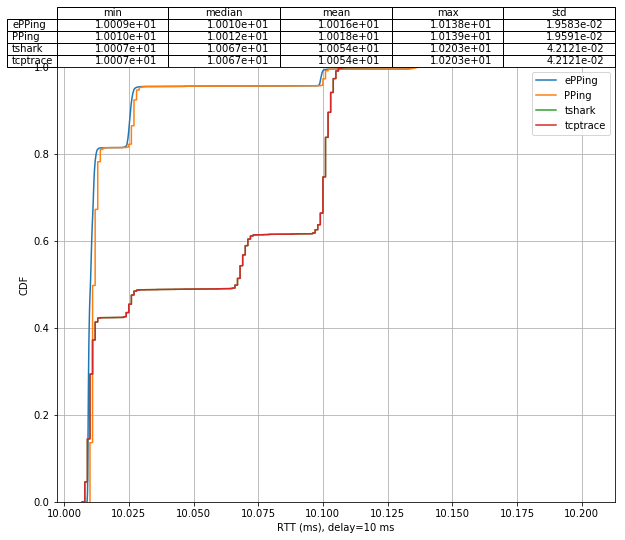

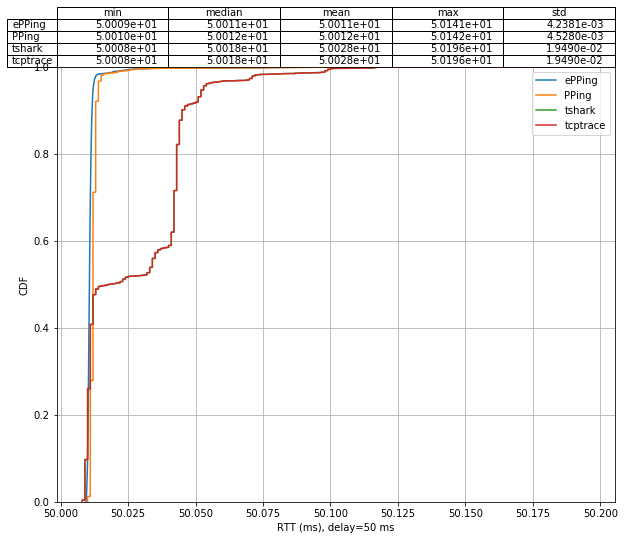

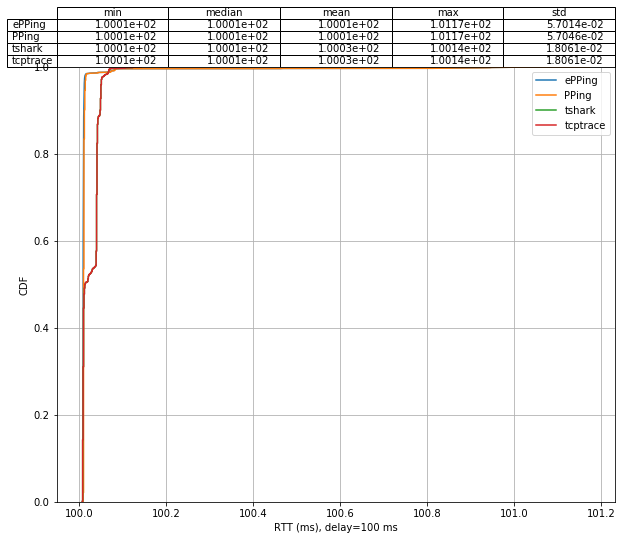

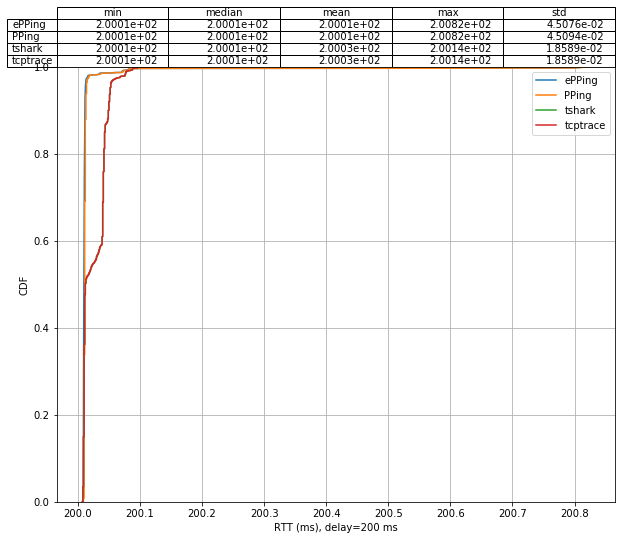

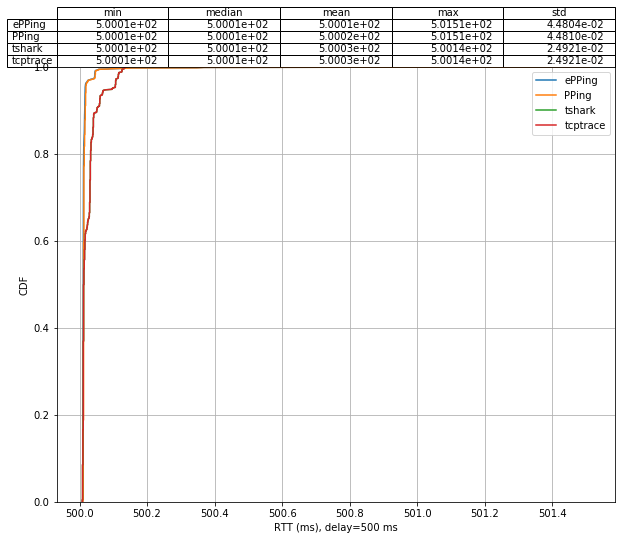

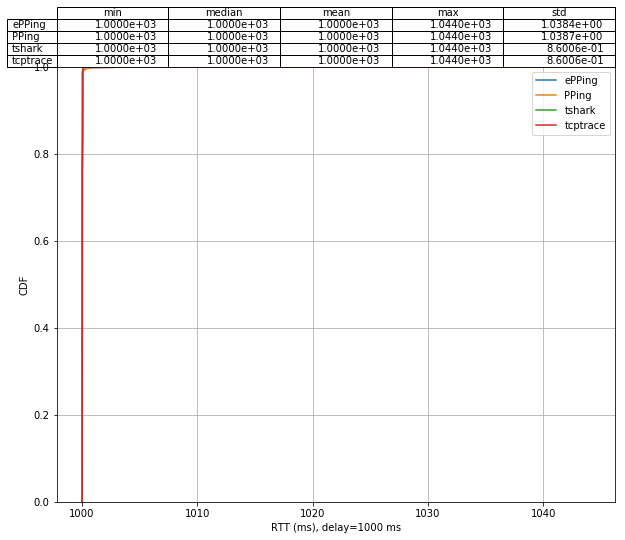

In [76]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT (ms), delay={} ms".format(delay))

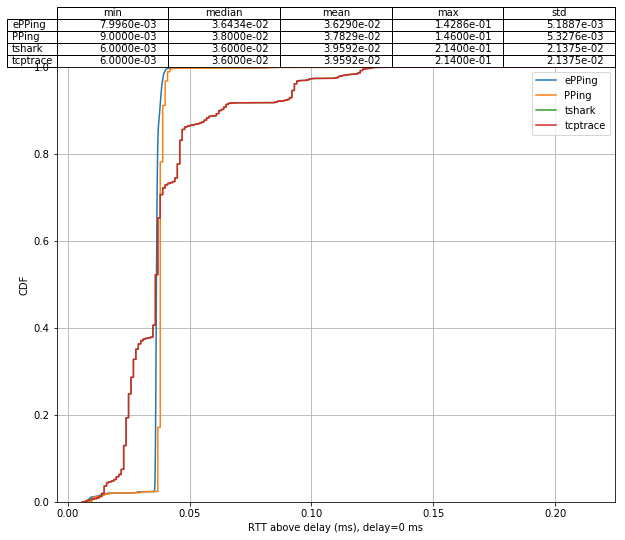

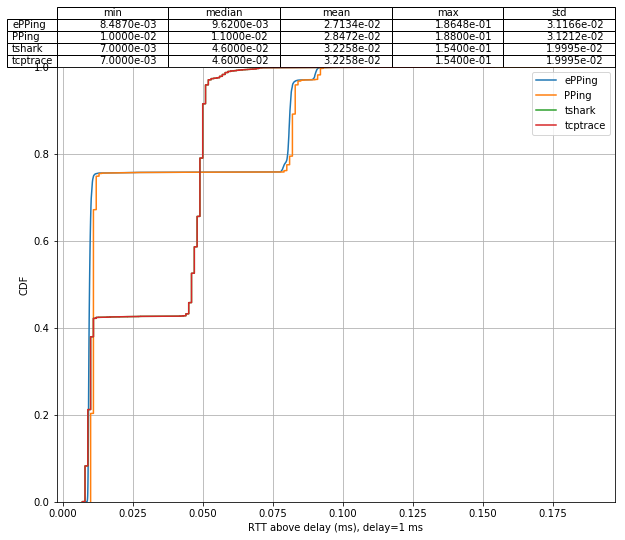

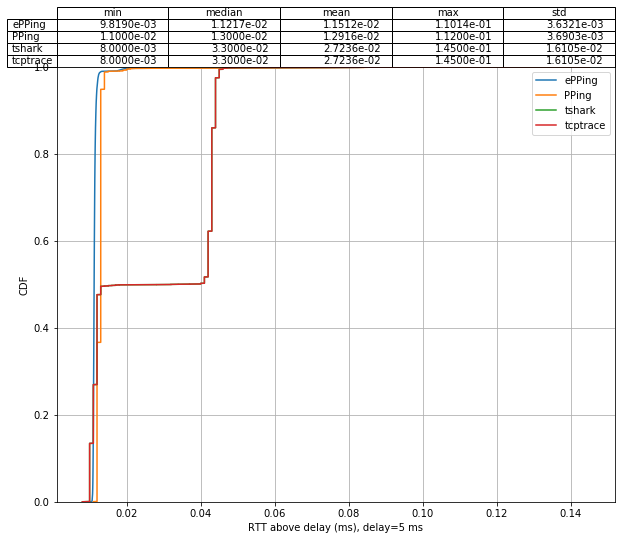

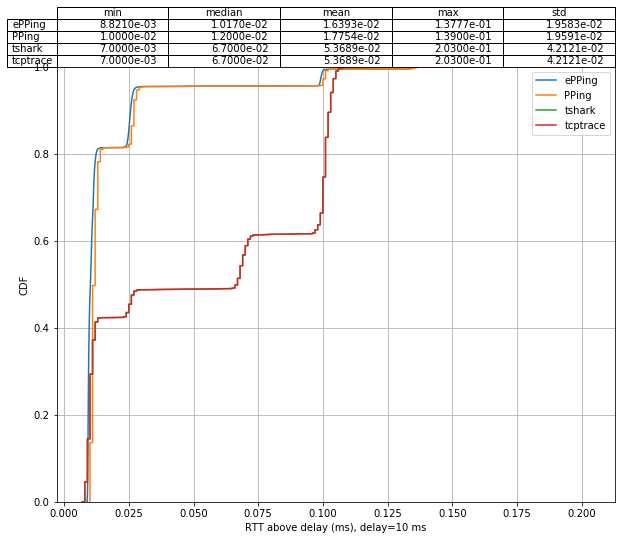

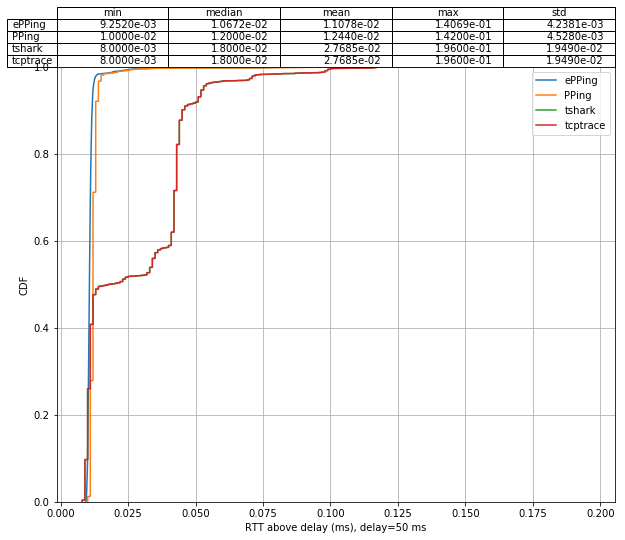

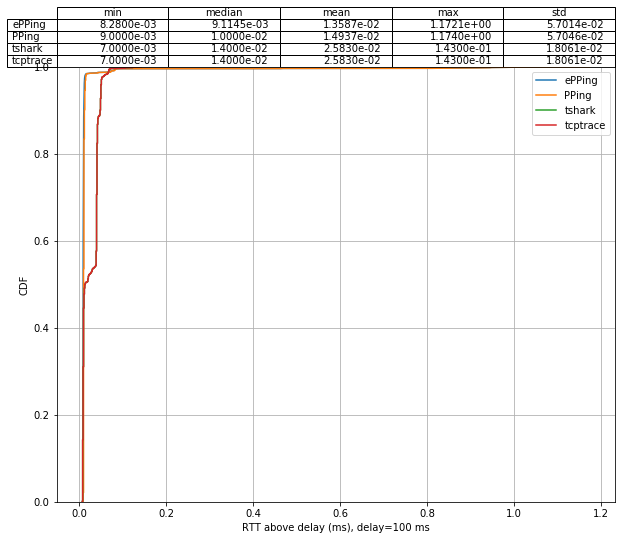

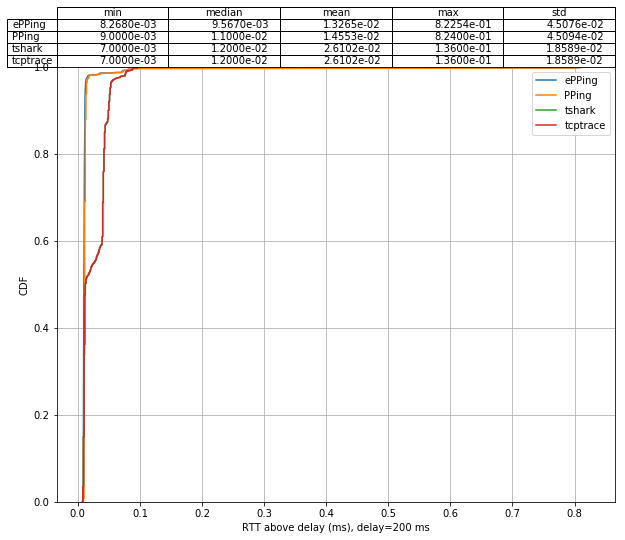

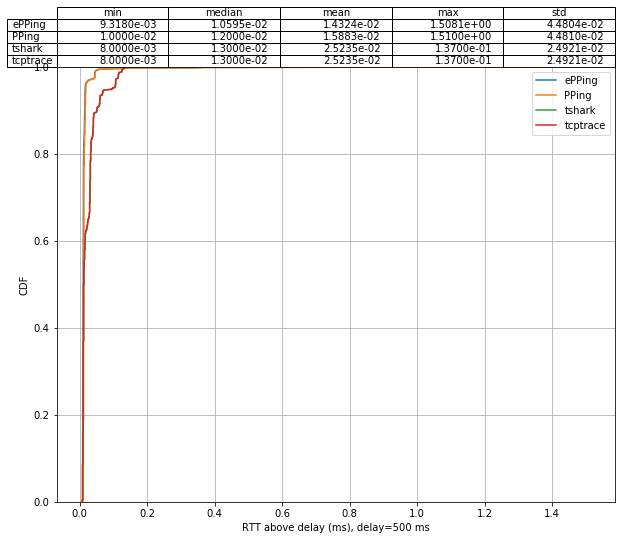

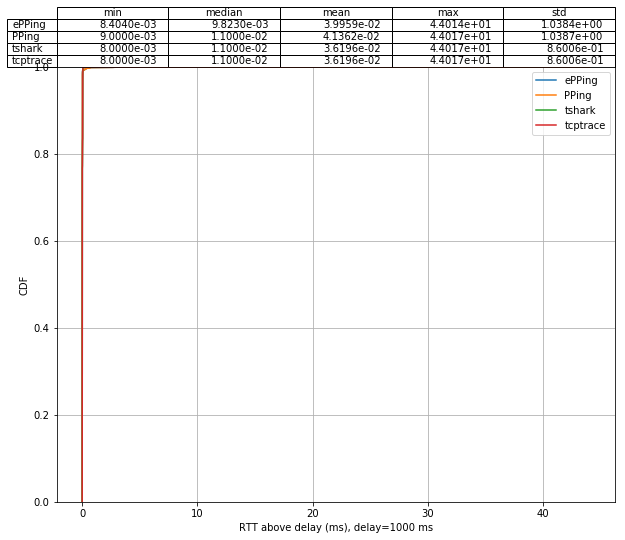

In [77]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_off_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT above delay (ms), delay={} ms".format(delay))

In [78]:
for delay in sorted(data.keys()):
    rtt1 = data[delay]["tshark"]["rtt"].values
    rtt2 = data[delay]["tcptrace"]["rtt"].values
    
    print("delay = {}ms, equal: {}, close: {}".format(
        delay, (rtt1 == rtt2).all(), np.isclose(rtt1, rtt2, rtol=0, atol=1e-10).all()))

delay = 0ms, equal: False, close: True
delay = 1ms, equal: False, close: True
delay = 5ms, equal: False, close: True
delay = 10ms, equal: False, close: True
delay = 50ms, equal: False, close: True
delay = 100ms, equal: False, close: True
delay = 200ms, equal: False, close: True
delay = 500ms, equal: False, close: True
delay = 1000ms, equal: False, close: True


Difference: PPing - ePPing


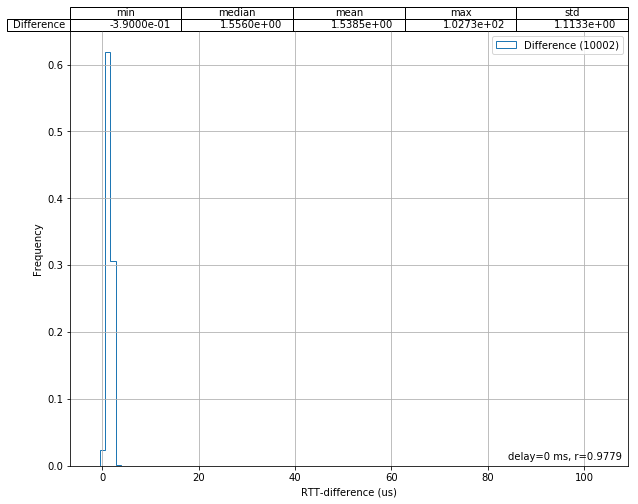

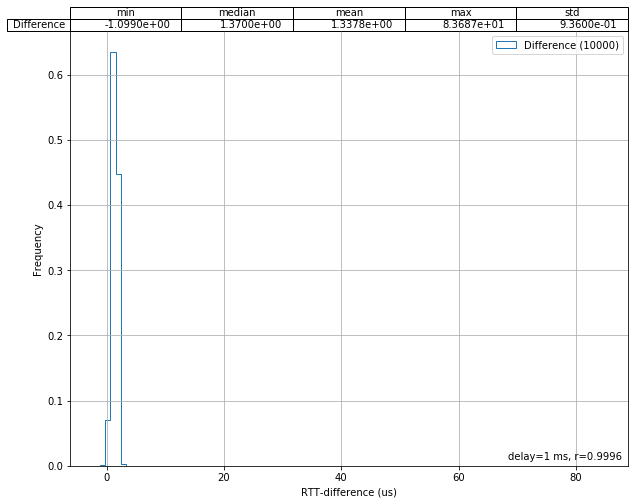

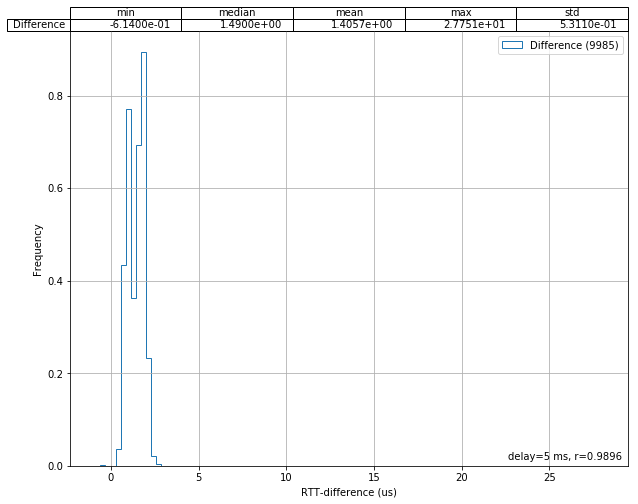

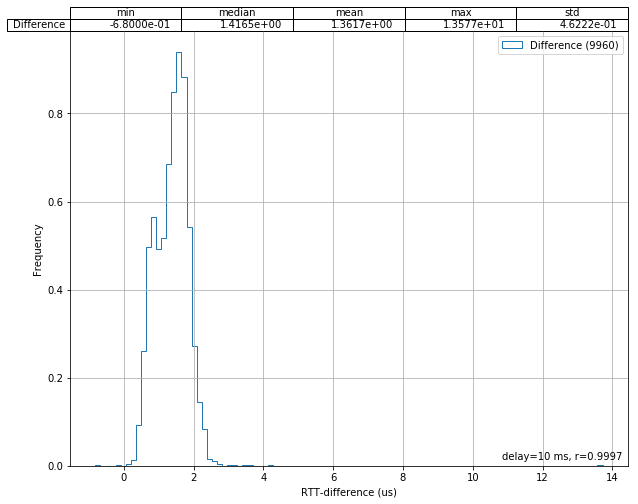

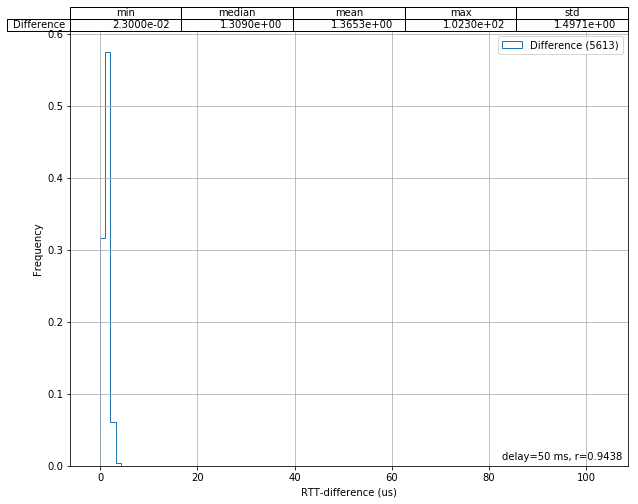

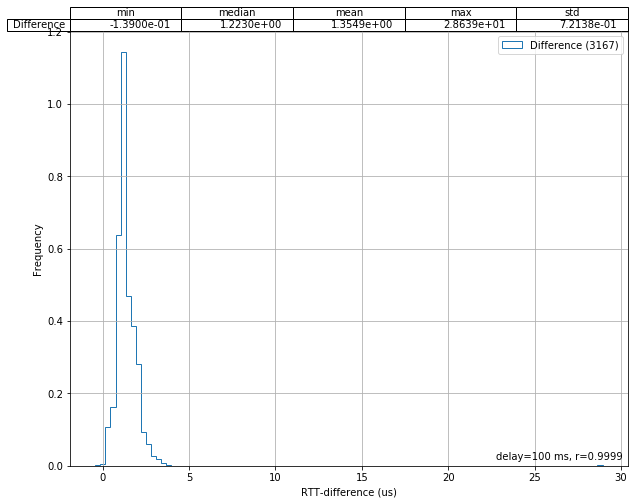

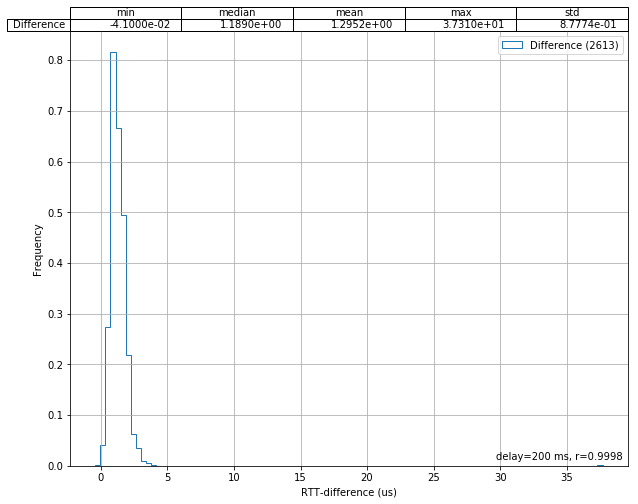

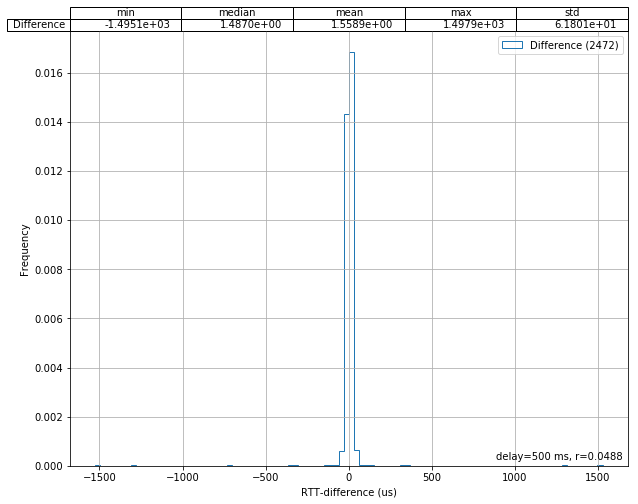

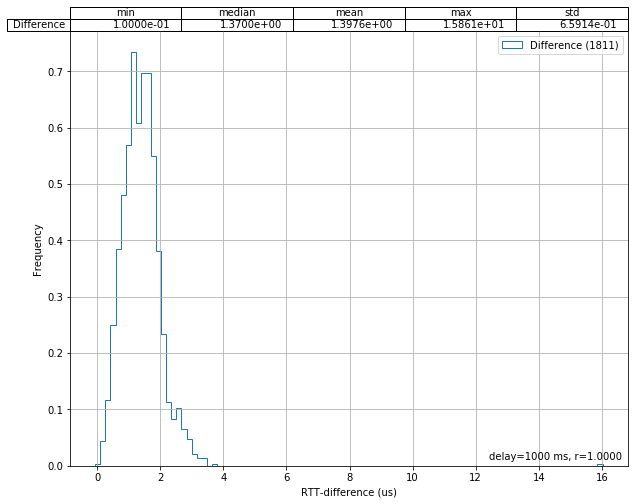

In [79]:
print("Difference: PPing - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["PPing"]
    d2 = data[delay]["ePPing"]
    
    if len(d2) == len(d1) + 1:
        d2 = d2.iloc[1:]
    if len(d2) != len(d1):
        print("Warning, for delay {} PPing {} entries, ePPing {} entries".format(
            delay, len(d1), len(d2)), file=sys.stderr)
        continue
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

A few large differences between ePPing and PPing at delay 500ms, possible missmatch between RTTs

Difference: tshark - ePPing


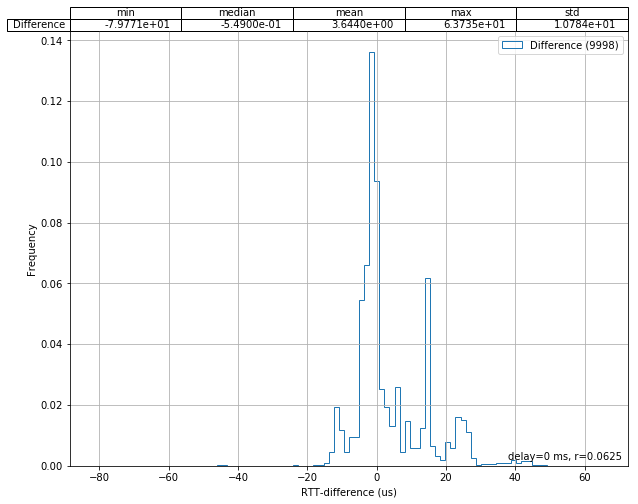

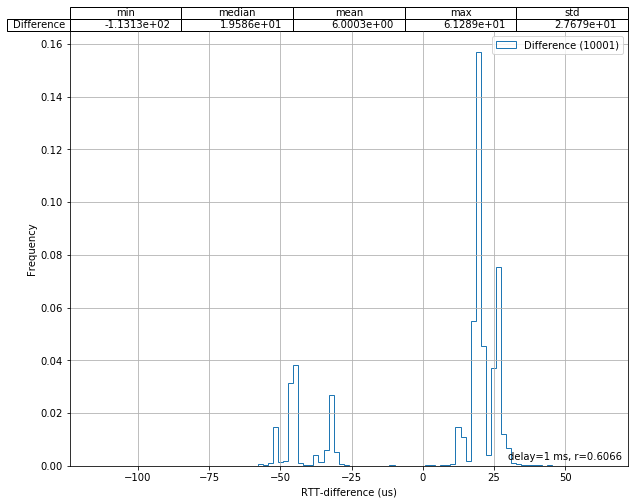

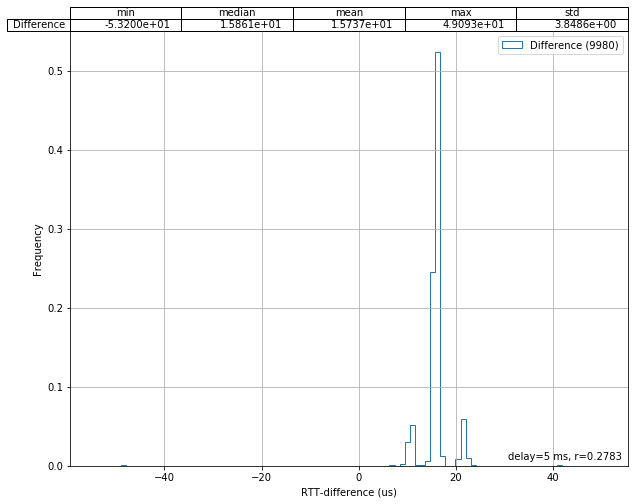

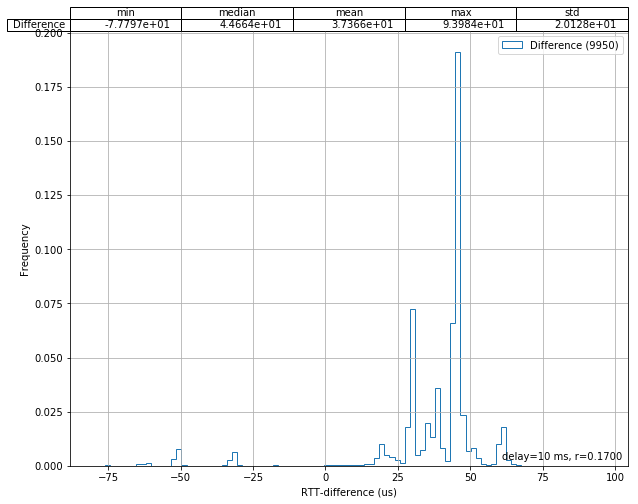

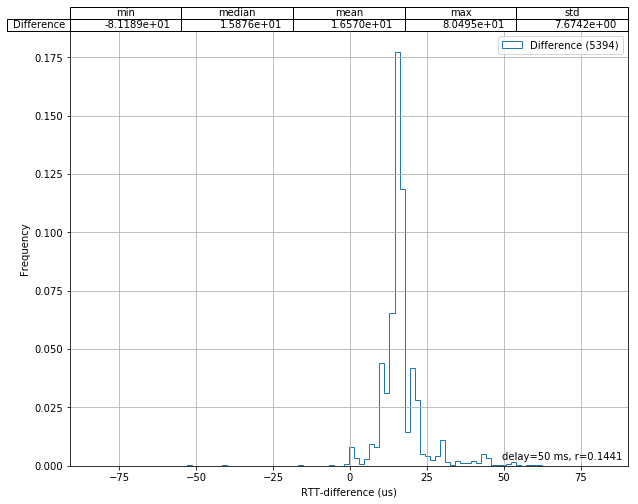

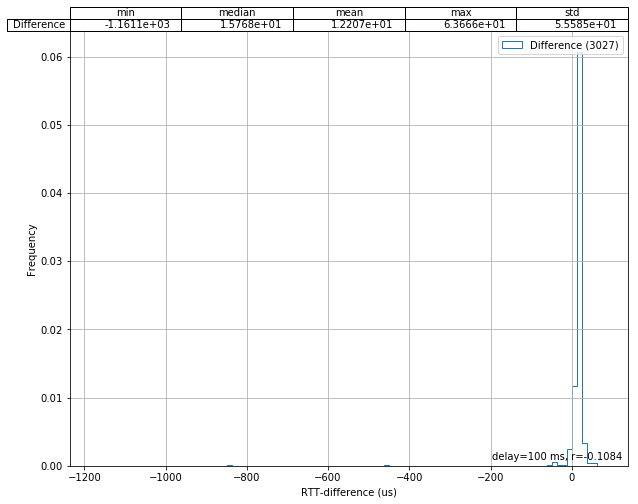

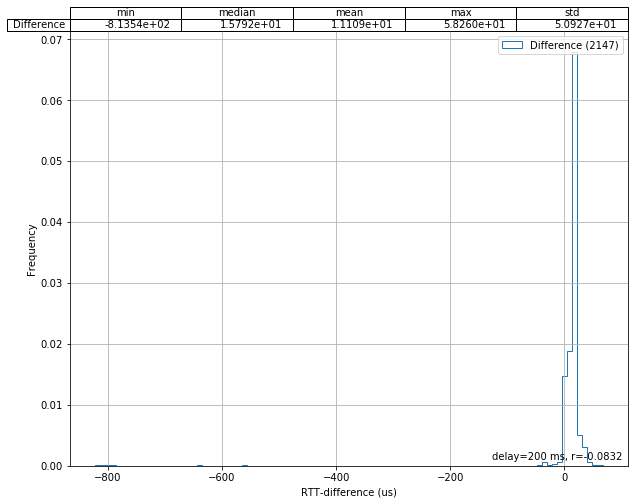

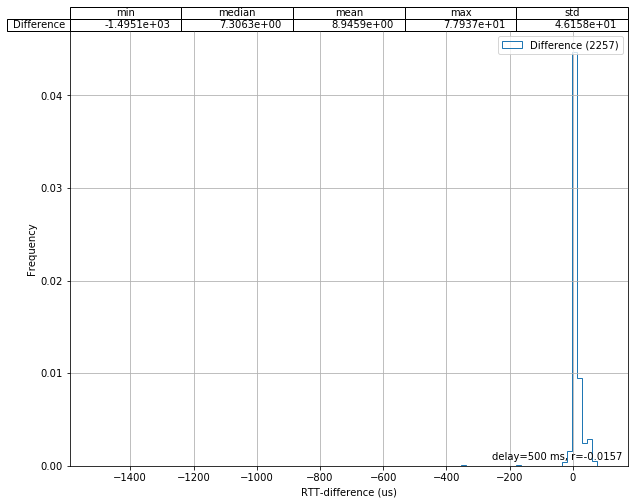

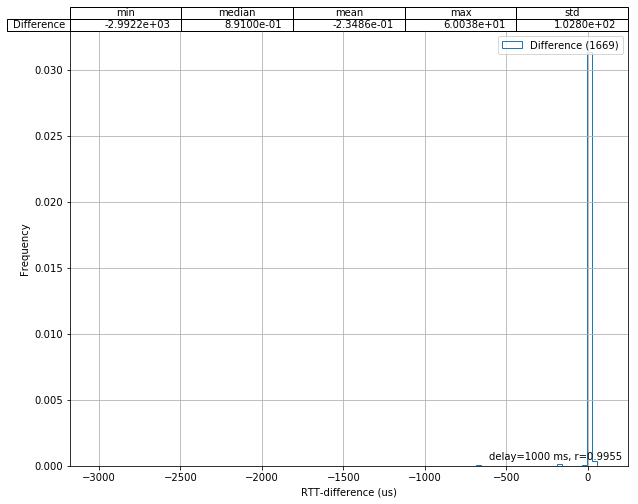

In [80]:
print("Difference: tshark - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt"].mean()
    common_idx = list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index)))
    d1 = pd.DataFrame({"rtt": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"rtt": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

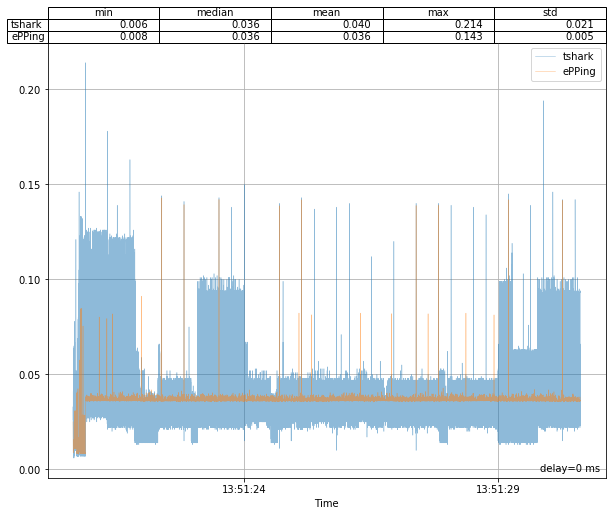

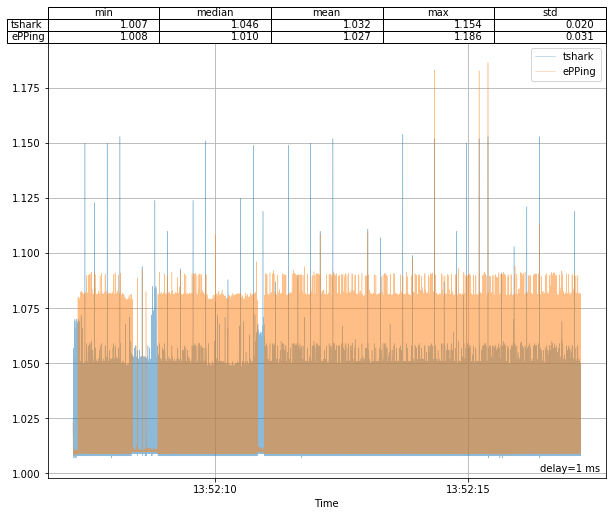

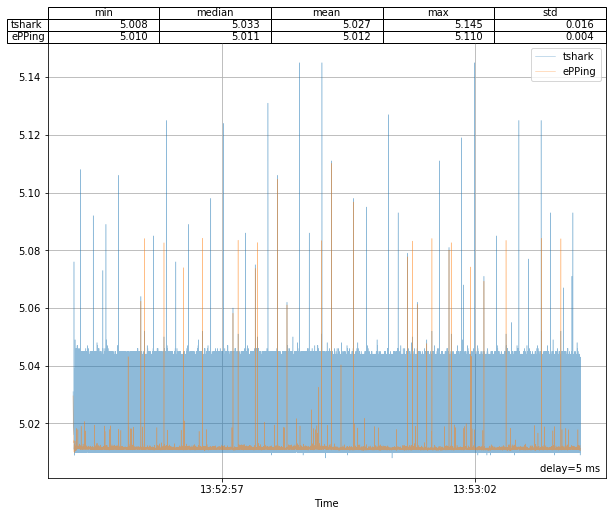

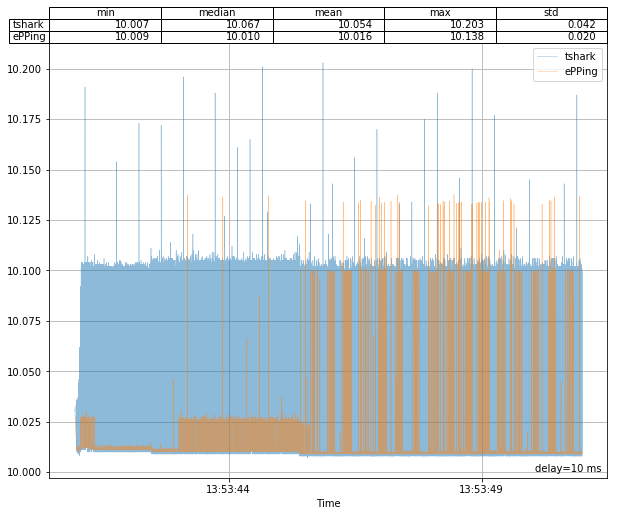

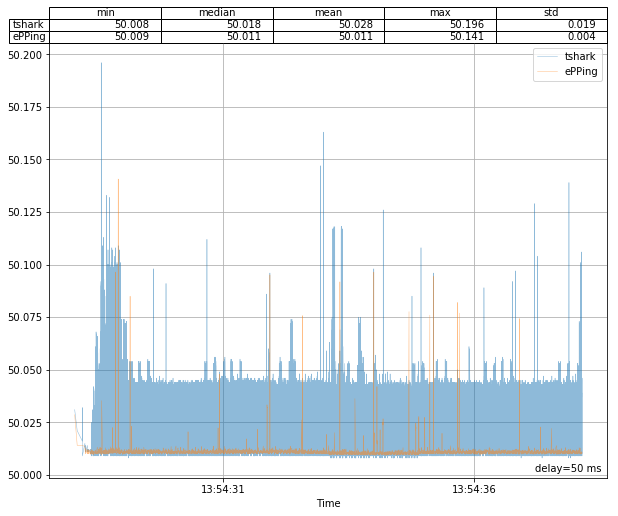

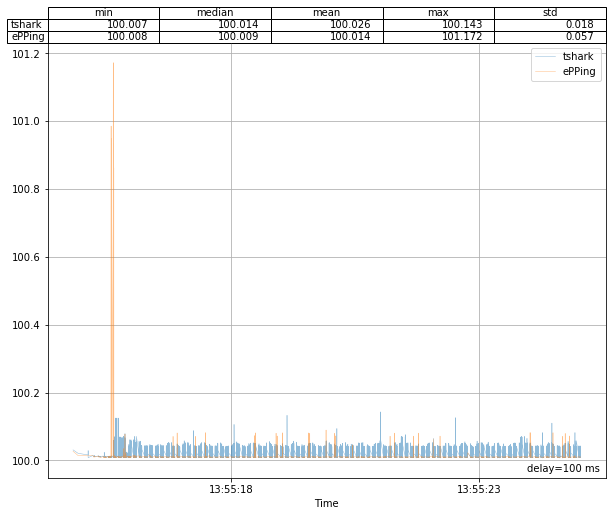

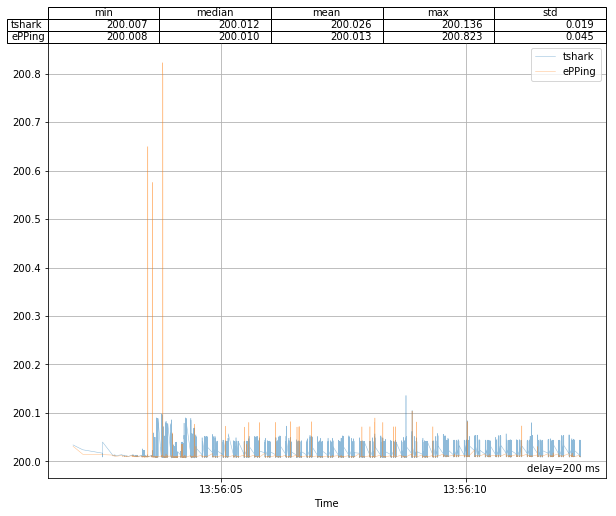

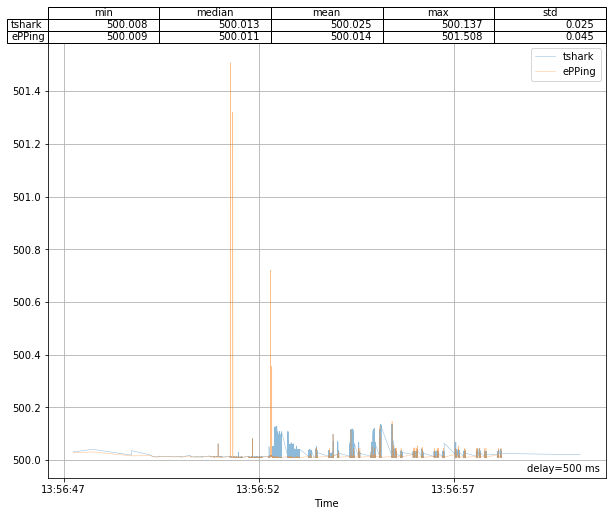

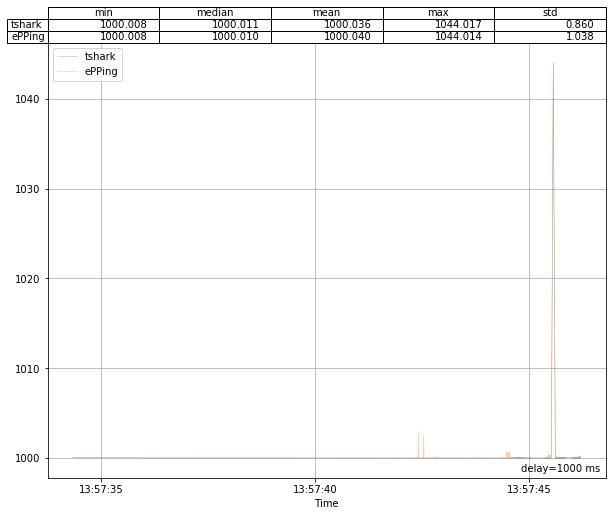

In [81]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms".format(delay), 
              va="bottom", ha="right", transform=axes.transAxes)

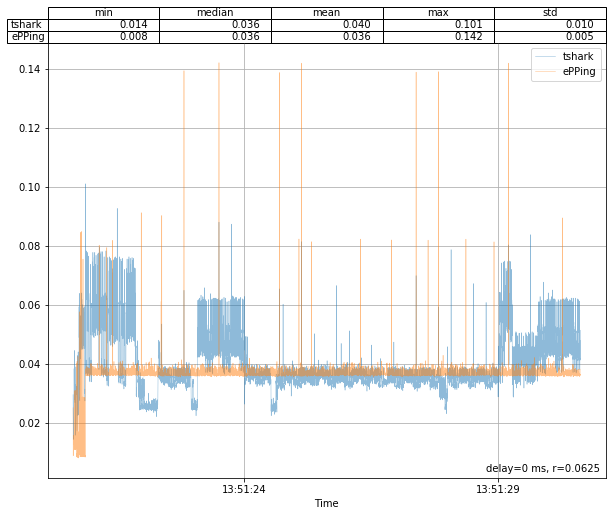

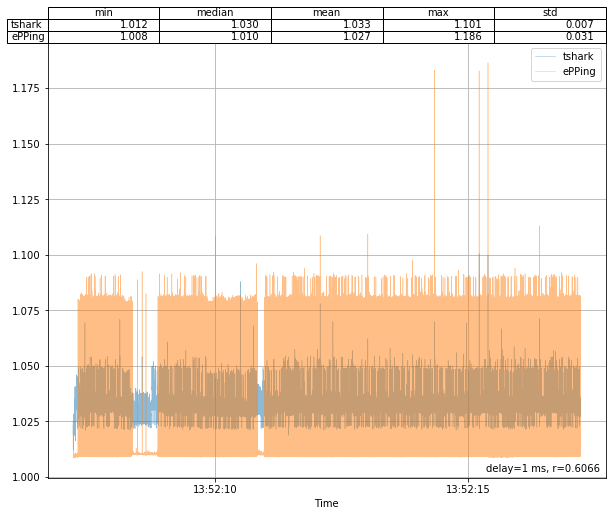

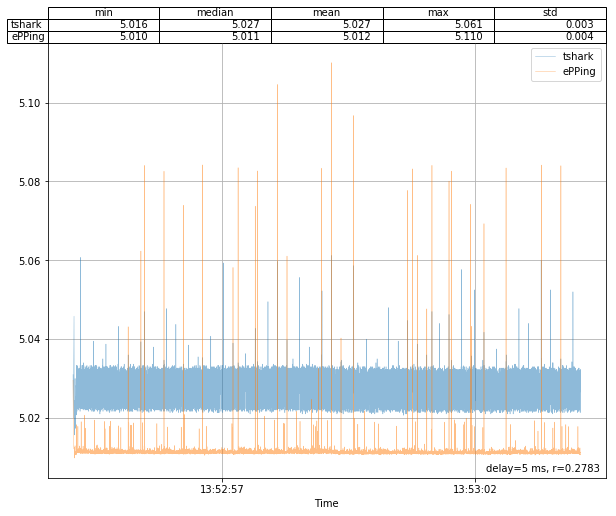

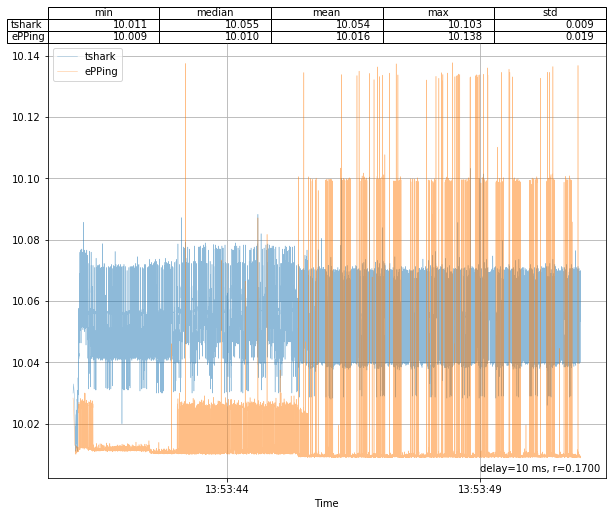

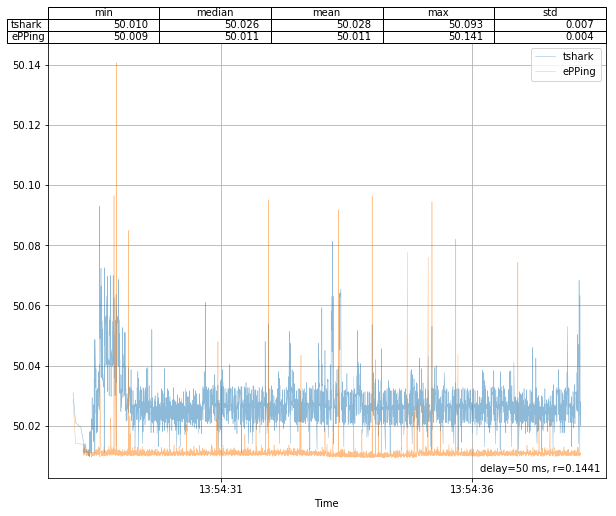

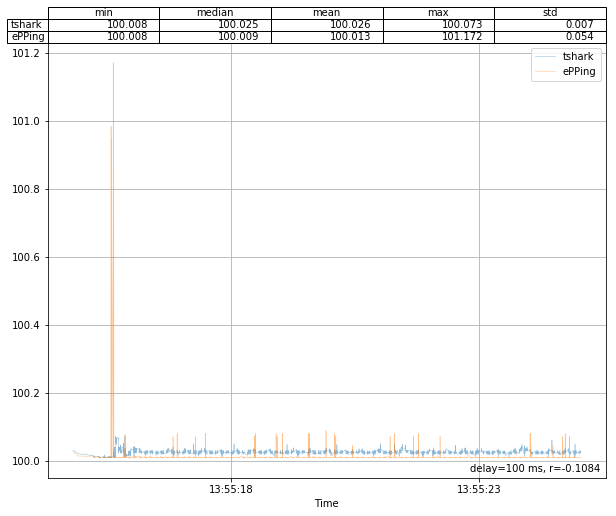

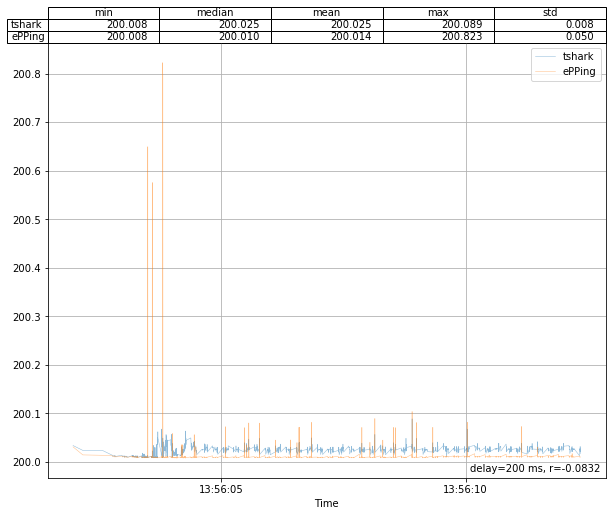

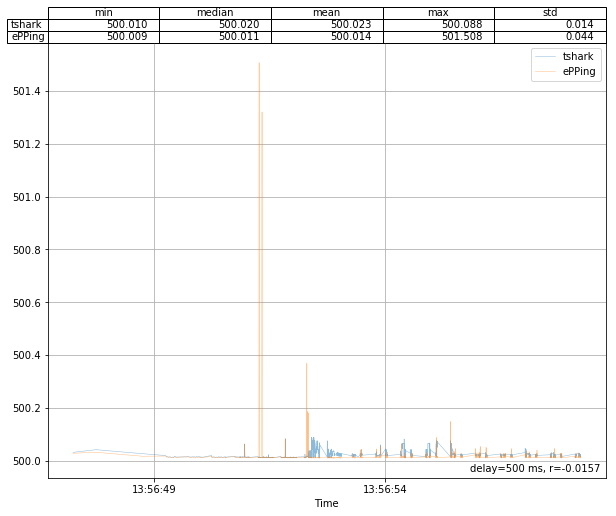

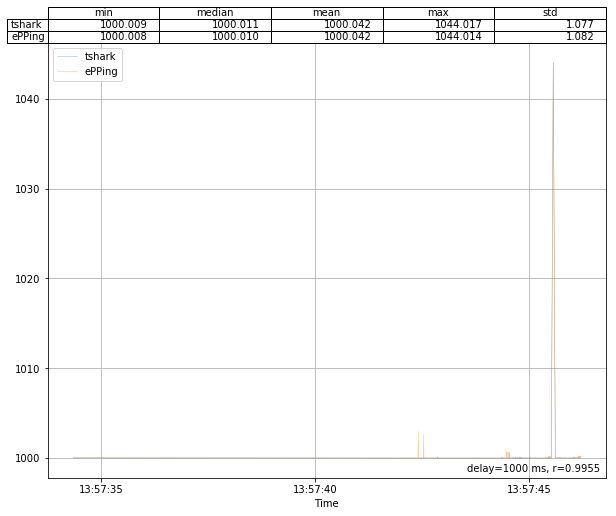

In [82]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt_ms"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt_ms"].mean()
    common_idx = sorted(list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index))))
    d1 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt_ms"].values, d2["rtt_ms"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

<a id="res_mixed"></a>
## Results with tuned-adm profile latency-performance on middlebox only
(endhosts using balanced)

In [83]:
%%time
data5 = load_all_rtt_data("pping_testing/tcp_rtt_accuracy/latencyperf-balanced/2022-05-15T161223")
data = data5

CPU times: user 48.5 s, sys: 565 ms, total: 49.1 s
Wall time: 3min 22s


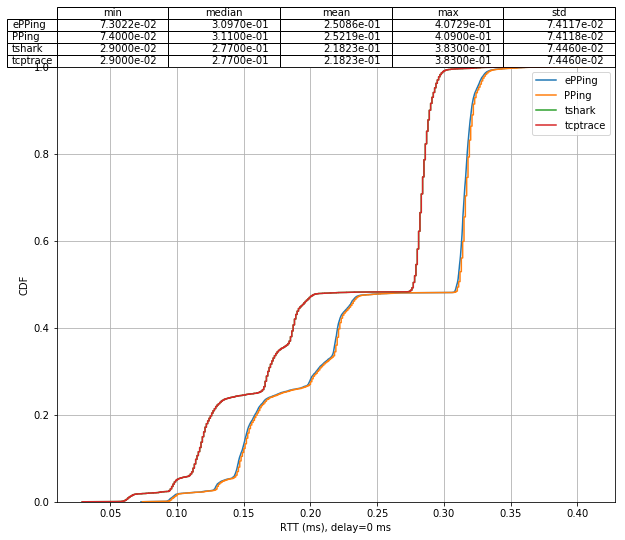

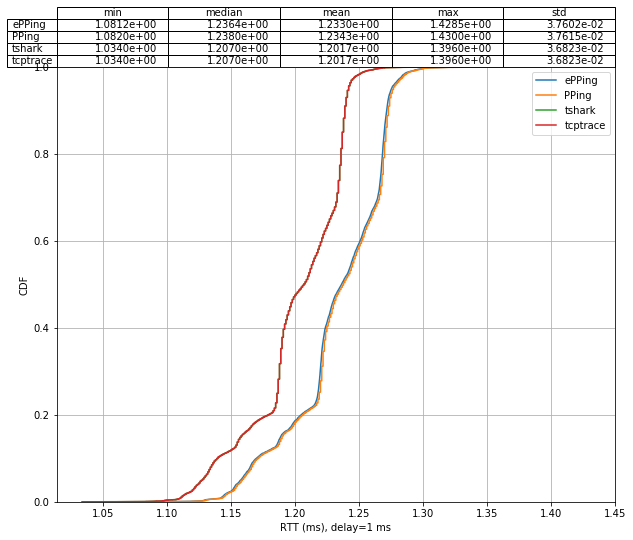

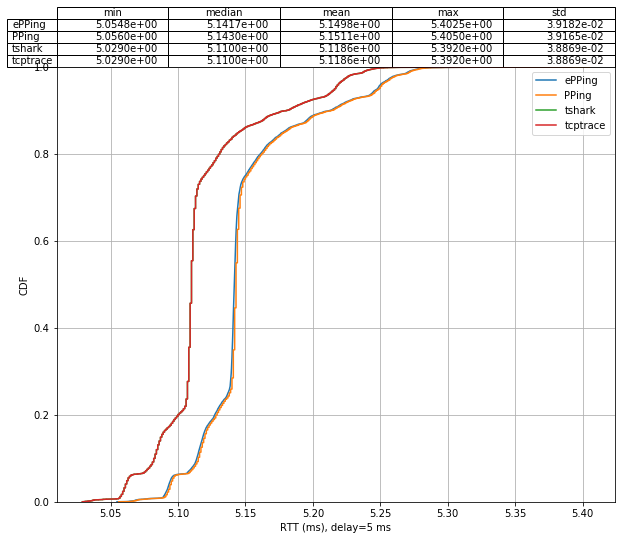

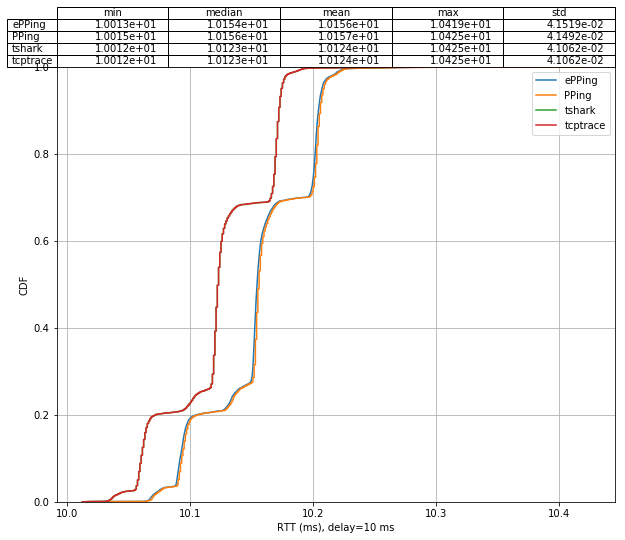

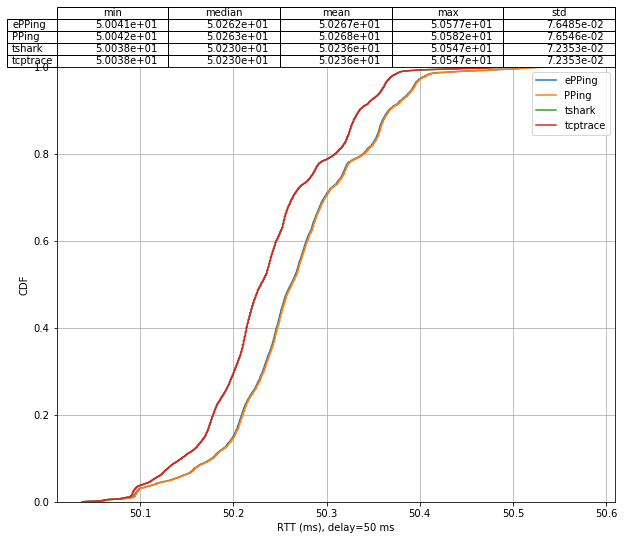

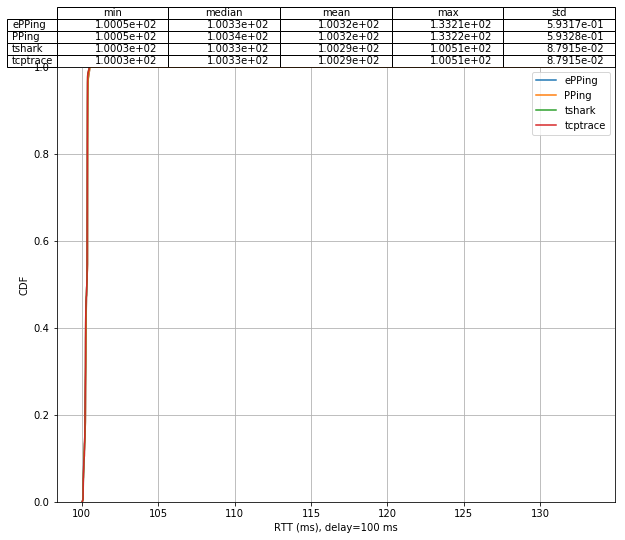

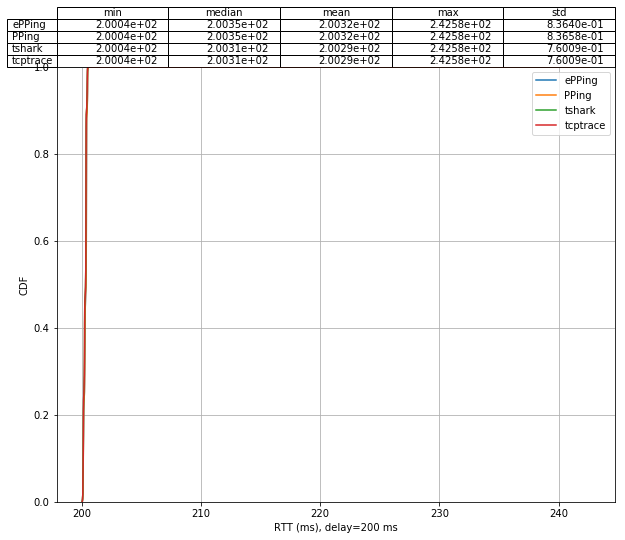

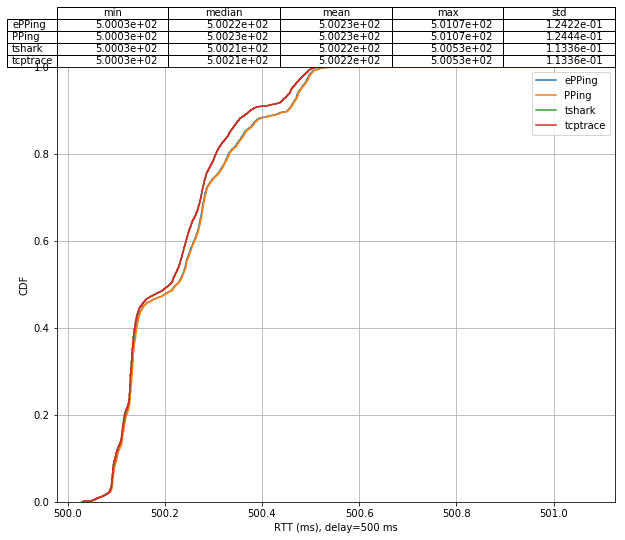

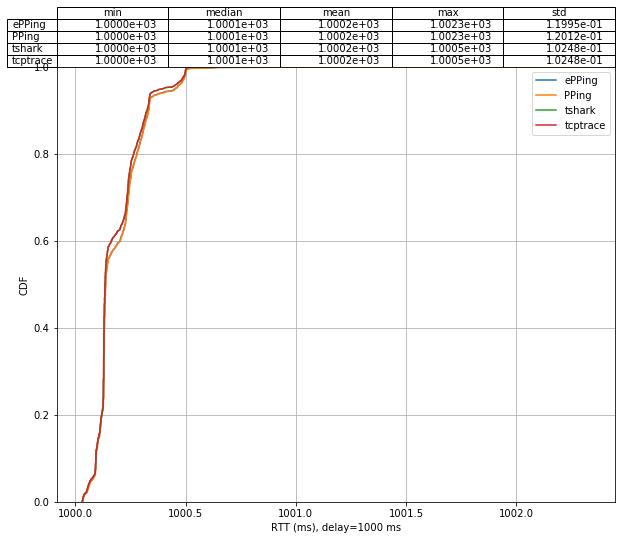

In [84]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT (ms), delay={} ms".format(delay))

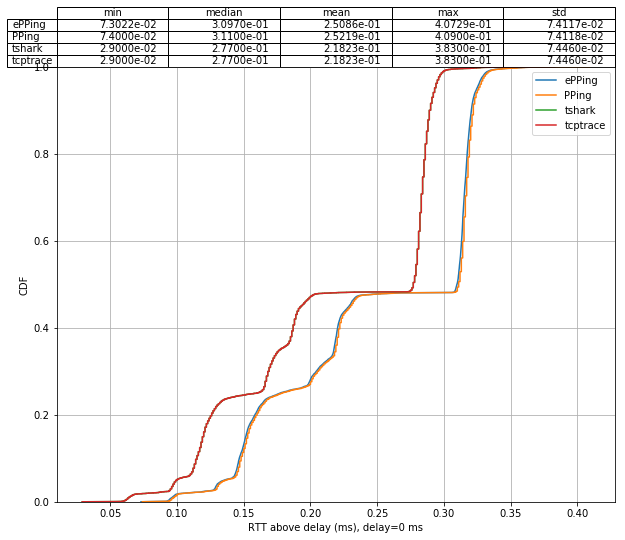

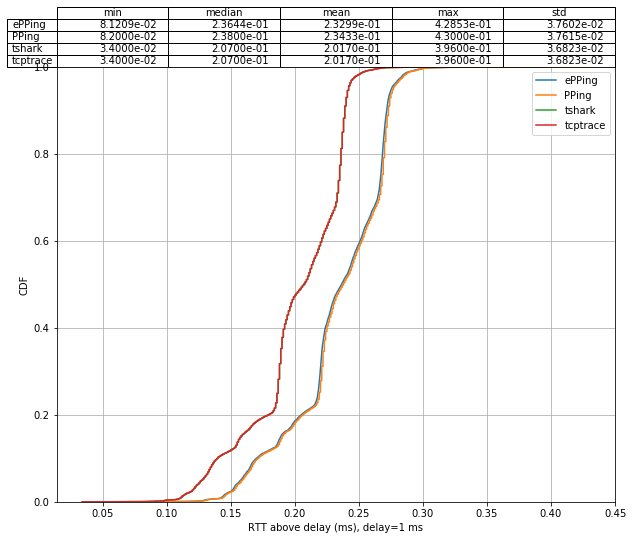

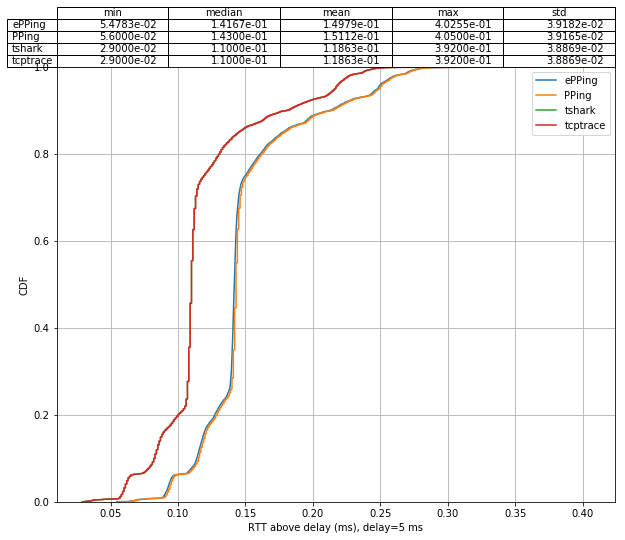

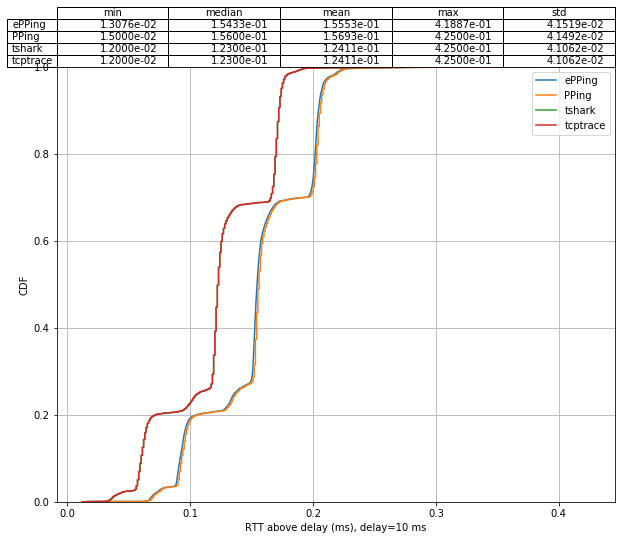

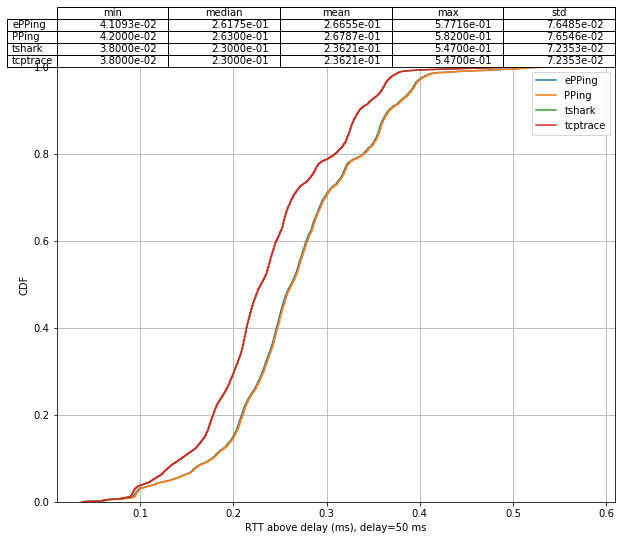

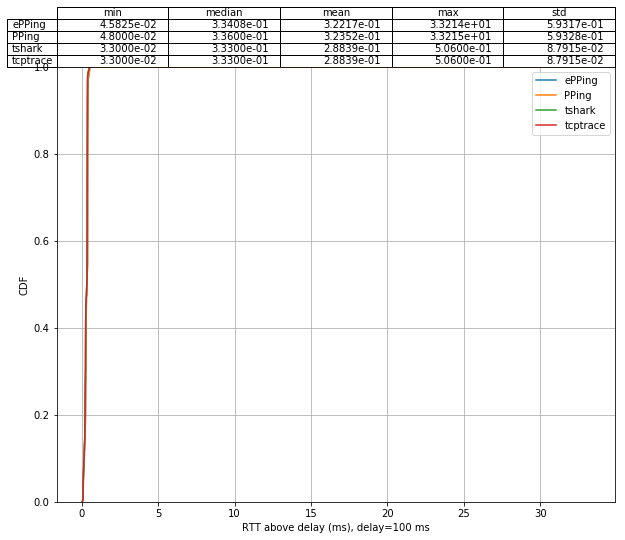

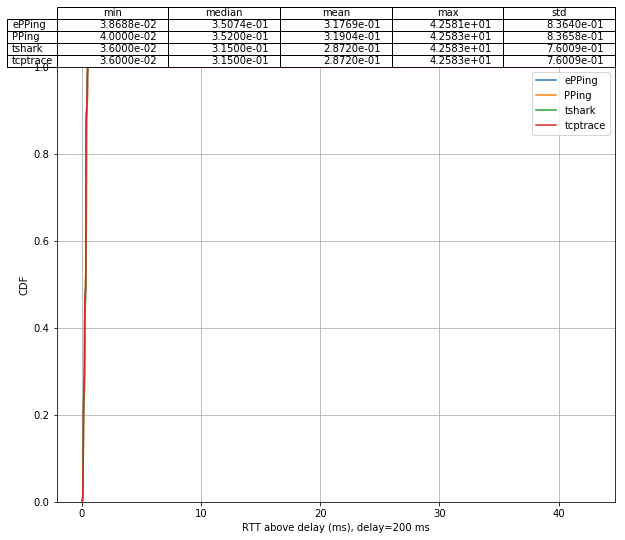

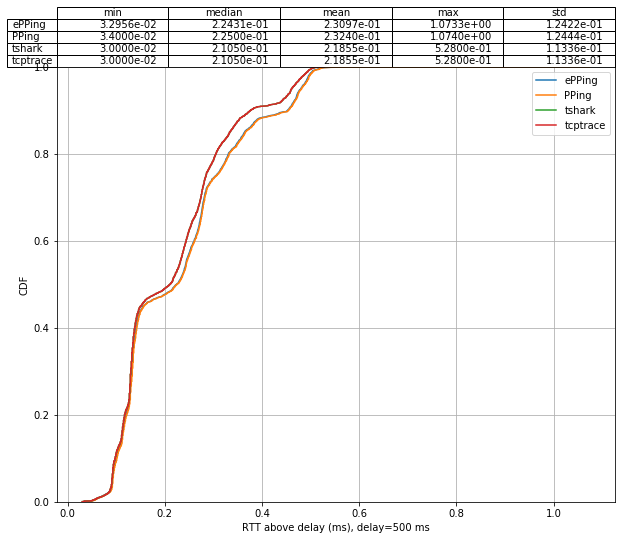

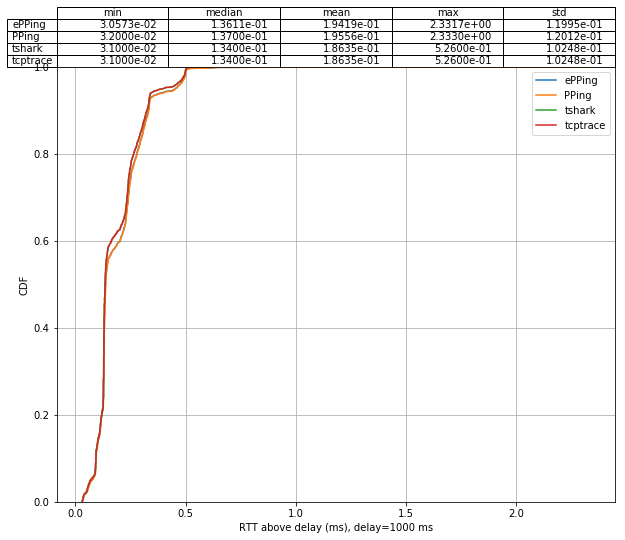

In [85]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_off_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT above delay (ms), delay={} ms".format(delay))

In [86]:
for delay in sorted(data.keys()):
    rtt1 = data[delay]["tshark"]["rtt"].values
    rtt2 = data[delay]["tcptrace"]["rtt"].values
    
    print("delay = {}ms, equal: {}, close: {}".format(
        delay, (rtt1 == rtt2).all(), np.isclose(rtt1, rtt2, rtol=0, atol=1e-10).all()))

delay = 0ms, equal: False, close: True
delay = 1ms, equal: False, close: True
delay = 5ms, equal: False, close: True
delay = 10ms, equal: False, close: True
delay = 50ms, equal: False, close: True
delay = 100ms, equal: False, close: True
delay = 200ms, equal: False, close: True
delay = 500ms, equal: False, close: True
delay = 1000ms, equal: False, close: True


Difference: PPing - ePPing


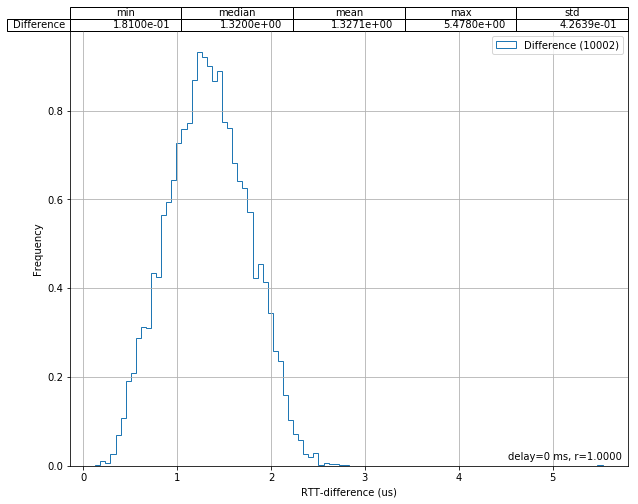

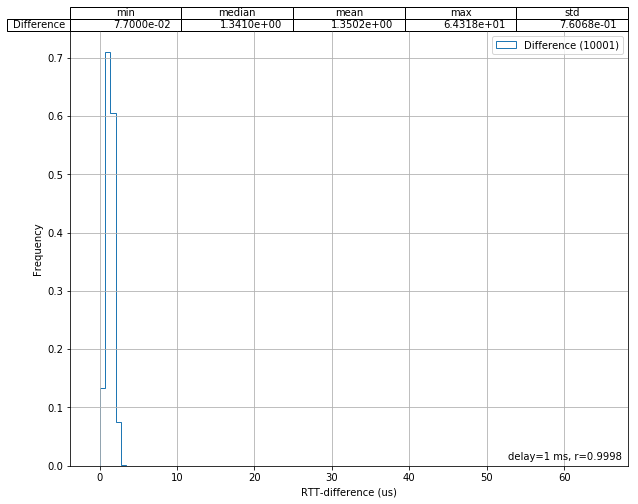

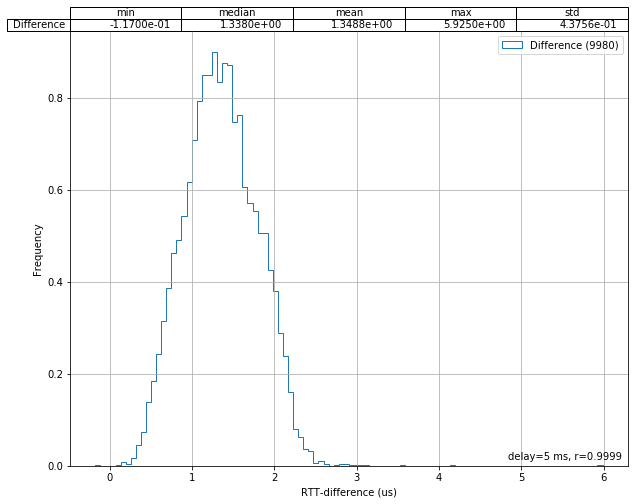

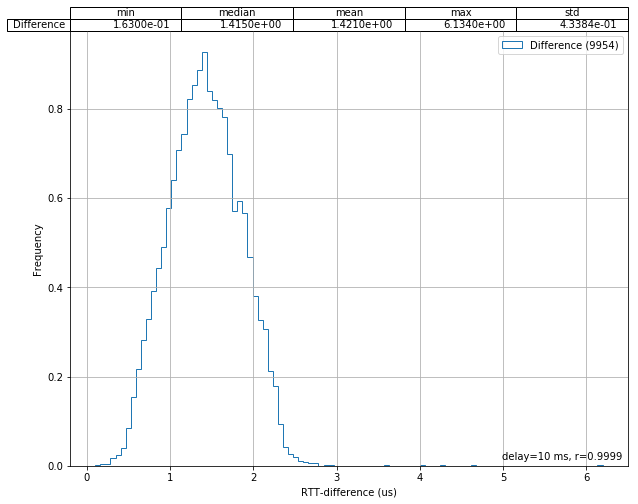

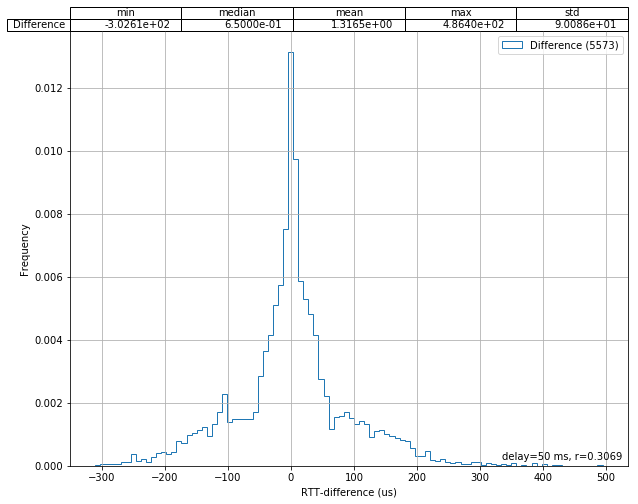

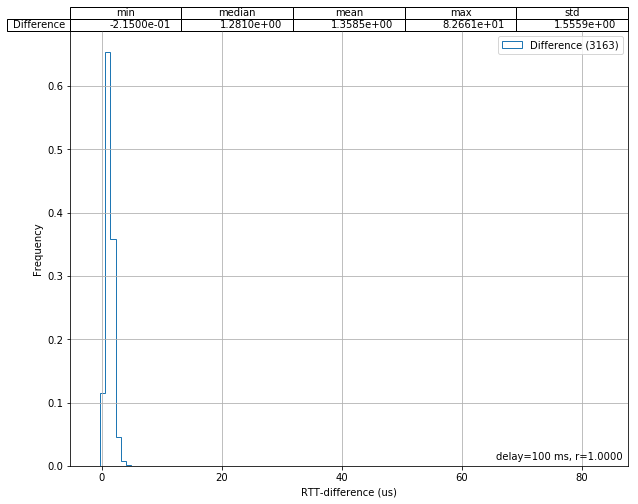

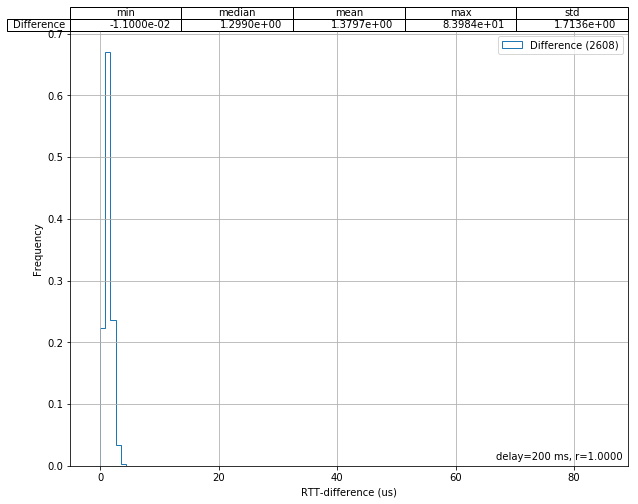

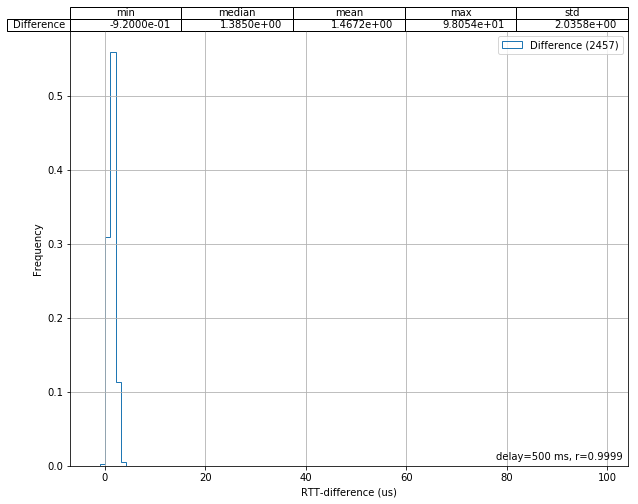

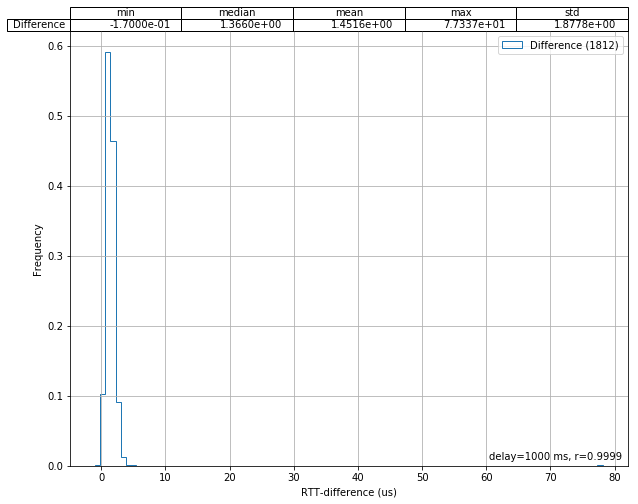

In [87]:
print("Difference: PPing - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["PPing"]
    d2 = data[delay]["ePPing"]
    
    if len(d2) == len(d1) + 1:
        d2 = d2.iloc[1:]
    if len(d2) != len(d1):
        print("Warning, for delay {} PPing {} entries, ePPing {} entries".format(
            delay, len(d1), len(d2)), file=sys.stderr)
        continue
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

Large differences between ePPing and PPing at 50ms delay, probably missmatched RTTs (ECDF is very similar)

Difference: tshark - ePPing


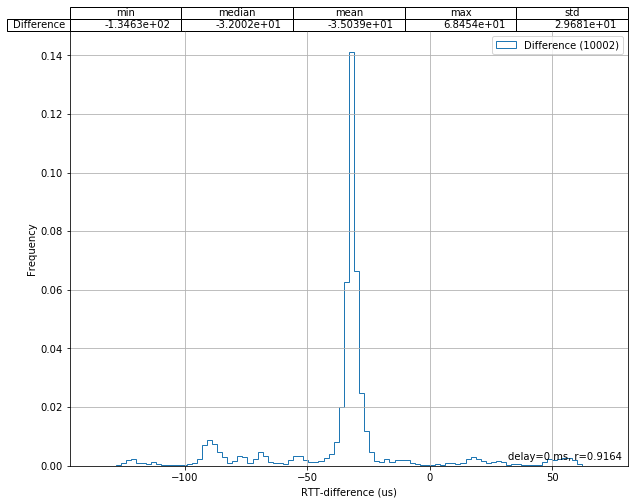

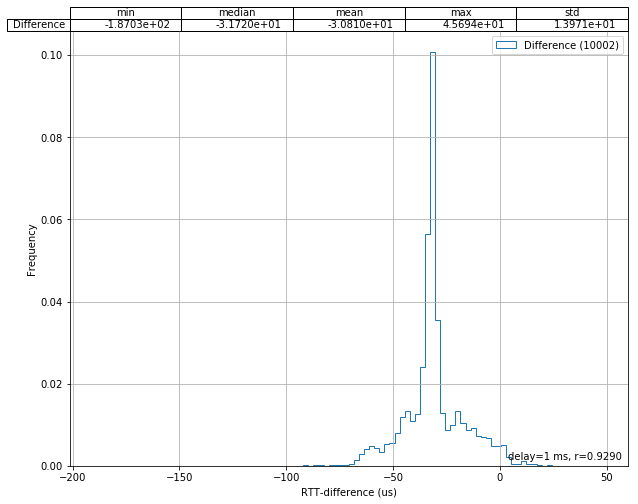

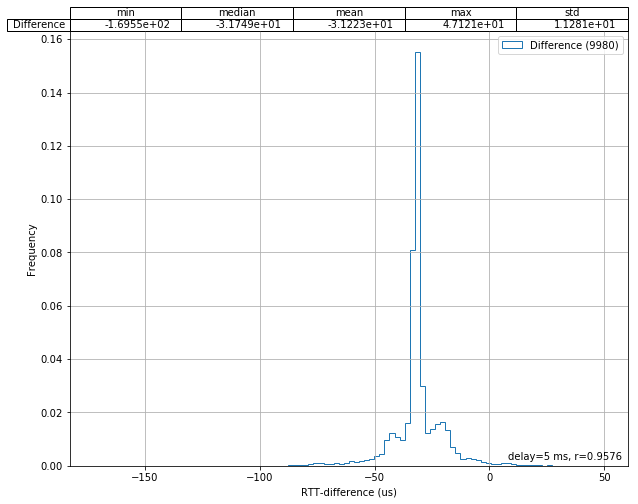

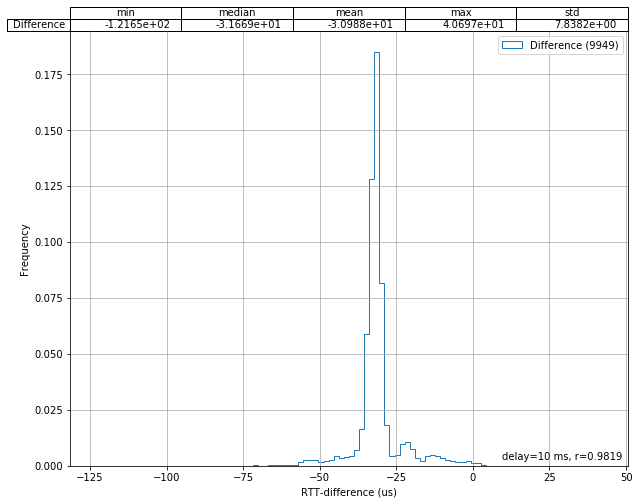

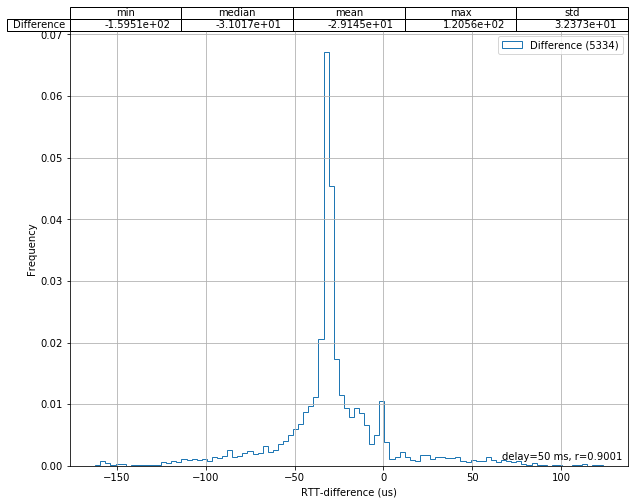

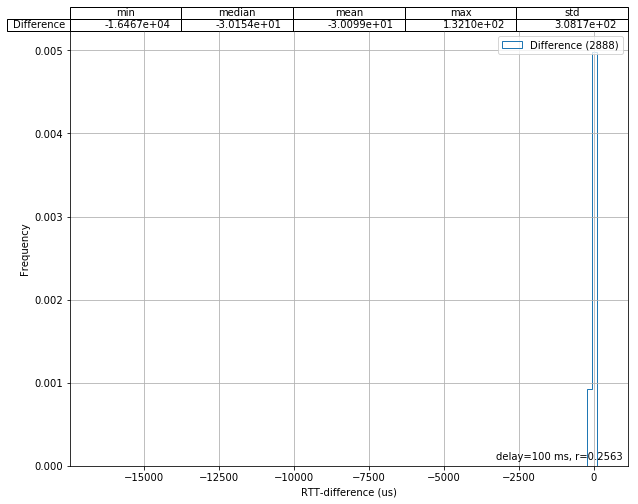

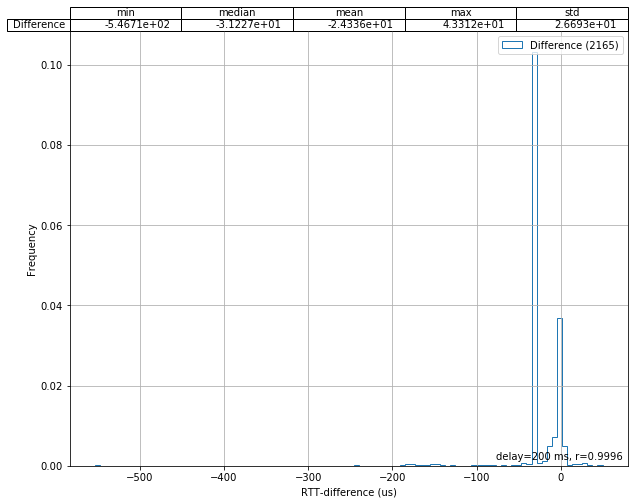

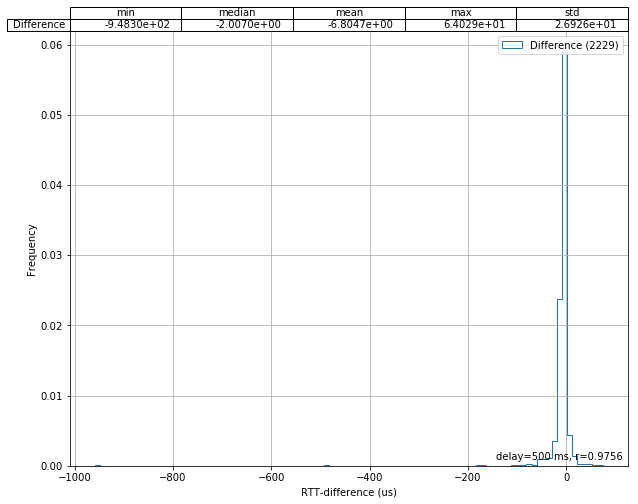

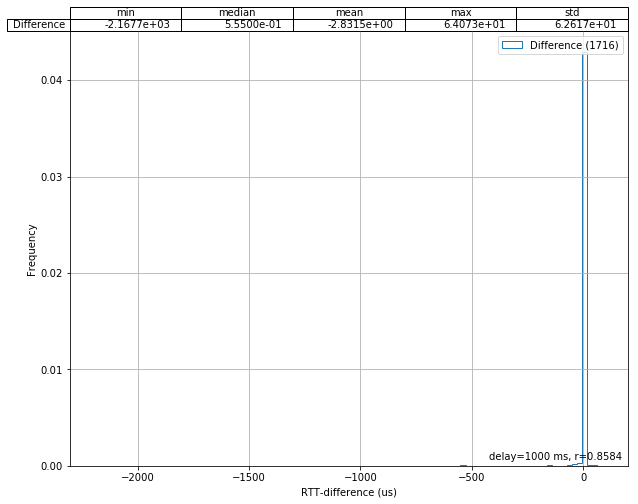

In [88]:
print("Difference: tshark - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt"].mean()
    common_idx = list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index)))
    d1 = pd.DataFrame({"rtt": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"rtt": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

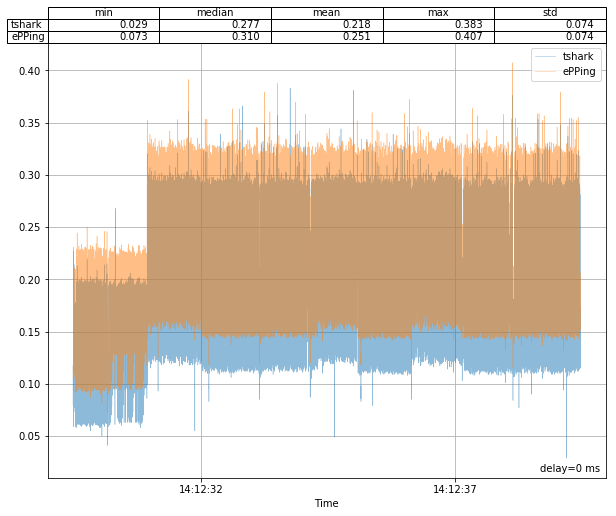

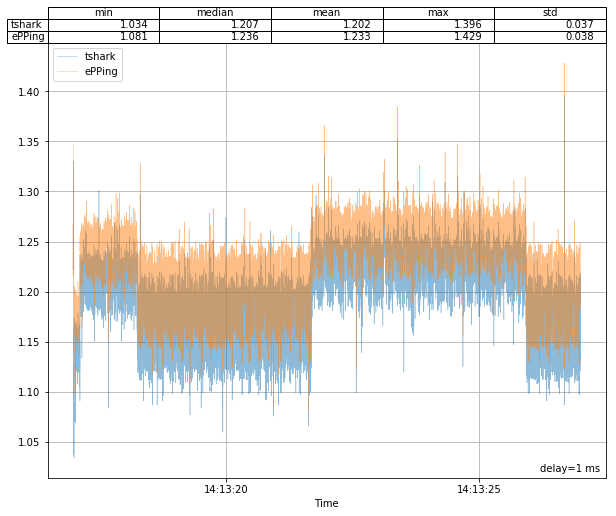

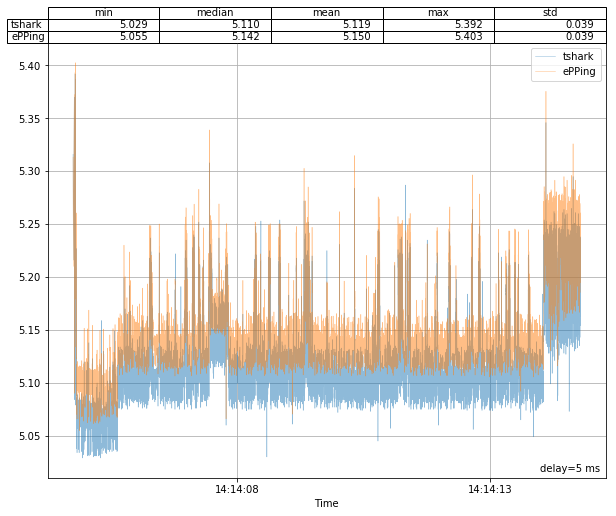

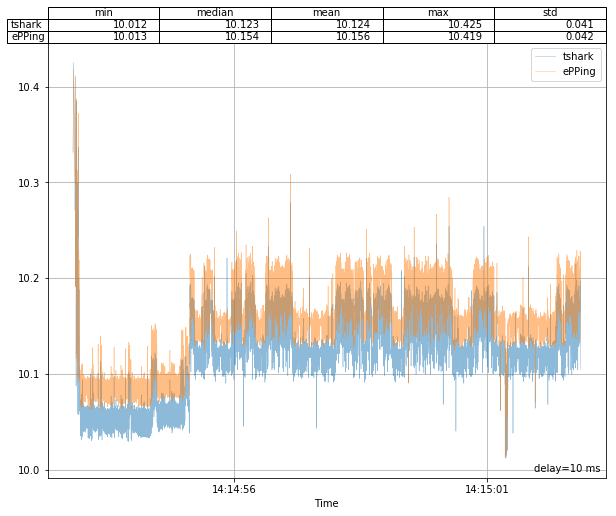

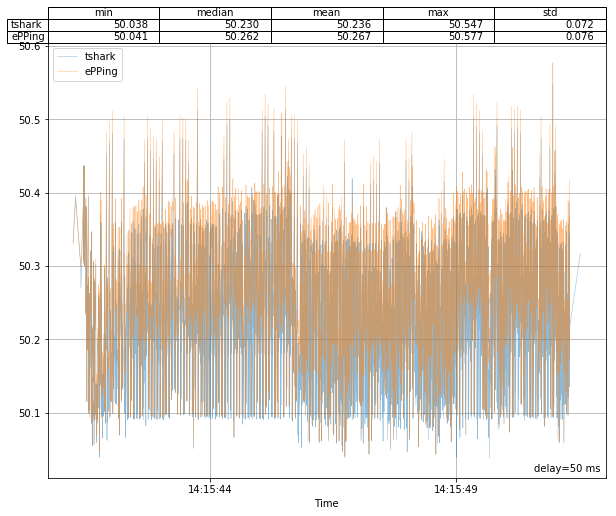

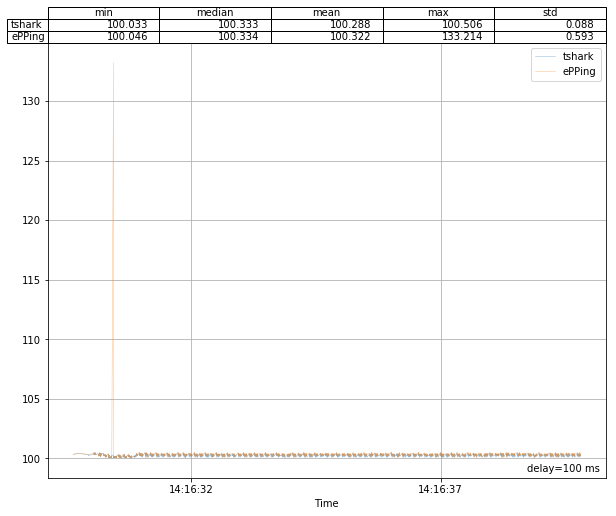

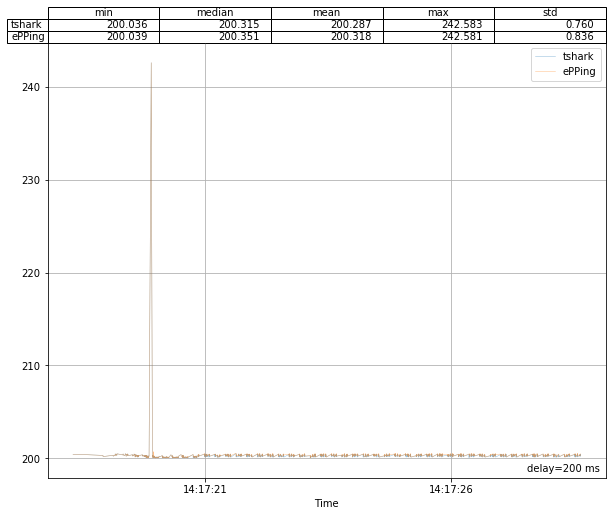

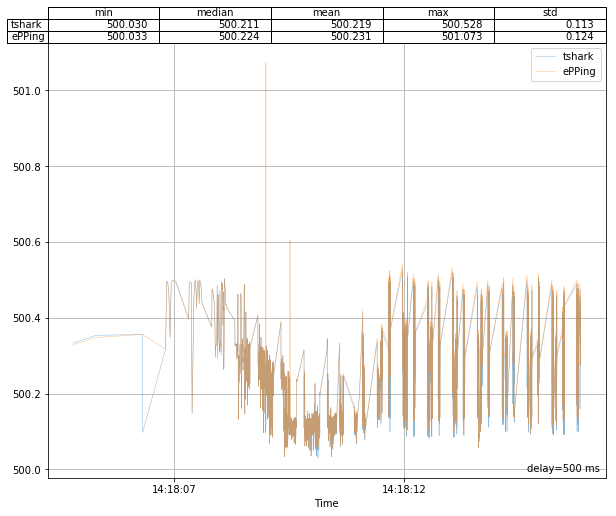

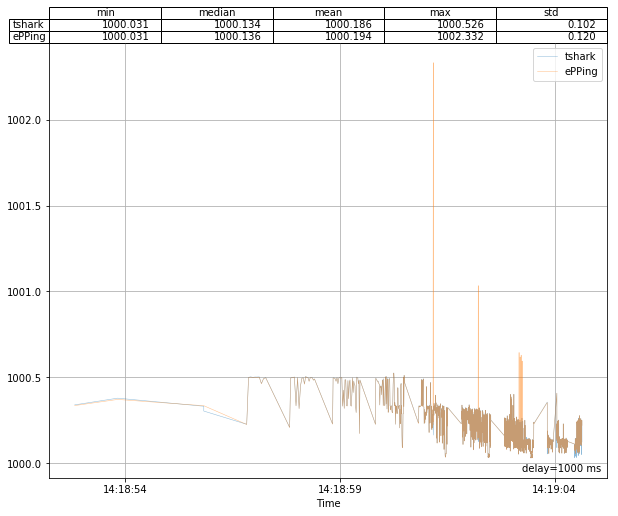

In [89]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms".format(delay), 
              va="bottom", ha="right", transform=axes.transAxes)

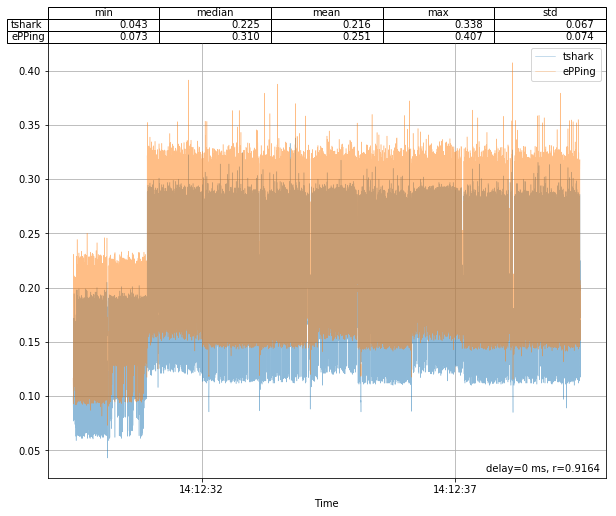

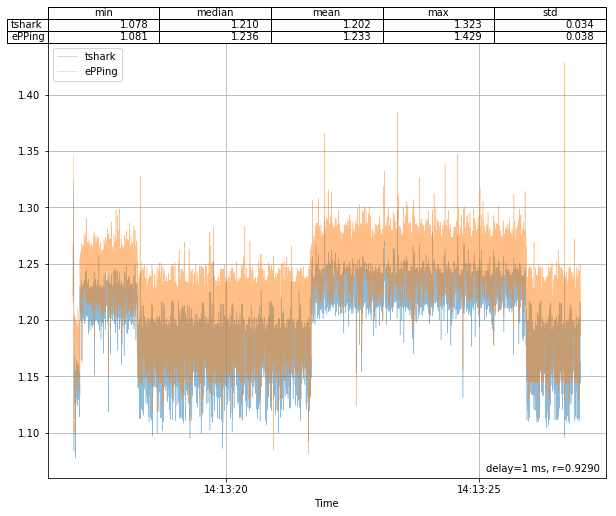

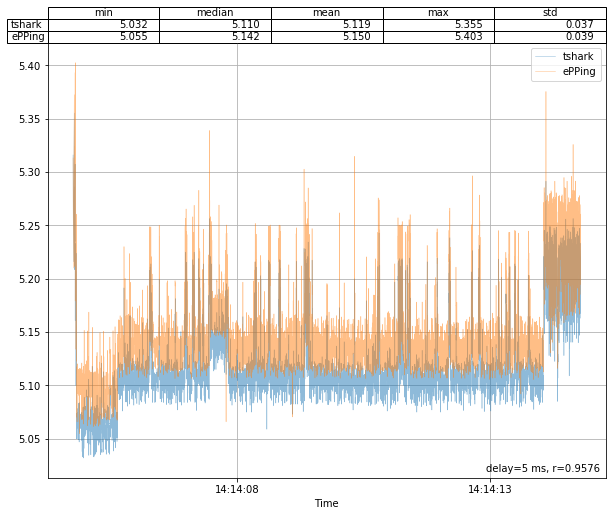

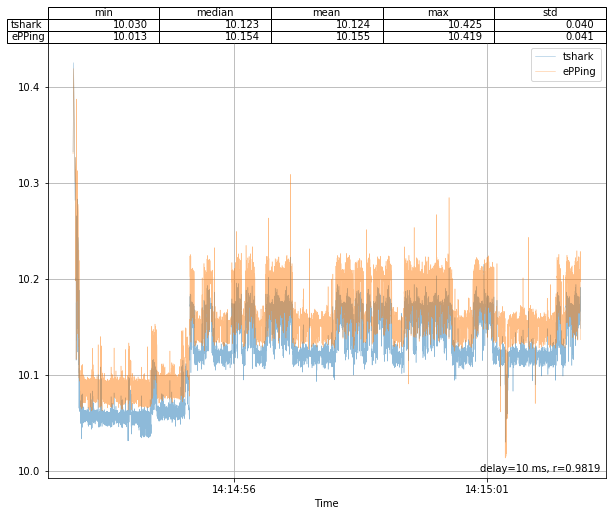

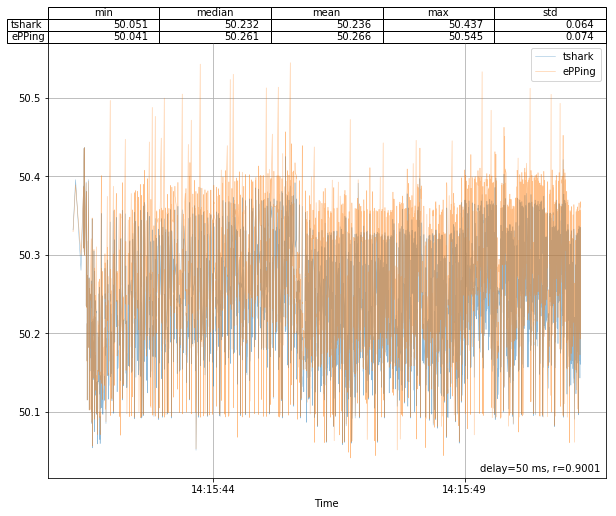

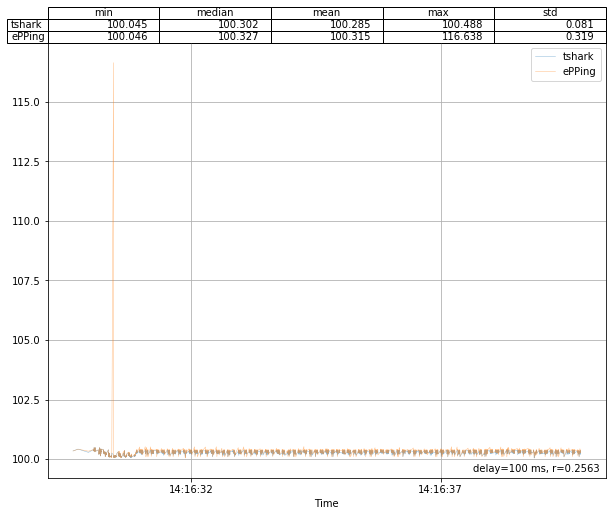

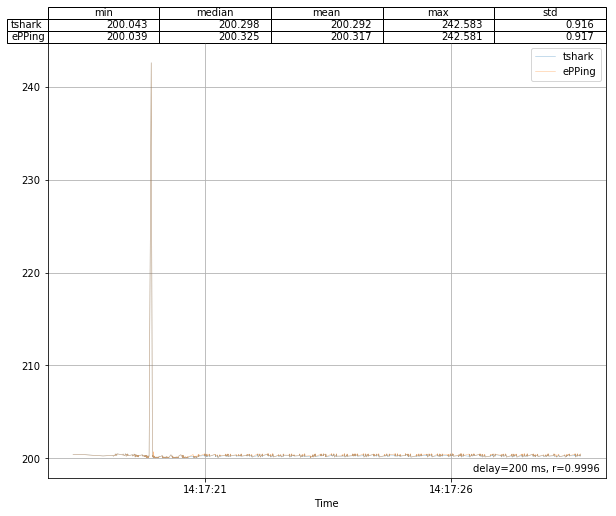

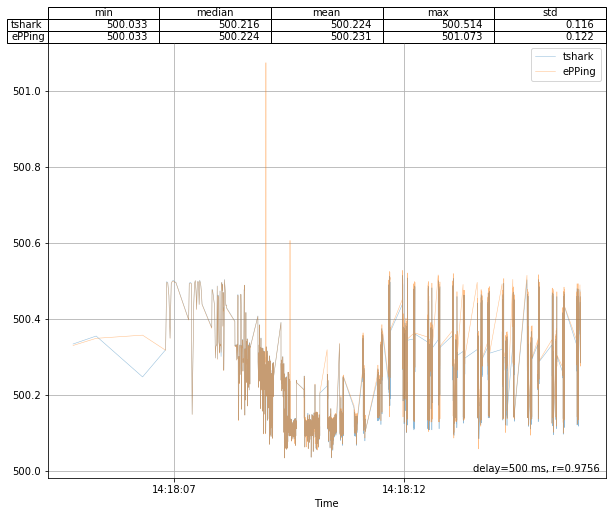

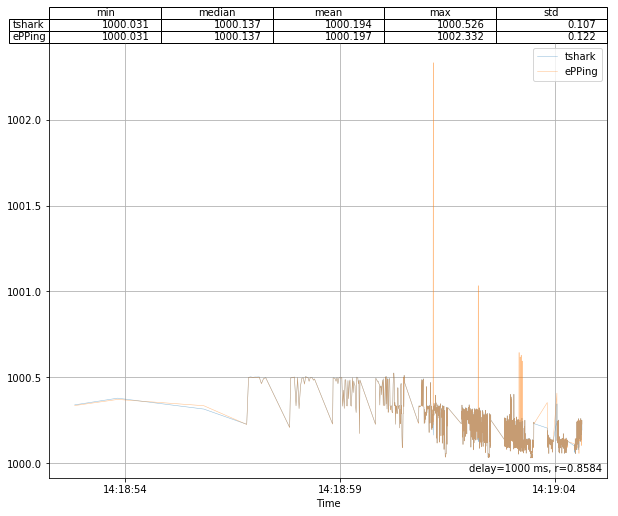

In [90]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt_ms"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt_ms"].mean()
    common_idx = sorted(list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index))))
    d1 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt_ms"].values, d2["rtt_ms"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

<a id="res_old"></a>
## Results with previous test data 
(where middlebox had latency-performance and endhosts had balanced)

In [65]:
%%time
data3 = load_all_rtt_data("epping_tcp_test/2022-05-13T130721")
data = data3

CPU times: user 39.4 s, sys: 413 ms, total: 39.8 s
Wall time: 2min 45s


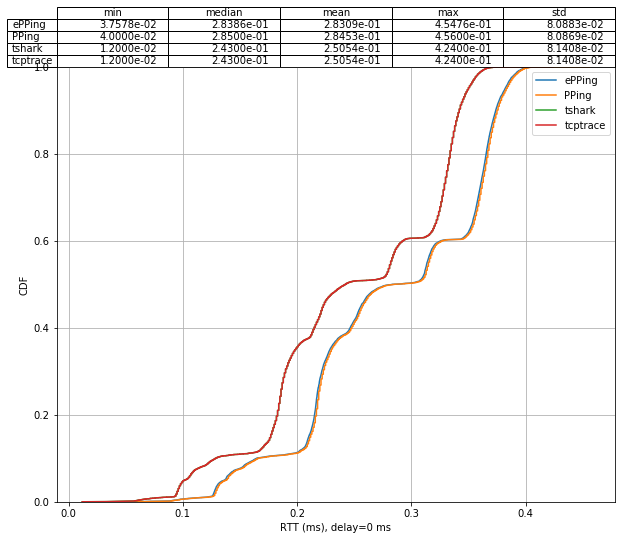

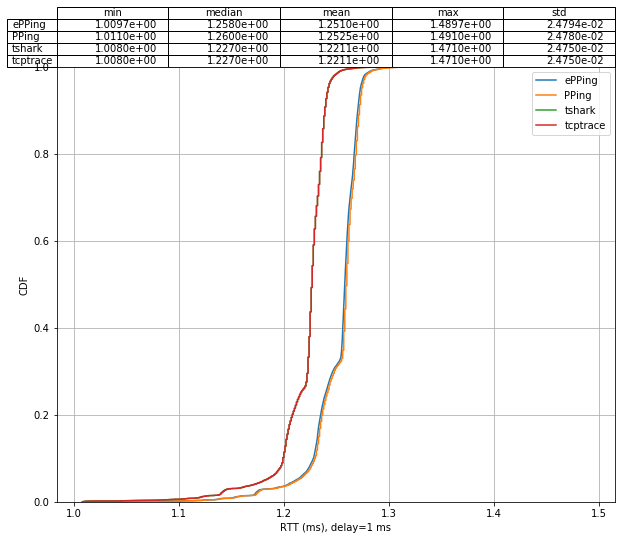

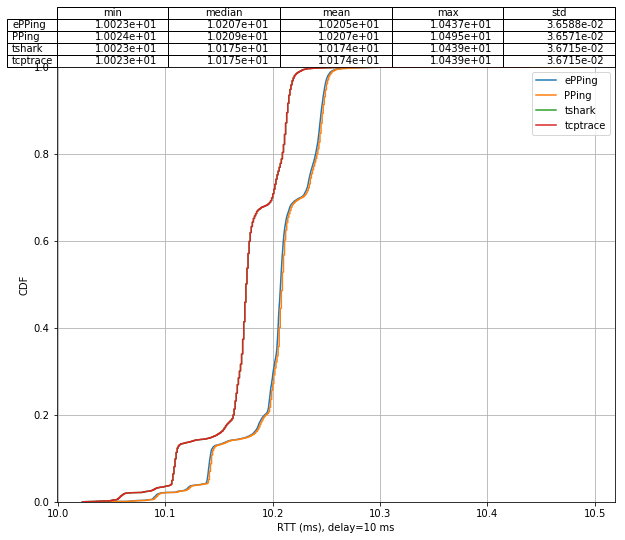

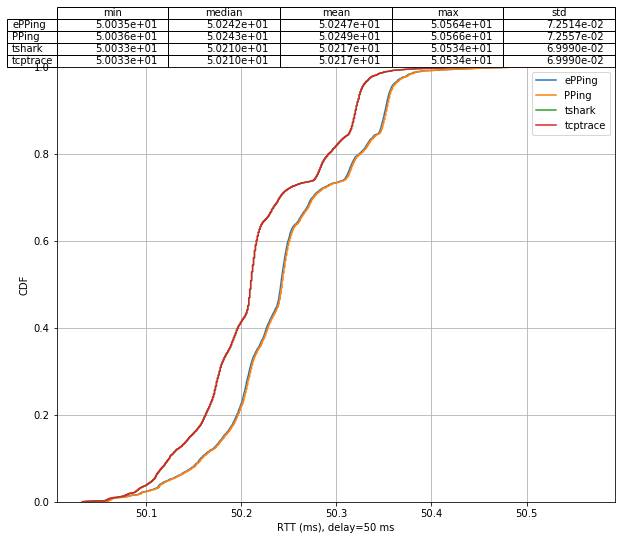

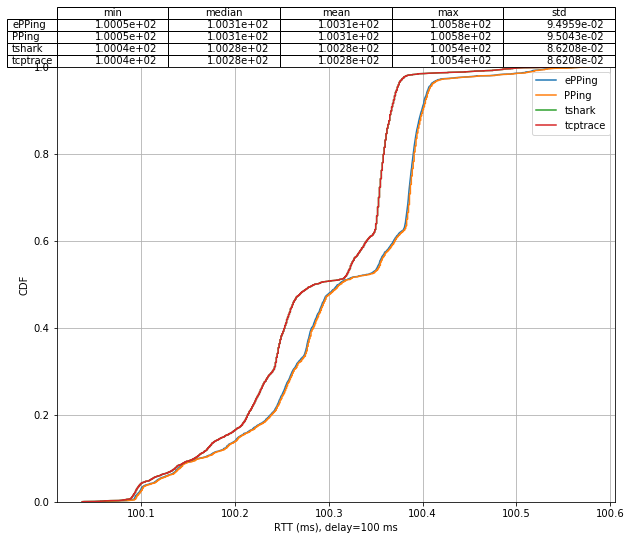

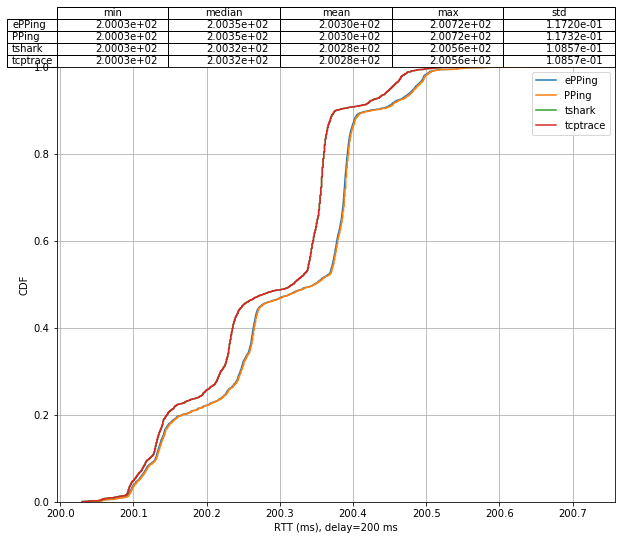

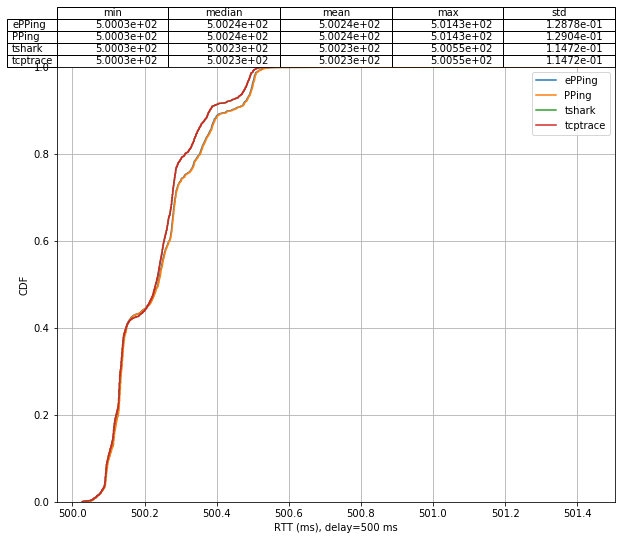

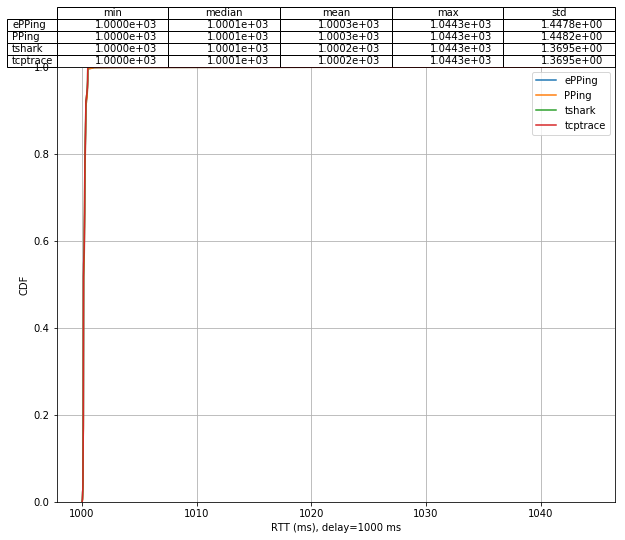

In [66]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT (ms), delay={} ms".format(delay))

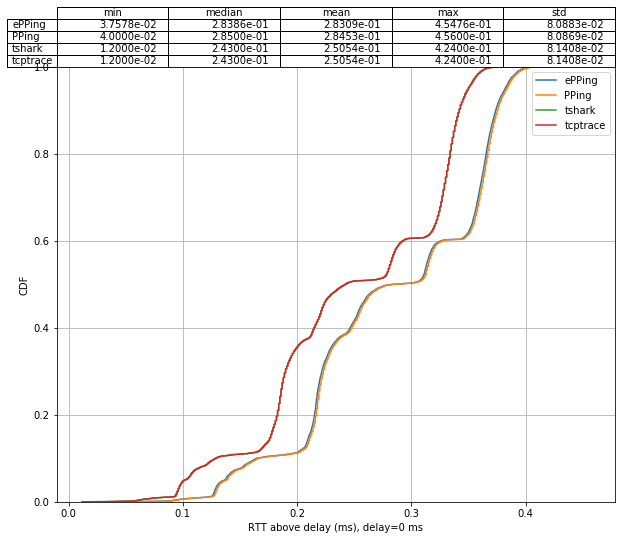

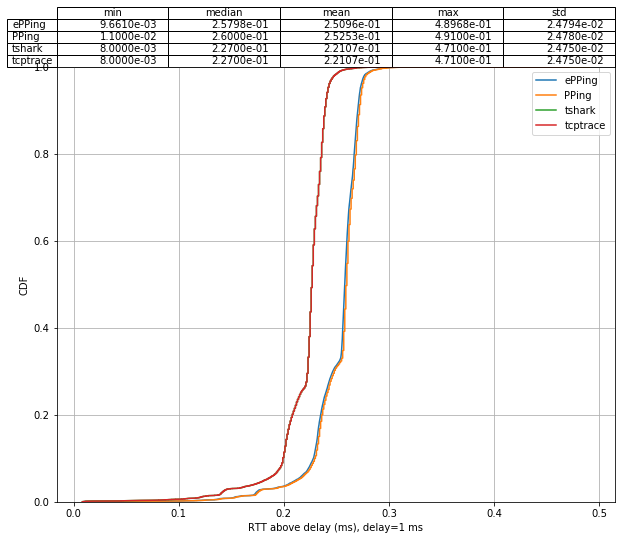

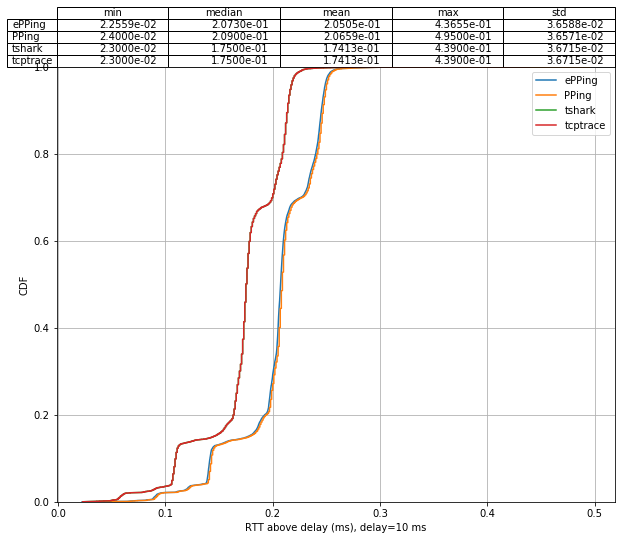

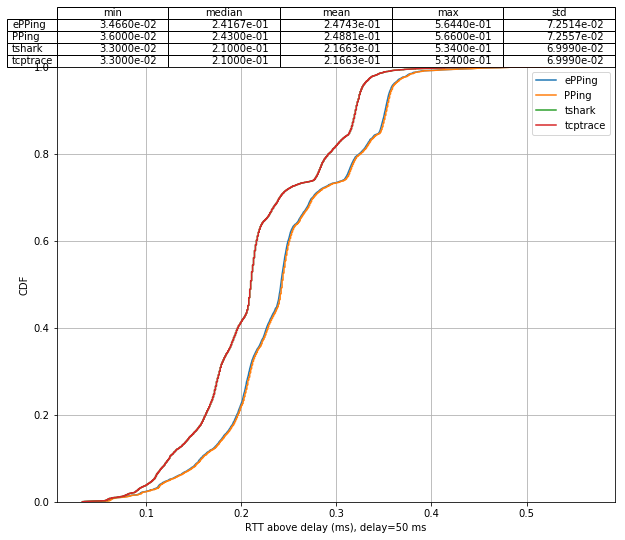

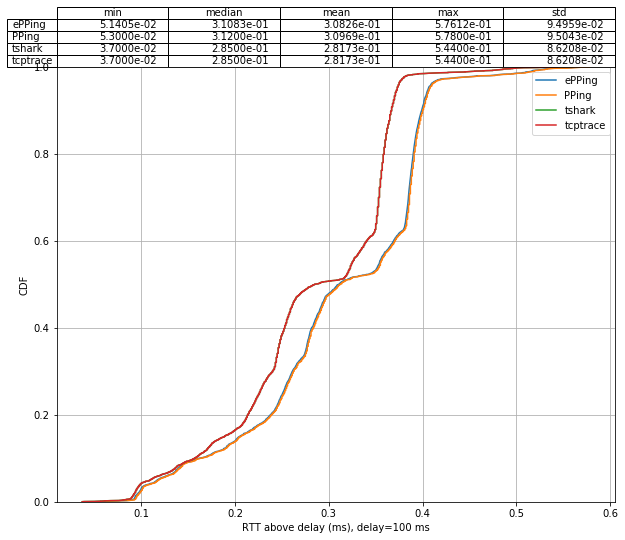

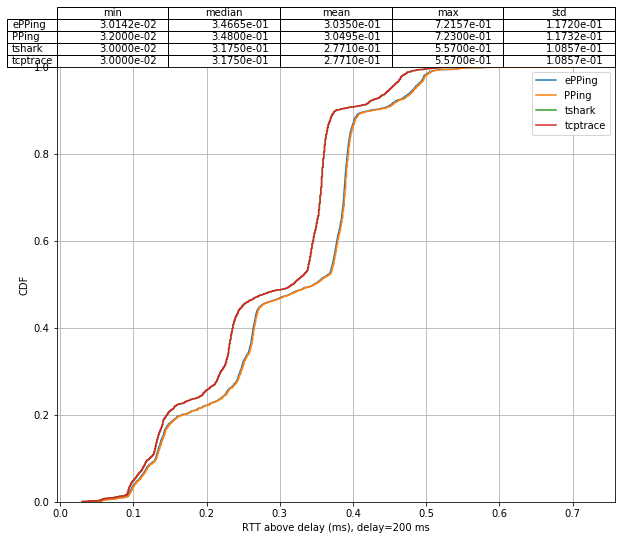

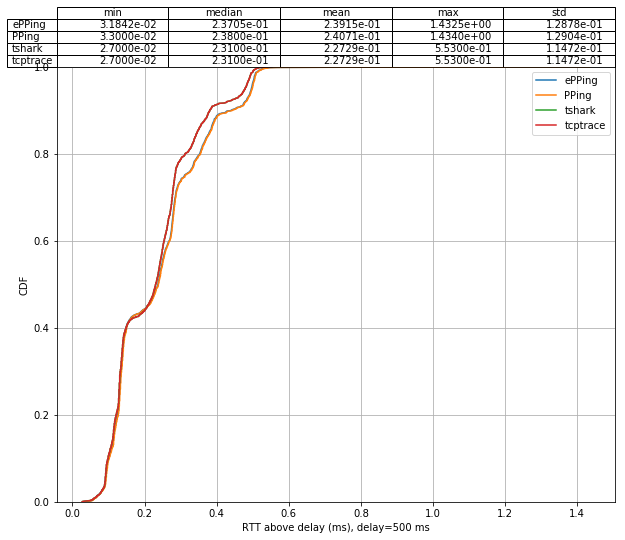

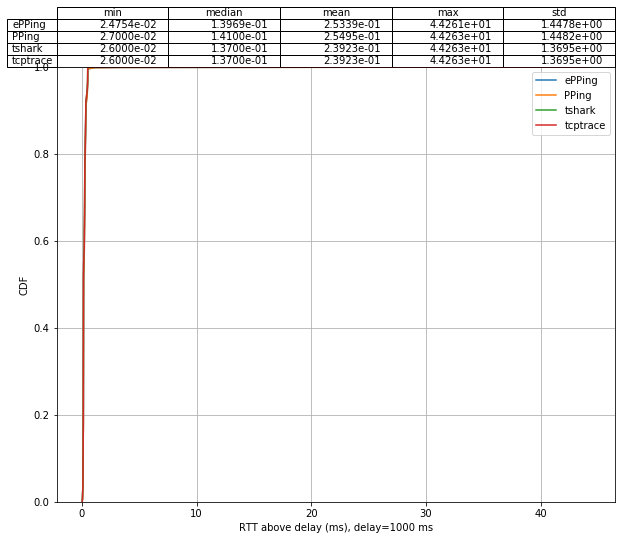

In [67]:
for delay in sorted(data.keys()):
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_cdf(data[delay], "rtt_off_ms", axes=axes, 
                              print_stats=True, stat_kwargs={"fmt": "{:.4e}"})
    axes.set_xlabel("RTT above delay (ms), delay={} ms".format(delay))

In [68]:
for delay in sorted(data.keys()):
    rtt1 = data[delay]["tshark"]["rtt"].values
    rtt2 = data[delay]["tcptrace"]["rtt"].values
    
    print("delay = {}ms, equal: {}, close: {}".format(
        delay, (rtt1 == rtt2).all(), np.isclose(rtt1, rtt2, rtol=0, atol=1e-10).all()))

delay = 0ms, equal: False, close: True
delay = 1ms, equal: False, close: True
delay = 10ms, equal: False, close: True
delay = 50ms, equal: False, close: True
delay = 100ms, equal: False, close: True
delay = 200ms, equal: False, close: True
delay = 500ms, equal: False, close: True
delay = 1000ms, equal: False, close: True


Difference: PPing - ePPing


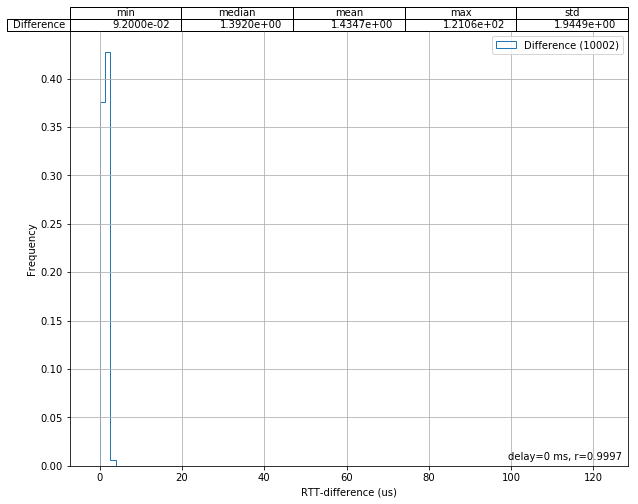

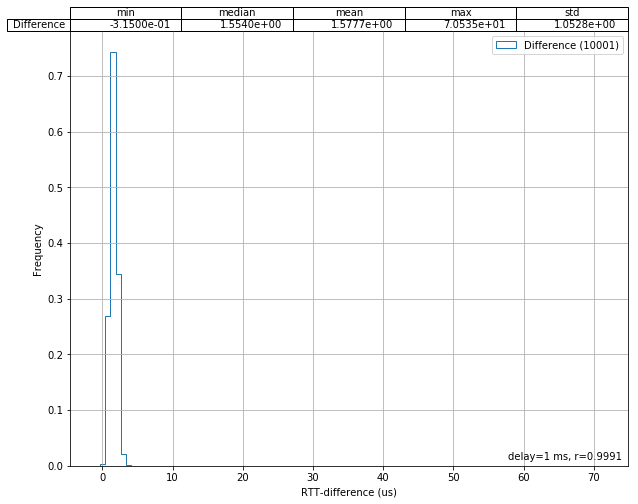

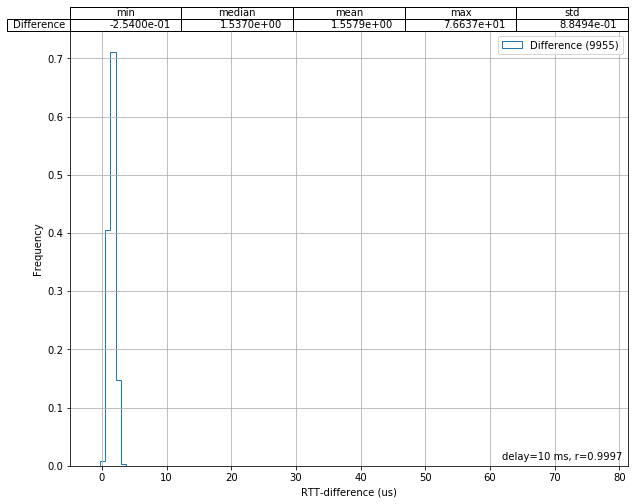

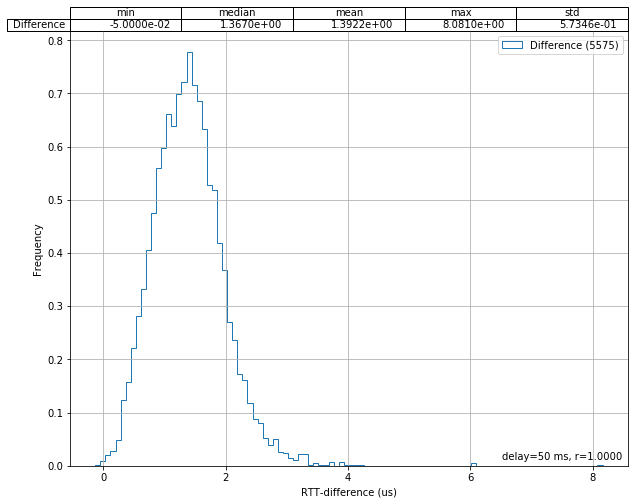

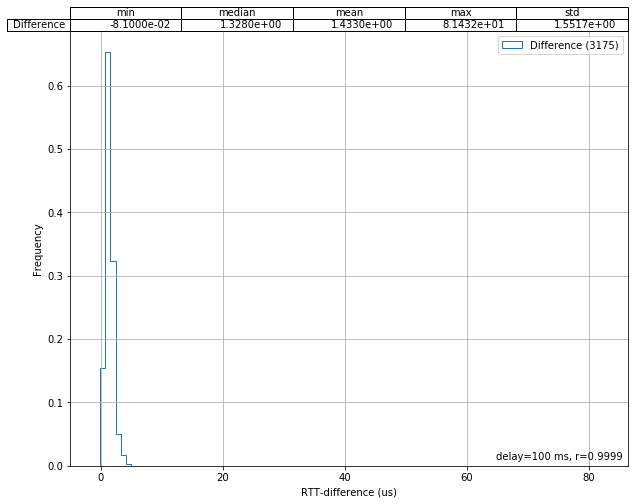

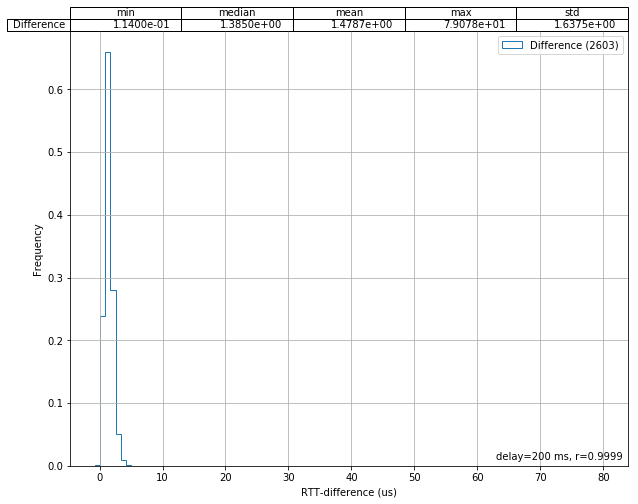

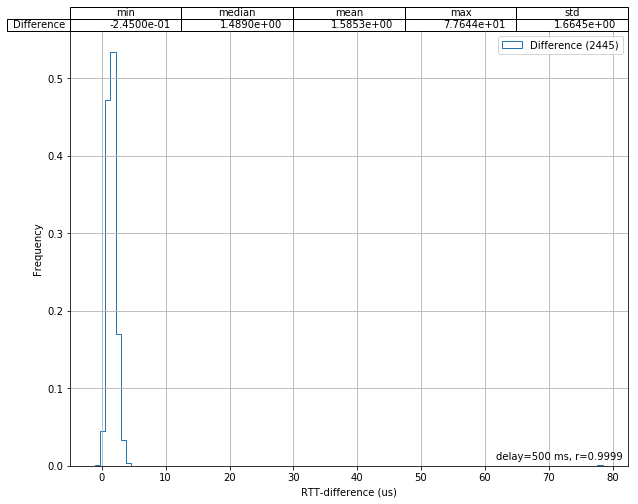

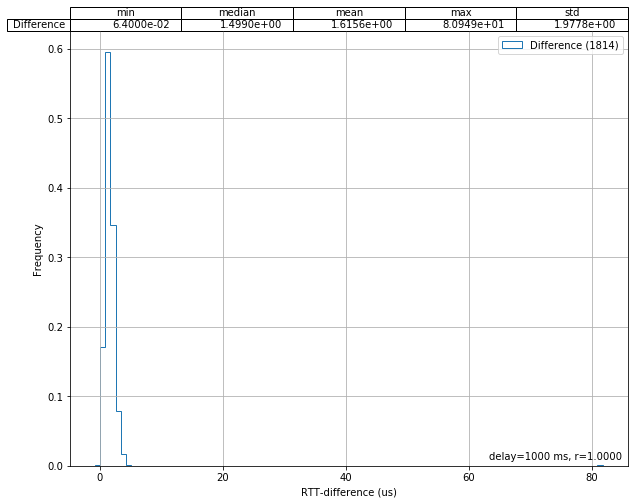

In [69]:
print("Difference: PPing - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["PPing"]
    d2 = data[delay]["ePPing"]
    
    if len(d2) == len(d1) + 1:
        d2 = d2.iloc[1:]
    if len(d2) != len(d1):
        print("Warning, for delay {} PPing {} entries, ePPing {} entries".format(
            delay, len(d1), len(d2)), file=sys.stderr)
        continue
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

Difference: tshark - ePPing


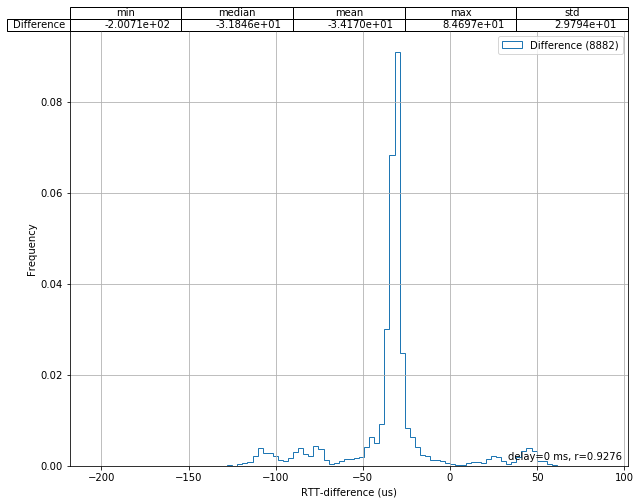

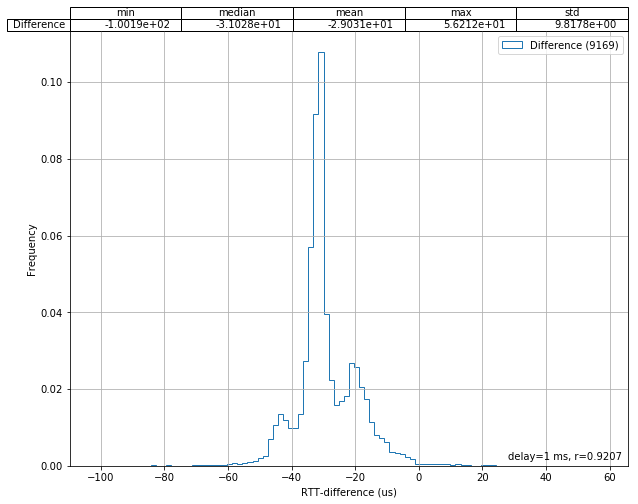

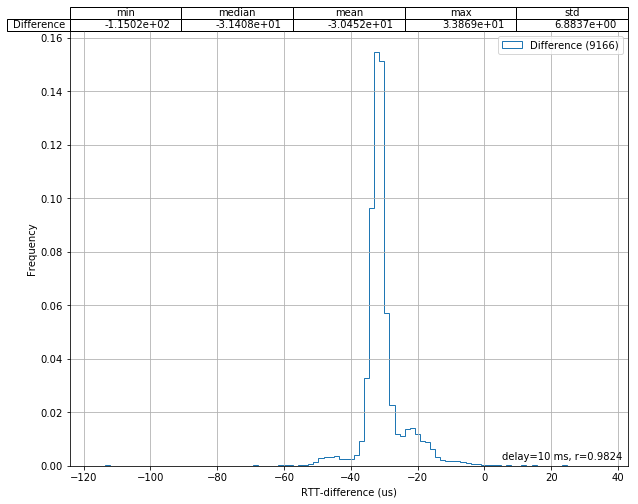

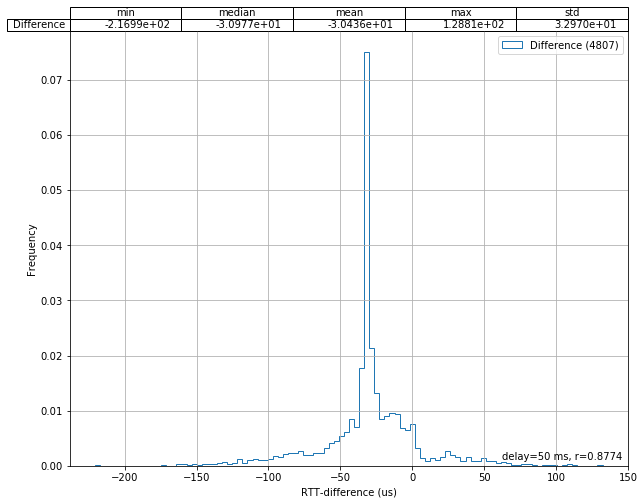

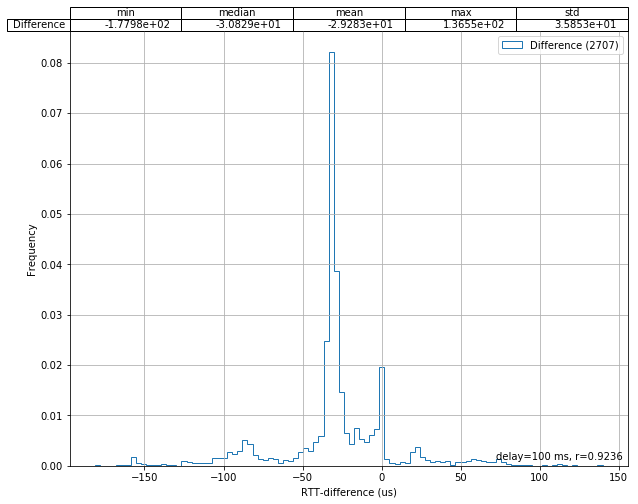

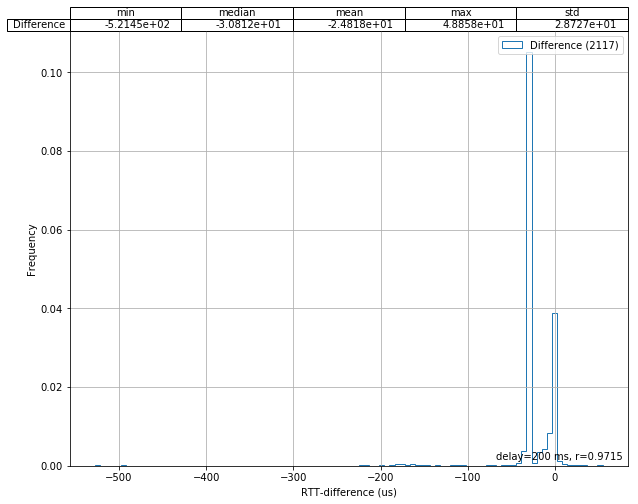

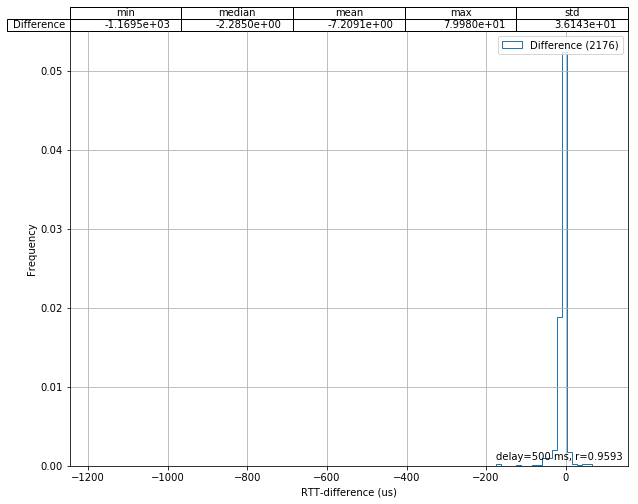

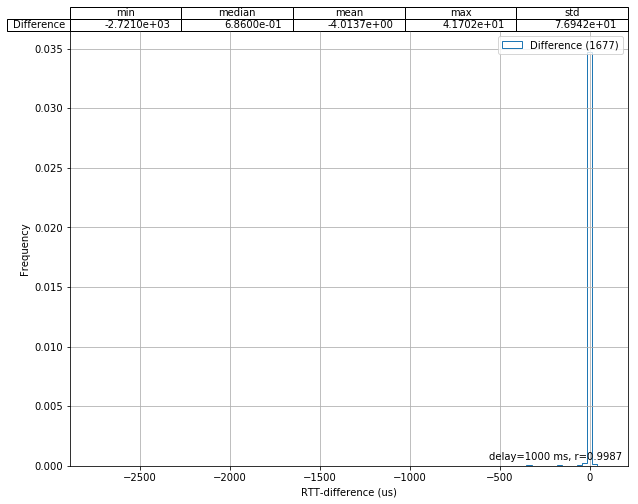

In [70]:
print("Difference: tshark - ePPing")
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt"].mean()
    common_idx = list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index)))
    d1 = pd.DataFrame({"rtt": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"rtt": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    ppa_viz.plot_rtt_diff(d1, d2, unit="us", axes=axes)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt"].values, d2["rtt"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

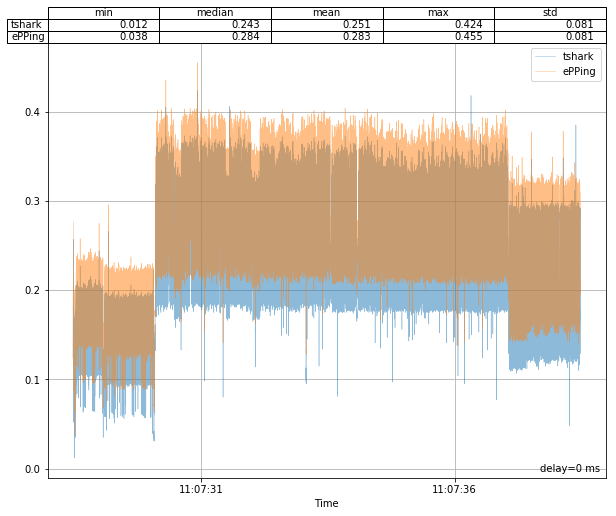

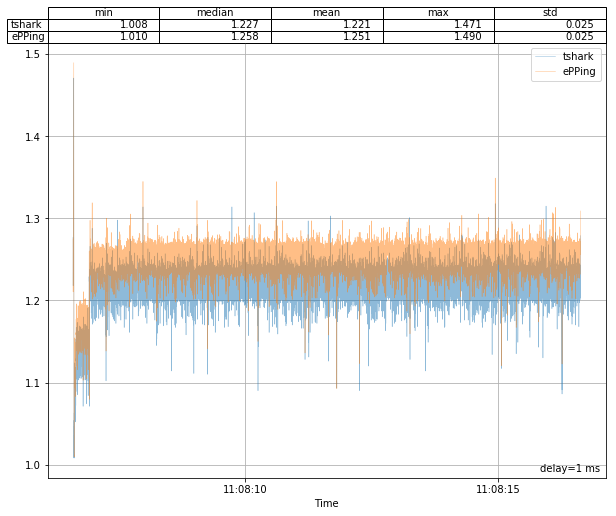

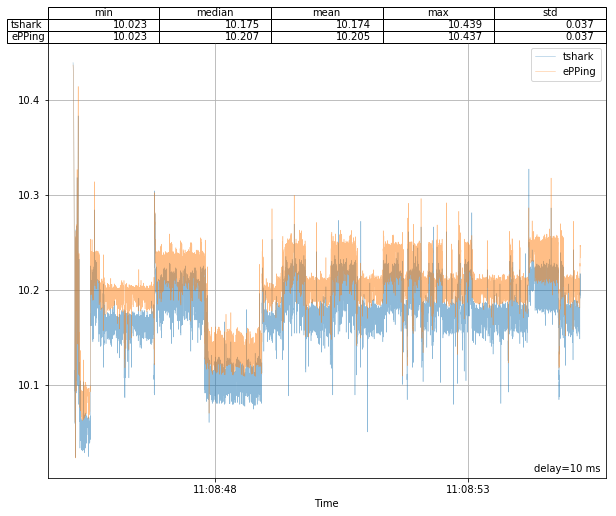

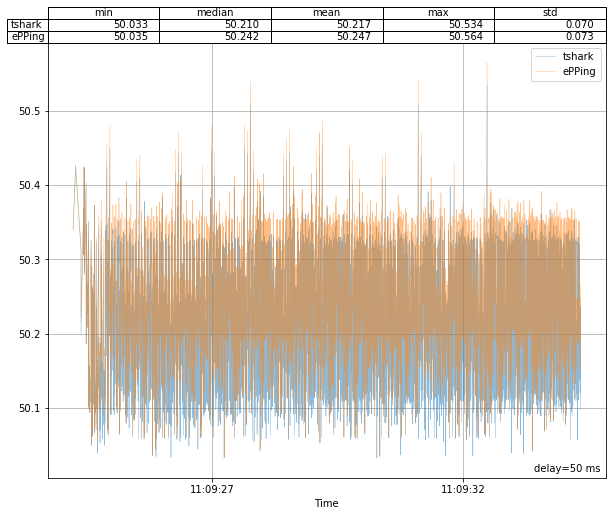

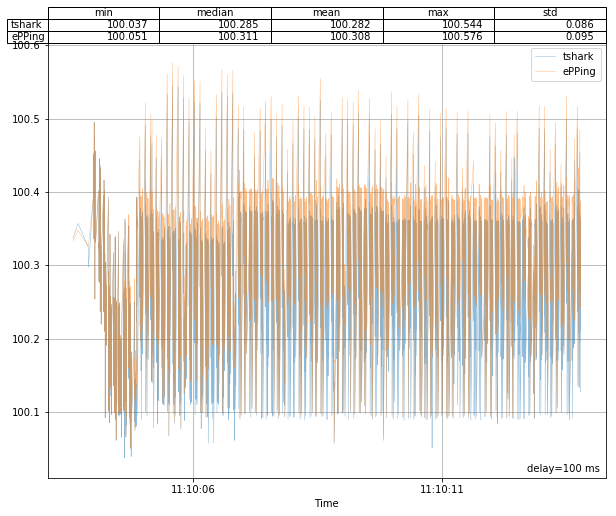

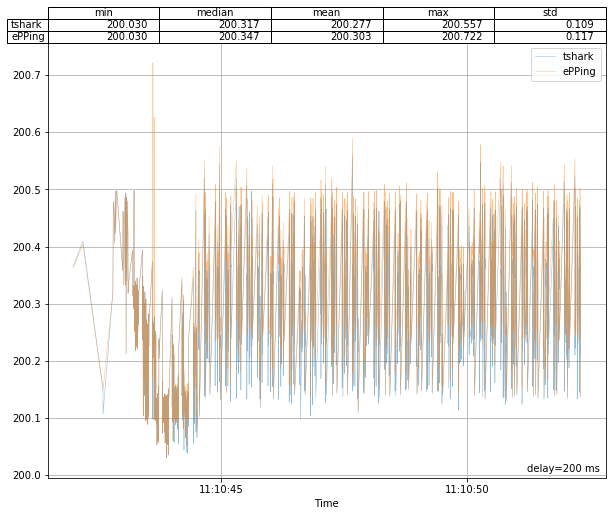

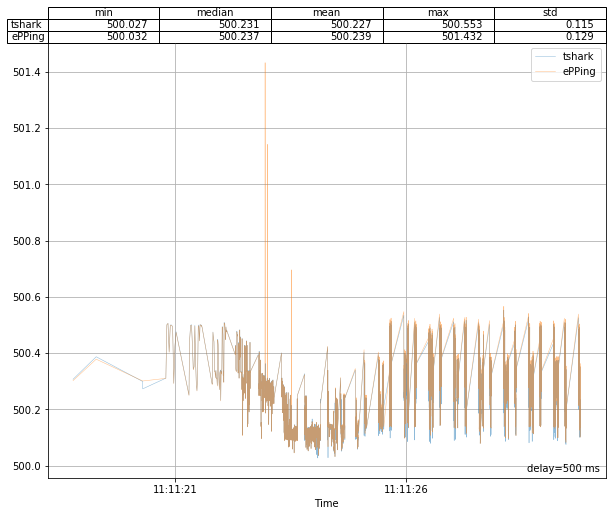

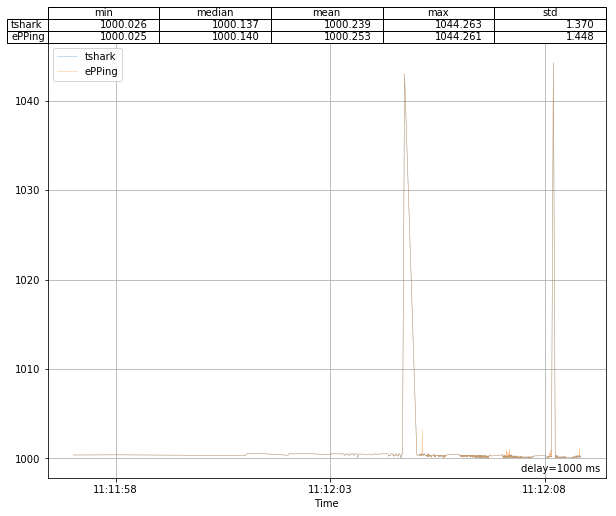

In [71]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms".format(delay), 
              va="bottom", ha="right", transform=axes.transAxes)

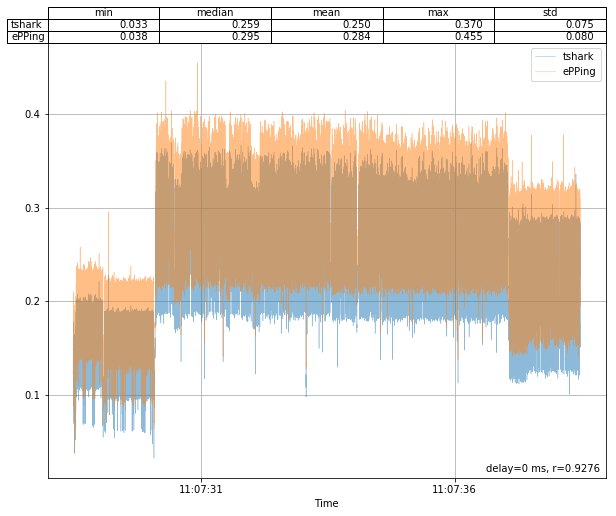

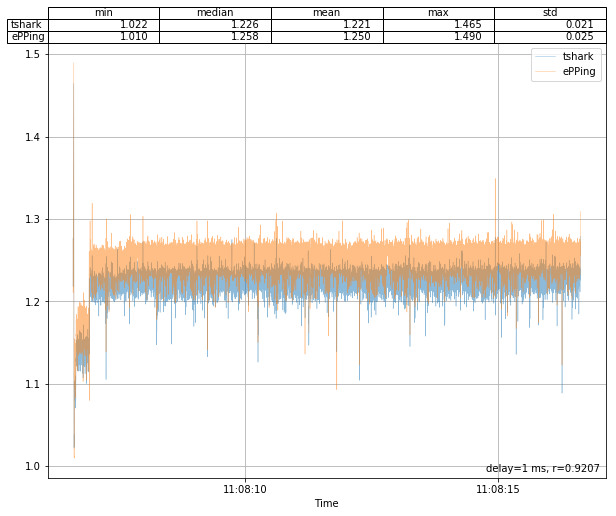

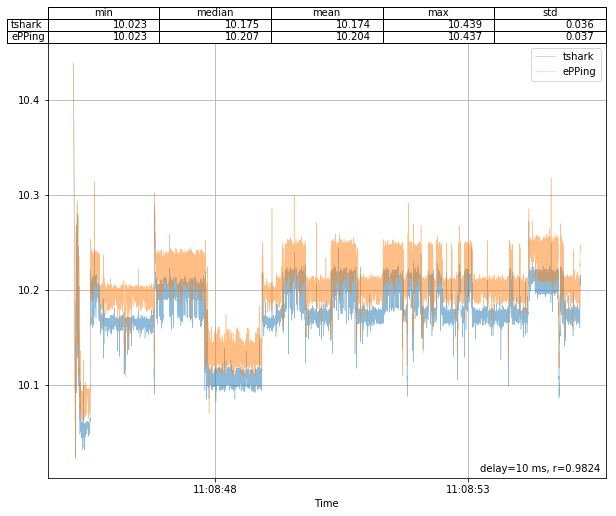

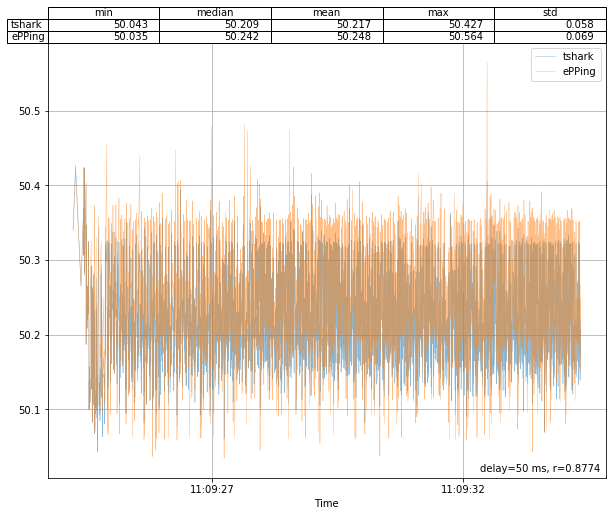

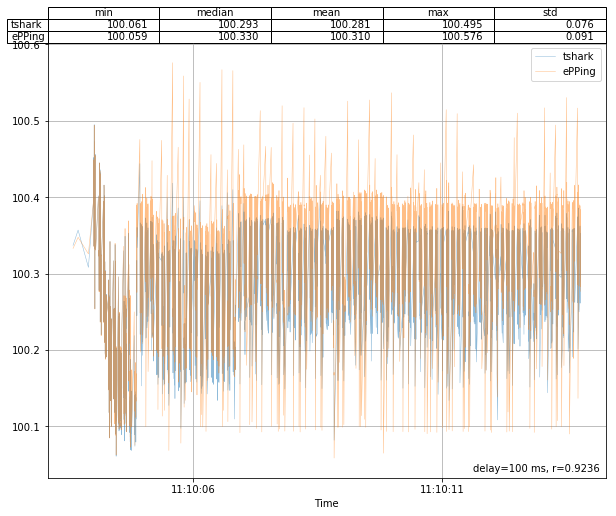

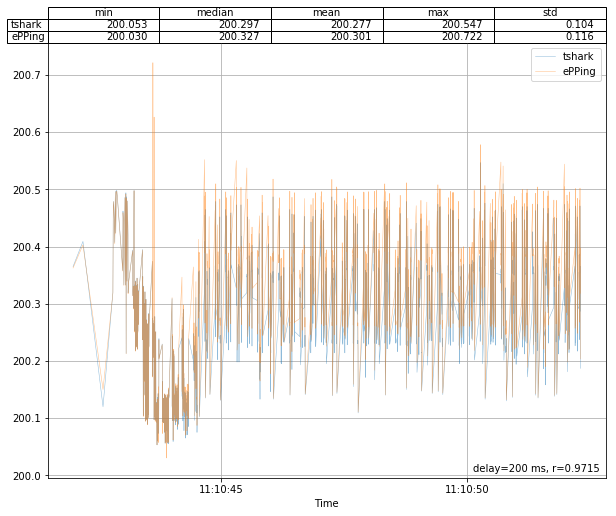

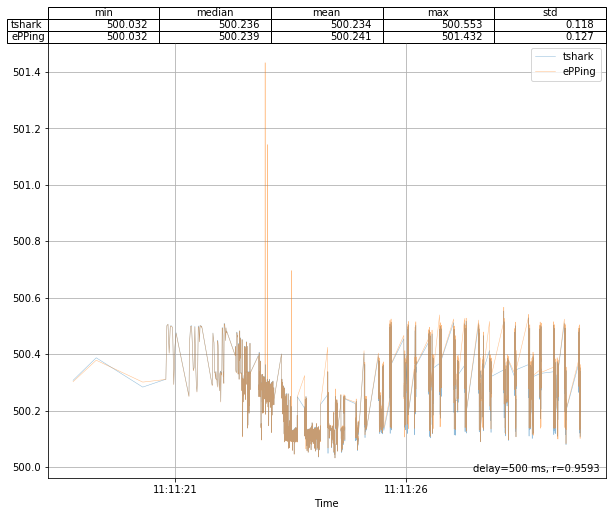

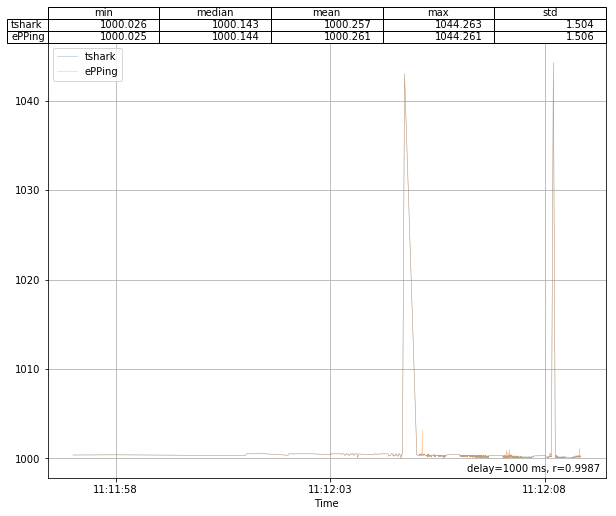

In [72]:
for delay in sorted(data.keys()):
    d1 = data[delay]["tshark"]
    d2 = data[delay]["ePPing"]
    
    rtt1 = d1.resample("ms", on="timestamp")["rtt_ms"].mean()
    rtt2 = d2.resample("ms", on="timestamp")["rtt_ms"].mean()
    common_idx = sorted(list(set(rtt1.dropna().index).intersection(set(rtt2.dropna().index))))
    d1 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt1.loc[common_idx]})
    d2 = pd.DataFrame({"timestamp": common_idx, "rtt_ms": rtt2.loc[common_idx]})
    
    fig, axes = plt.subplots(figsize=(10, 8))
    complot.plot_pergroup_timeseries({"tshark": d1, "ePPing": d2}, "rtt_ms", axes=axes, alpha=0.5, linewidth=0.5)
    axes.text(0.99, 0.01, "delay={} ms, r={:.4f}".format(
        delay, stats.pearsonr(d1["rtt_ms"].values, d2["rtt_ms"].values)[0]), 
              va="bottom", ha="right", transform=axes.transAxes)

In [73]:
data_df = util.pergroup_dict_to_df({delay: util.pergroup_dict_to_df(data[delay], group_name="rtt_tool") 
                                    for delay in data.keys()}, 
                                   group_name="delay")

In [74]:
data_df

,delay,rtt_tool,timestamp,rtt,flow,rtt_ms,rtt_off,rtt_off_ms,firstbyte
0,1,ePPing,2022-05-13 11:08:06.610634565,0.001275,10.70.2.2:8000+10.70.1.2:60044,1.275097,0.000275,0.275097,NaN
1,1,ePPing,2022-05-13 11:08:06.612109900,0.001210,10.70.2.2:8000+10.70.1.2:60044,1.210465,0.000210,0.210465,NaN
2,1,ePPing,2022-05-13 11:08:06.624655247,0.001490,10.70.2.2:8000+10.70.1.2:60044,1.489678,0.000490,0.489678,NaN
3,1,ePPing,2022-05-13 11:08:06.626103401,0.001221,10.70.2.2:8000+10.70.1.2:60044,1.220908,0.000221,0.220908,NaN
4,1,ePPing,2022-05-13 11:08:06.626452446,0.001018,10.70.2.2:8000+10.70.1.2:60044,1.017594,0.000018,0.017594,NaN
...,...,...,...,...,...,...,...,...,...
254674,10,tcptrace,NaT,0.010216,10.70.2.2:8000+10.70.1.2:60048,10.216000,0.000216,0.216000,2.482123e+09
254675,10,tcptrace,NaT,0.010215,10.70.2.2:8000+10.70.1.2:60048,10.215000,0.000215,0.215000,2.482189e+09
254676,10,tcptrace,NaT,0.010213,10.70.2.2:8000+10.70.1.2:60048,10.213000,0.000213,0.213000,2.482254e+09
254677,10,tcptrace,NaT,0.010202,10.70.2.2:8000+10.70.1.2:60048,10.202000,0.000202,0.202000,2.482319e+09
